### BADASS Analysis: amino acids

Can we distinguish five different amino acids from one another? And can we reduce the number of peptides we include in the array without negatively affecting model performance?

#### Analytes

Amino acids:
- Glutamate (E)
- Arginine (R)
- Serine (S)
- Valine (V)
- Tryptophan (W)

In [1]:
# Import from array_sensing package
from subroutines.parse_array_data import ParseArrayData
from subroutines.train import RunML, draw_conf_matrices

In [2]:
import copy
import math
import os
import pickle
import random
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from collections import OrderedDict
from IPython.display import display
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score, cohen_kappa_score, make_scorer
)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC, SVC

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size

#### Parse in input data

Large array amino acid data

In [3]:
aa_fluor_data = ParseArrayData(
    data_dirs_dict={'DPH': '/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/'
                           'AAs/Reformatted_AA_csvs/'},
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_plate_parsing_plots/',
    repeat_labels_list=['repeat_1', 'repeat_2', 'repeat_3', 'repeat_4', 'repeat_5', 'repeat_6', 'repeat_7',
                        'repeat_8', 'repeat_9', 'repeat_10'],
    peptide_dict = {'DPH': ['No Pep', 'CCPent', 'QLKEIA', 'CCHex2-I24K', 'CCHept-I24N', 'CCHept-L28W',
                            'GRP22', 'CCHex', 'NLKEIA', 'CCHept-L28K', 'CCHept-I24T', 'CCHept-L7Y',
                            'GRP35', 'CCHex2', 'CCHept-I17G-L21G', 'CCHept-I17H', 'CCHept-I24H', 'CCHept-L28Y',
                            'GRP46', 'CCHept', 'CCHept-I17A-L21A', 'CCHept-I17K-L24E', 'CCHept-L21S-I24S',
                            'CCHept-I24Y', 'GRP51', 'CCHept-I24D', 'CCHept-L14A', 'CCHept-L7K',
                            'CCHept-L21N-I24N', 'CCHept-L21S-I24Y', 'GRP52', 'CCHept-I24E', 'CCHept-L21A',
                            'CCHept-L21K-I24E', 'CCHept-L21T-I24T', 'CCHept-L21Y-I24S', 'GRP63', 'CCHept-I24K',
                            'CCHept-L21K', 'CCHept-L21E-I24K', 'CCHept-L21H-I24H', 'CCHept-I17T', 'GRP80',
                            'CCHept-I17K', 'CCPent-I24K', 'CCHept-I24S', 'CCHept-L7W', 'CCHept-I24P']},
    control_peptides={'DPH': ['GRP35']},
    control_analytes=[]
)

Locate xlsx files

In [4]:
aa_fluor_data.group_xlsx_repeats()

In [5]:
aa_fluor_data.repeat_dict

OrderedDict([('repeat_1',
              OrderedDict([('DPH',
                            ['E_repeat_1.xlsx',
                             'R_repeat_1.xlsx',
                             'S_repeat_1.xlsx',
                             'V_repeat_1.xlsx',
                             'W_repeat_1.xlsx'])])),
             ('repeat_2',
              OrderedDict([('DPH',
                            ['E_repeat_2.xlsx',
                             'R_repeat_2.xlsx',
                             'S_repeat_2.xlsx',
                             'V_repeat_2.xlsx',
                             'W_repeat_2.xlsx'])])),
             ('repeat_3',
              OrderedDict([('DPH',
                            ['E_repeat_3.xlsx',
                             'R_repeat_3.xlsx',
                             'S_repeat_3.xlsx',
                             'V_repeat_3.xlsx',
                             'W_repeat_3.xlsx'])])),
             ('repeat_4',
              OrderedDict([('DPH',
                     

Read the data in each xlsx file into a dataframe and perform min-max scaling

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_1.xlsx
Drawing scatter plot of data spread for E_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

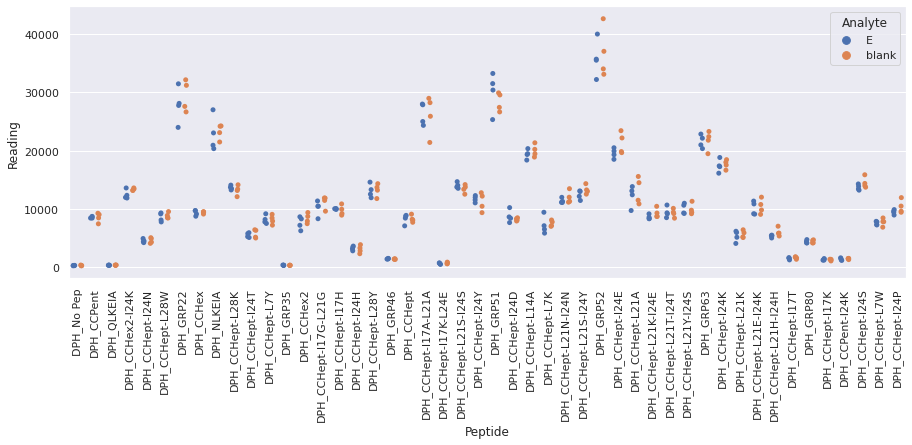

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx
Drawing scatter plot of data spread for R_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

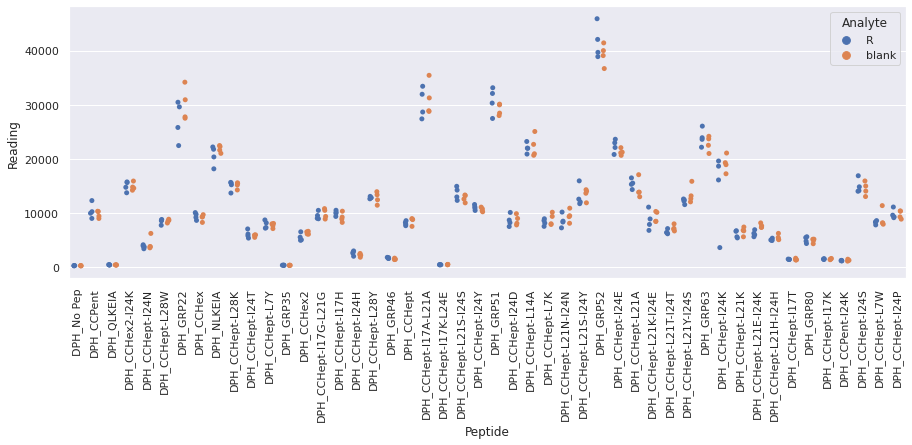

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_1.xlsx
Drawing scatter plot of data spread for S_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

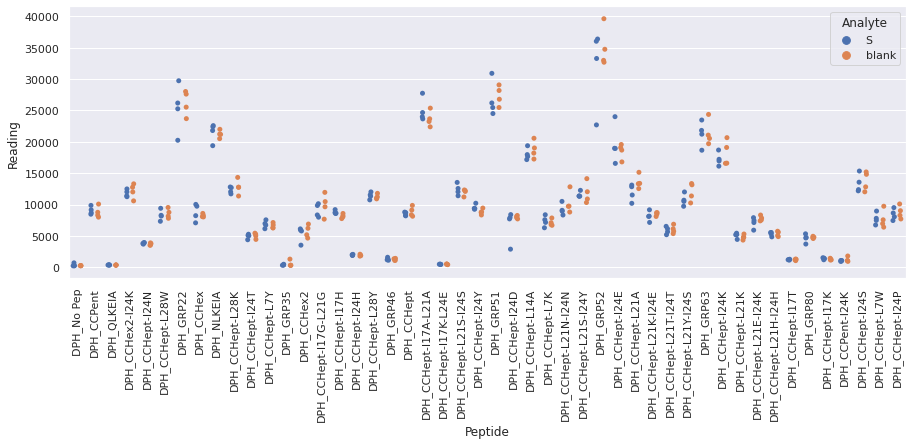

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_1.xlsx
Drawing scatter plot of data spread for V_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

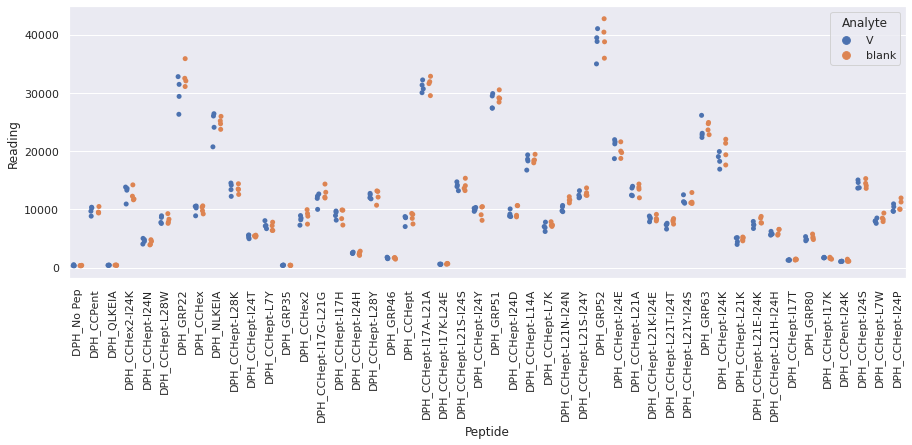

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_1.xlsx
Drawing scatter plot of data spread for W_repeat_1 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

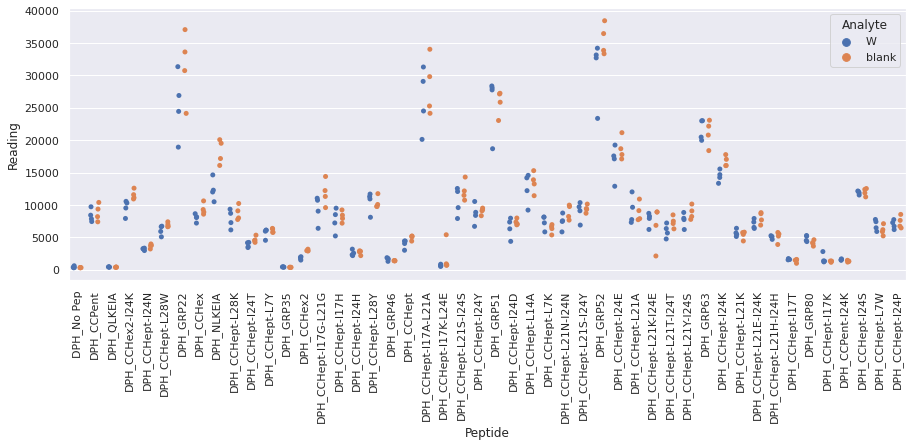

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_2.xlsx
Drawing scatter plot of data spread for E_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

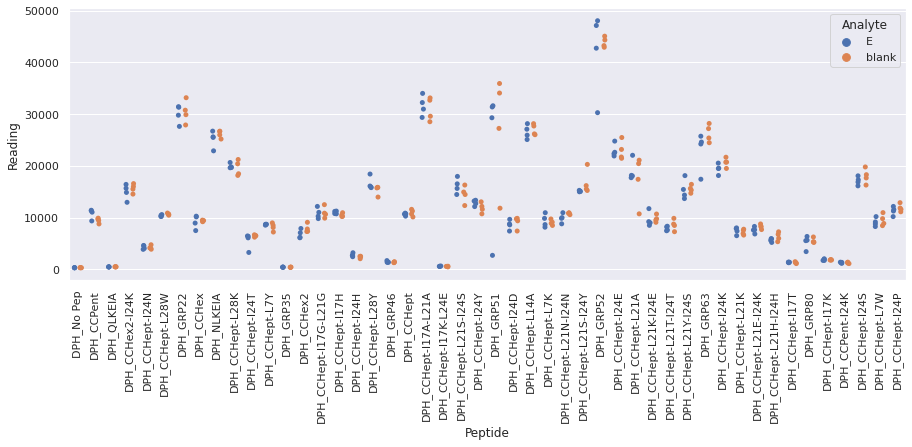

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_2.xlsx
Drawing scatter plot of data spread for R_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

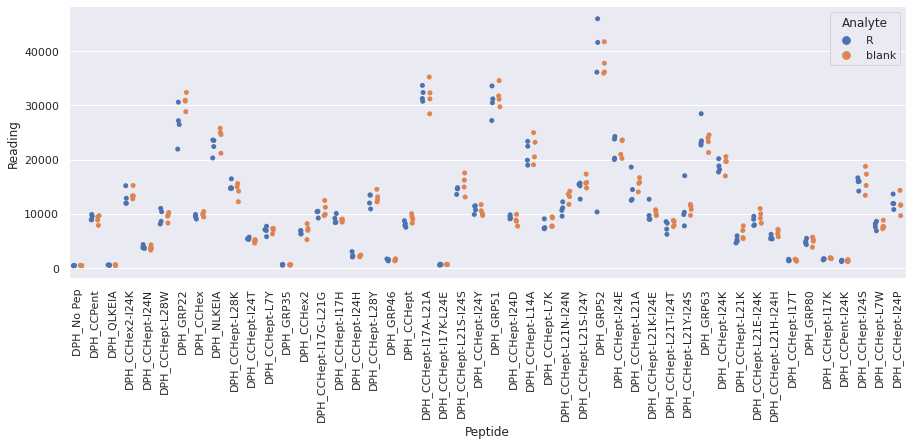

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_2.xlsx
Drawing scatter plot of data spread for S_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

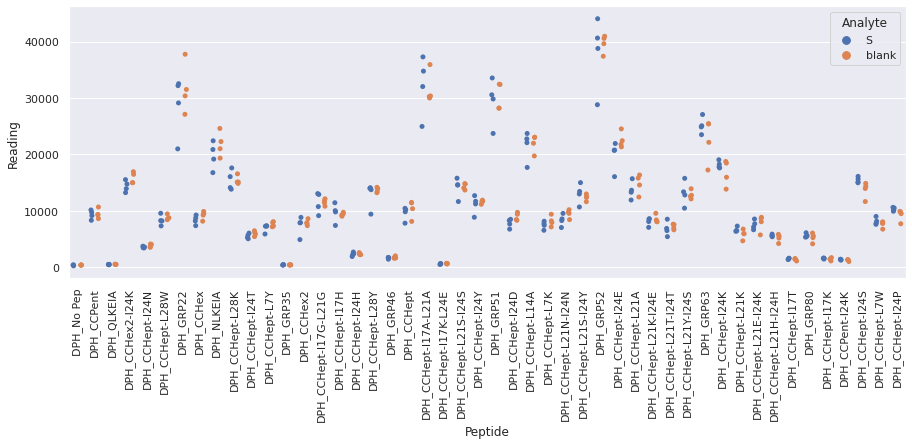

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_2.xlsx
Drawing scatter plot of data spread for V_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

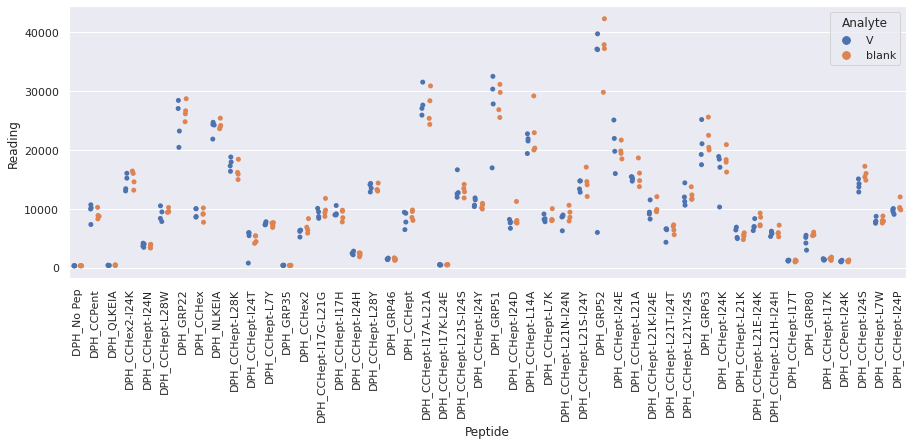

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_2.xlsx
Drawing scatter plot of data spread for W_repeat_2 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

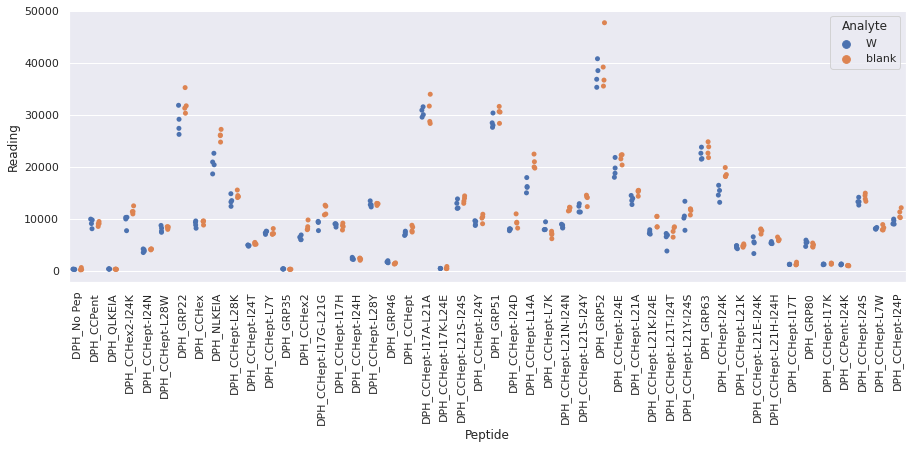

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_3.xlsx
Drawing scatter plot of data spread for E_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

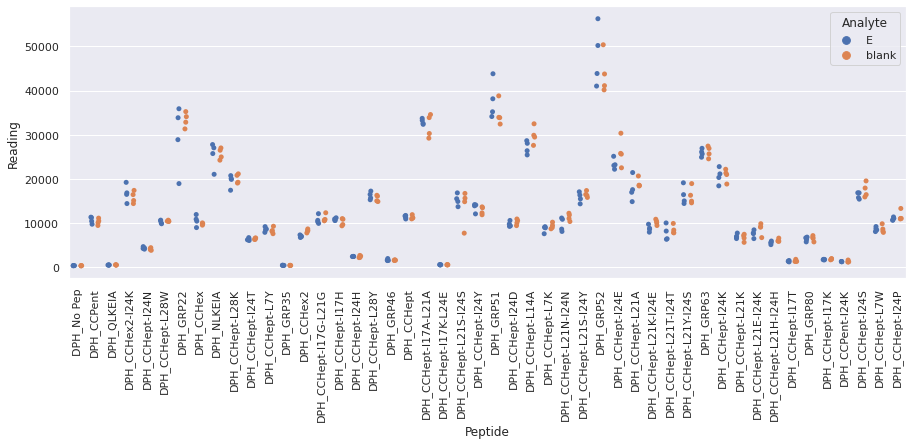

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_3.xlsx
Drawing scatter plot of data spread for R_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

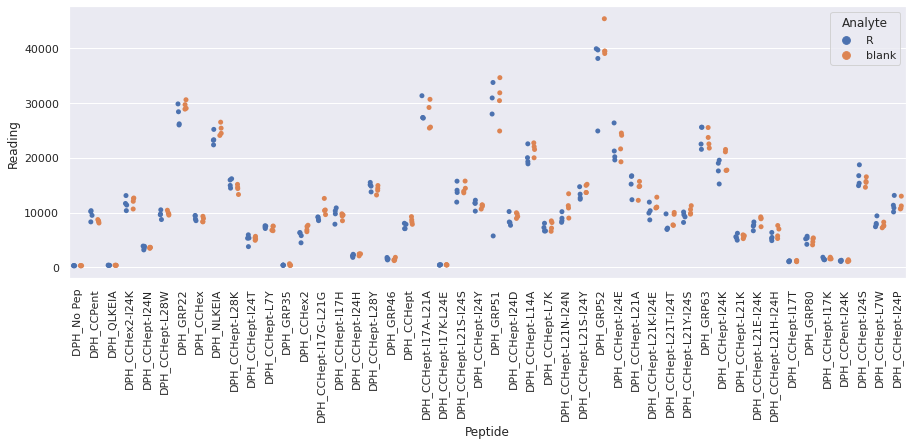

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_3.xlsx
Drawing scatter plot of data spread for S_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

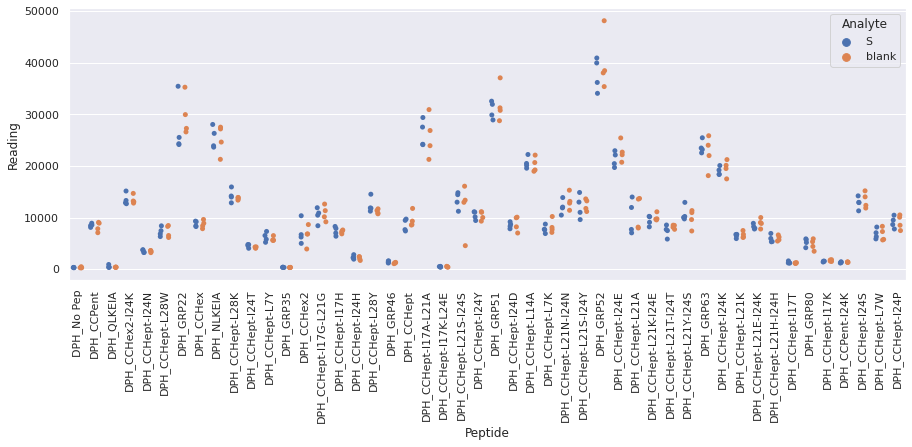

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_3.xlsx
Drawing scatter plot of data spread for V_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

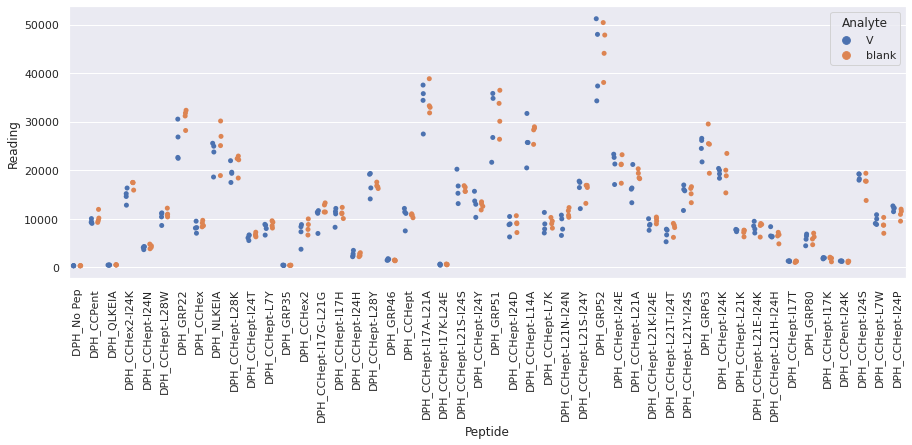

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_3.xlsx
Drawing scatter plot of data spread for W_repeat_3 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

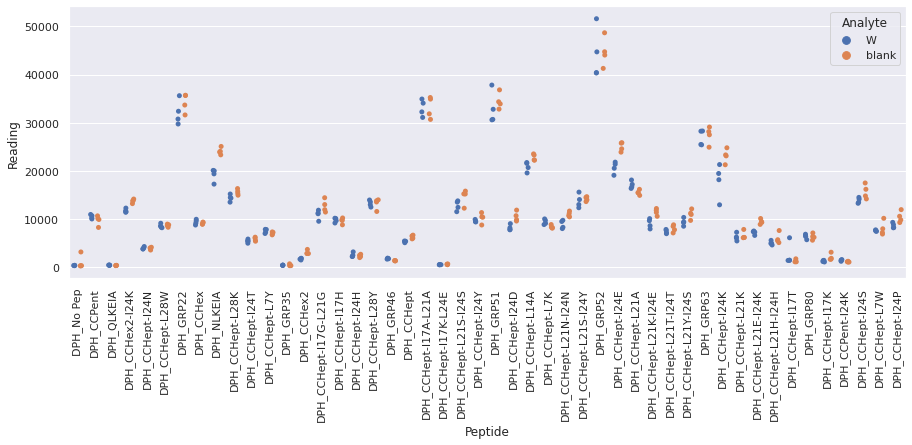

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_4.xlsx
Drawing scatter plot of data spread for E_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

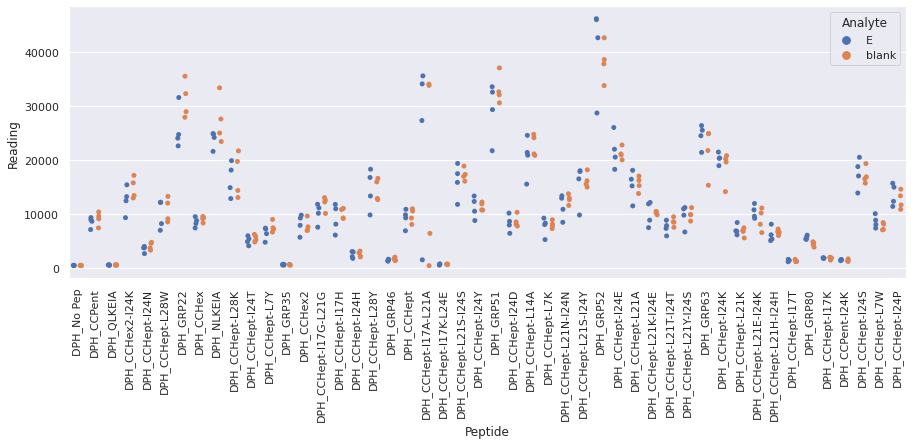

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_4.xlsx
Drawing scatter plot of data spread for R_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

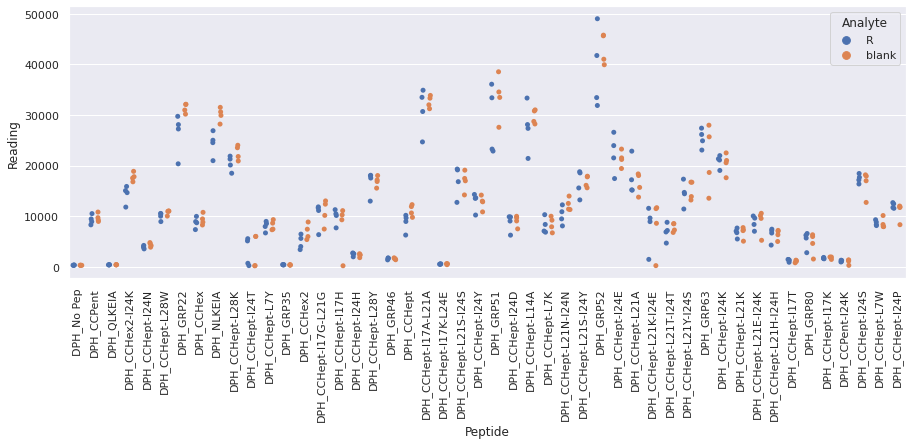

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_4.xlsx
Drawing scatter plot of data spread for S_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

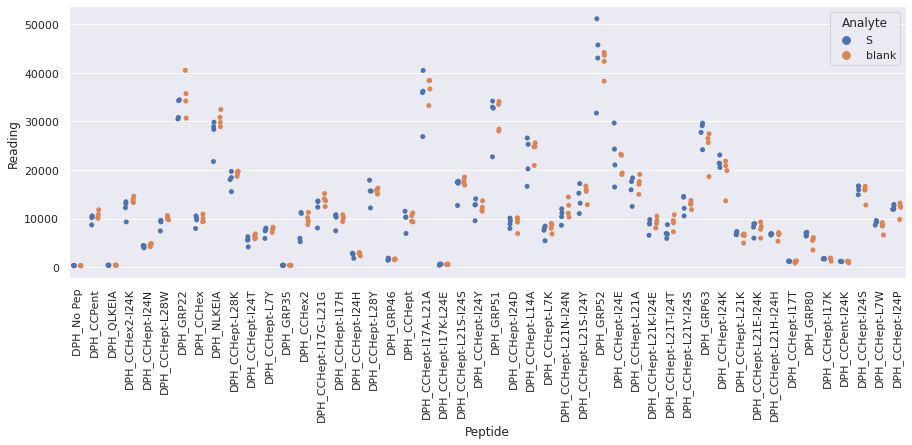

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_4.xlsx
Drawing scatter plot of data spread for V_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

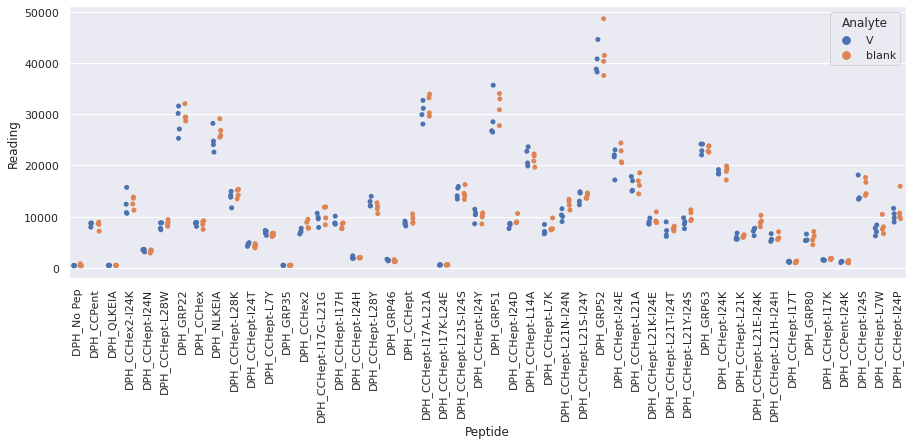

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_4.xlsx
Drawing scatter plot of data spread for W_repeat_4 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

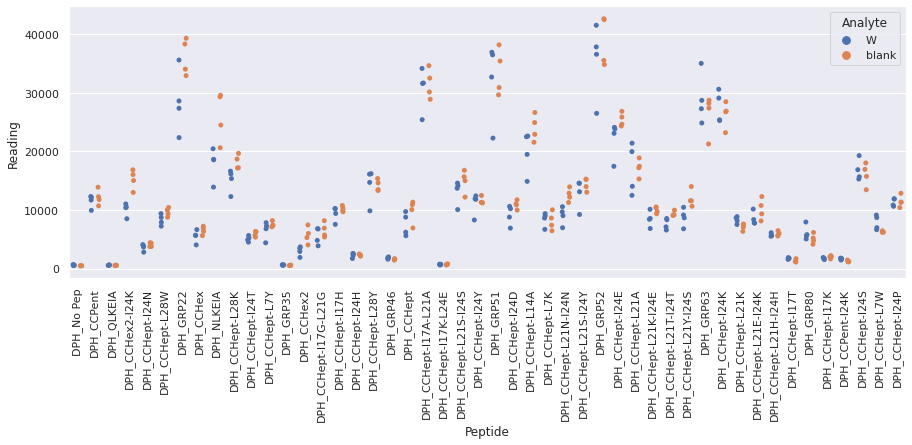

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_5.xlsx
Drawing scatter plot of data spread for E_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

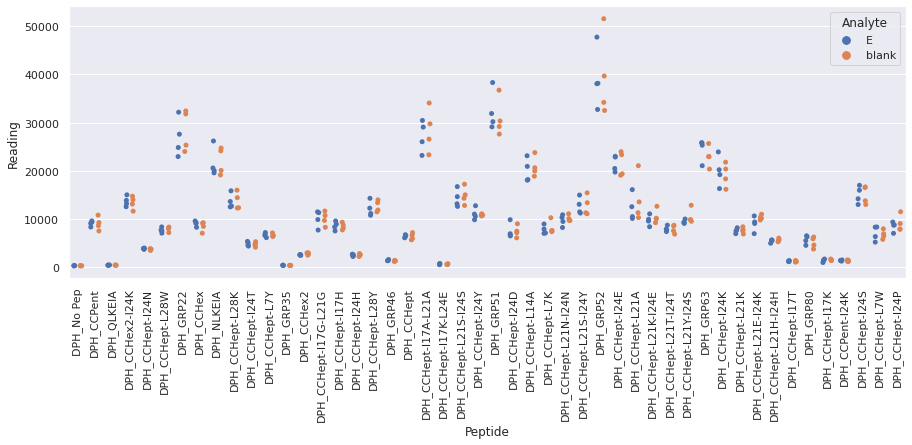

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_5.xlsx
Drawing scatter plot of data spread for R_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

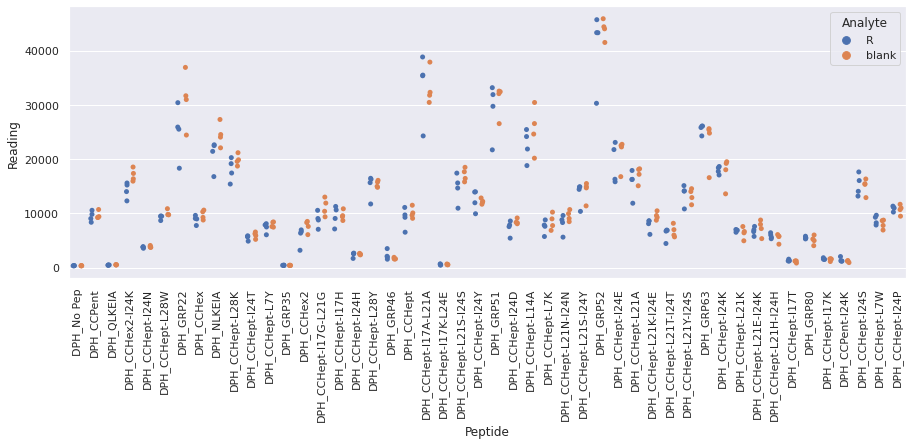

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_5.xlsx
Drawing scatter plot of data spread for S_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

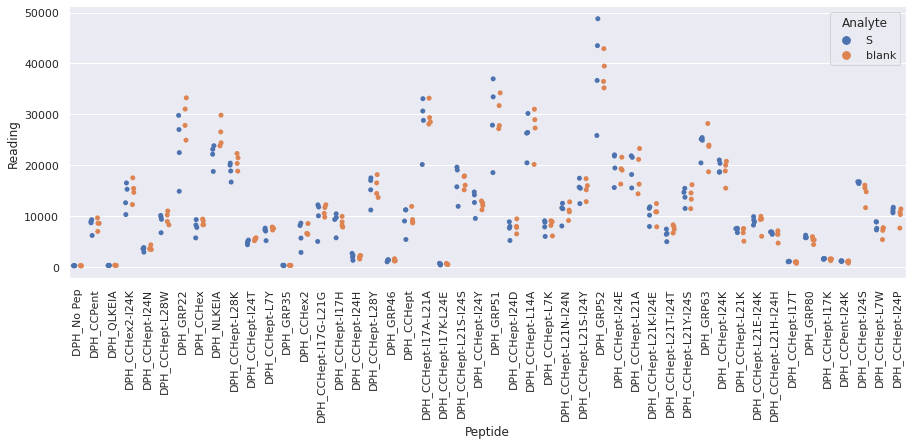

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_5.xlsx
Drawing scatter plot of data spread for V_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

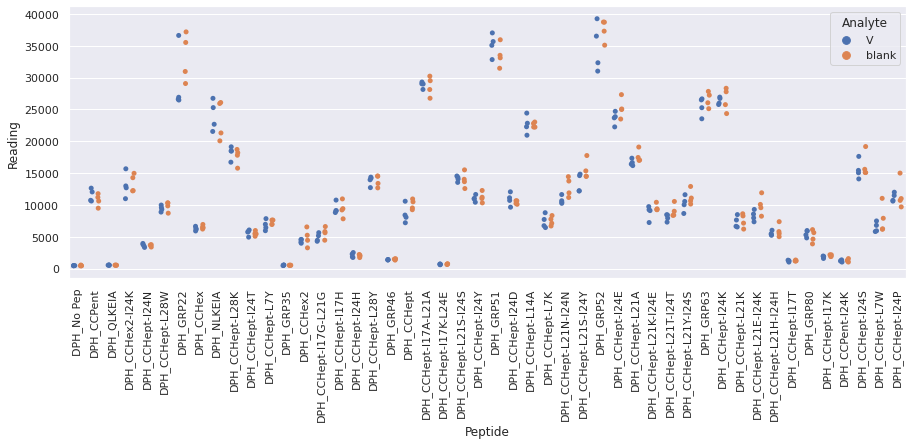

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_5.xlsx
Drawing scatter plot of data spread for W_repeat_5 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

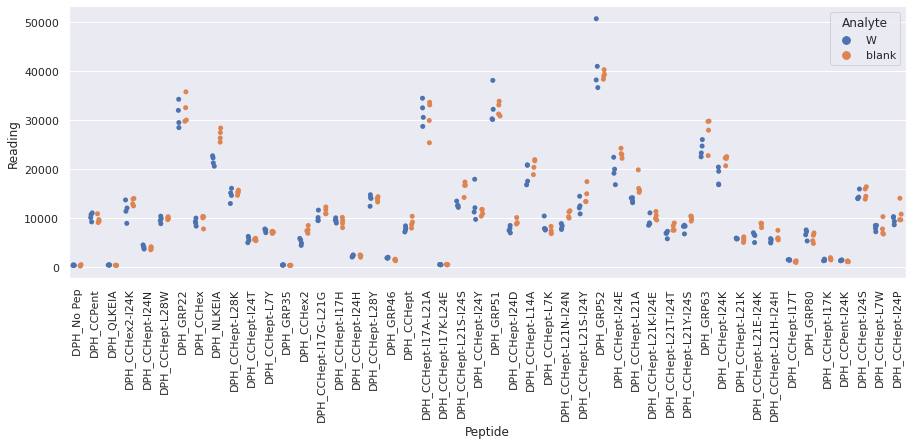

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_6.xlsx
Drawing scatter plot of data spread for E_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

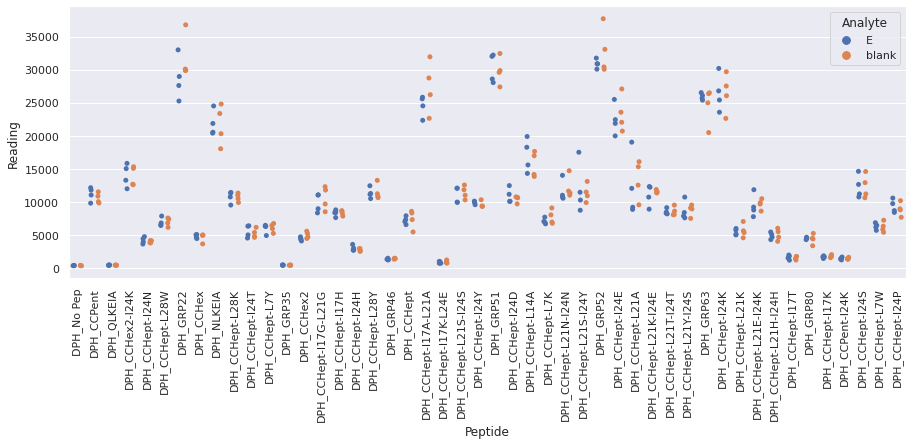

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_6.xlsx
Drawing scatter plot of data spread for R_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

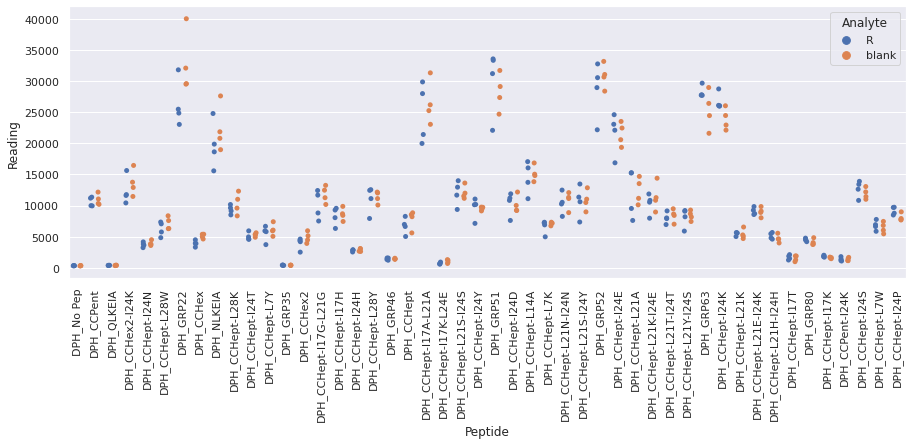

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_6.xlsx
Drawing scatter plot of data spread for S_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

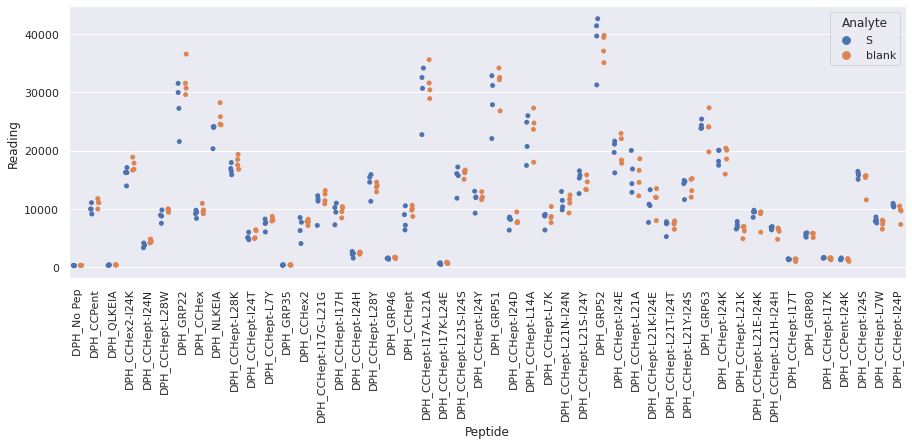

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_6.xlsx
Drawing scatter plot of data spread for V_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

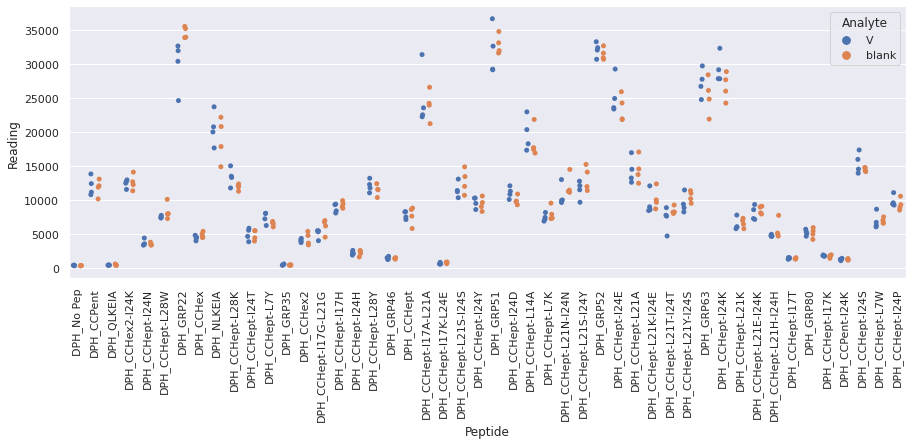

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_6.xlsx
Drawing scatter plot of data spread for W_repeat_6 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

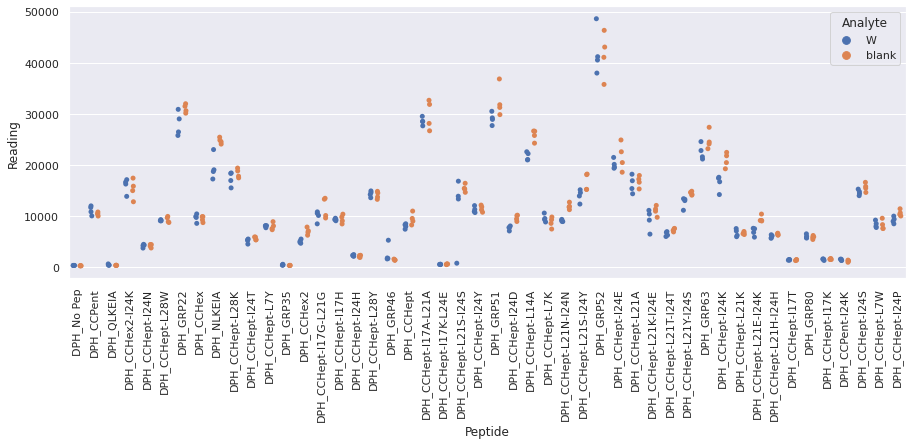

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_7.xlsx
Drawing scatter plot of data spread for E_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

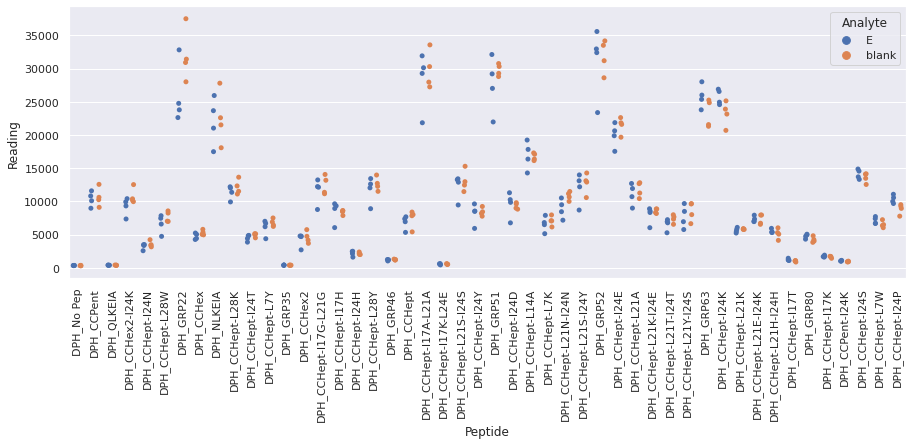

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_7.xlsx
Drawing scatter plot of data spread for R_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

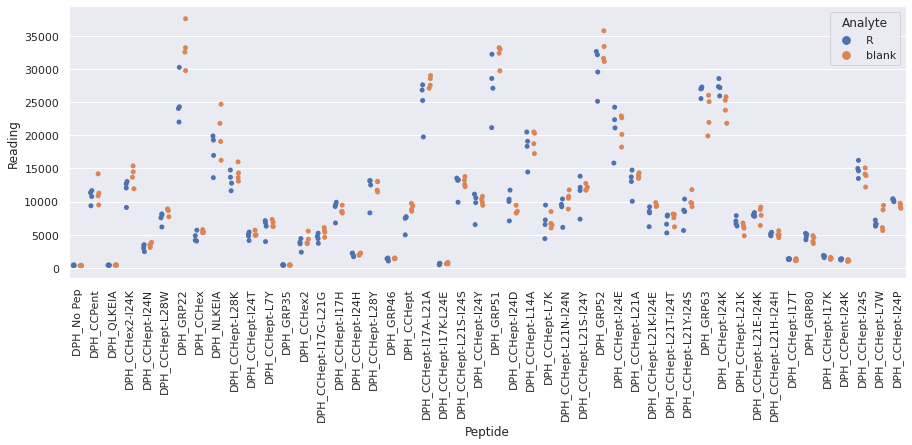

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_7.xlsx
Drawing scatter plot of data spread for S_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

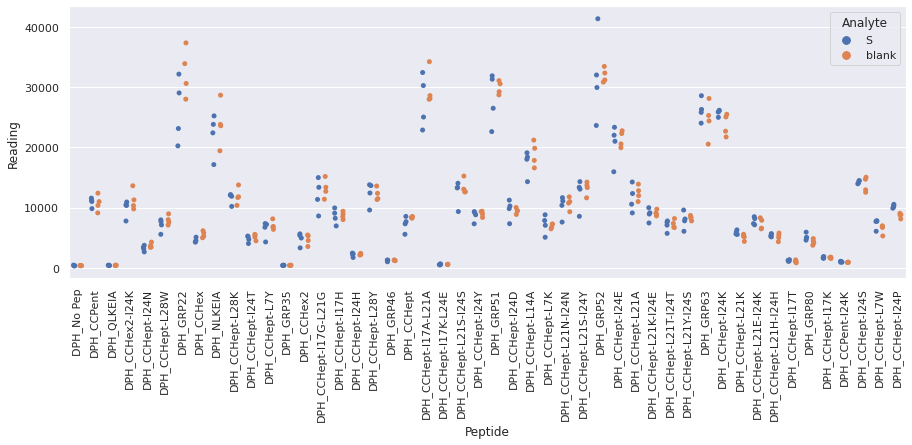

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_7.xlsx
Drawing scatter plot of data spread for V_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

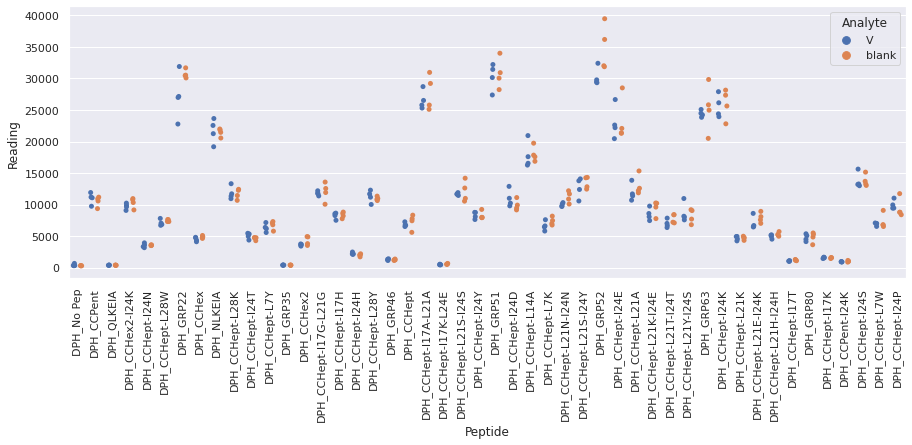

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_7.xlsx
Drawing scatter plot of data spread for W_repeat_7 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

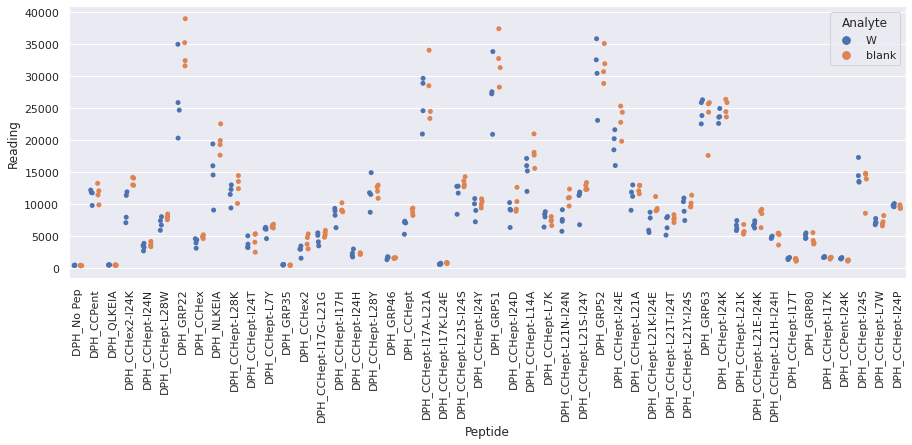

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_8.xlsx
Drawing scatter plot of data spread for E_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

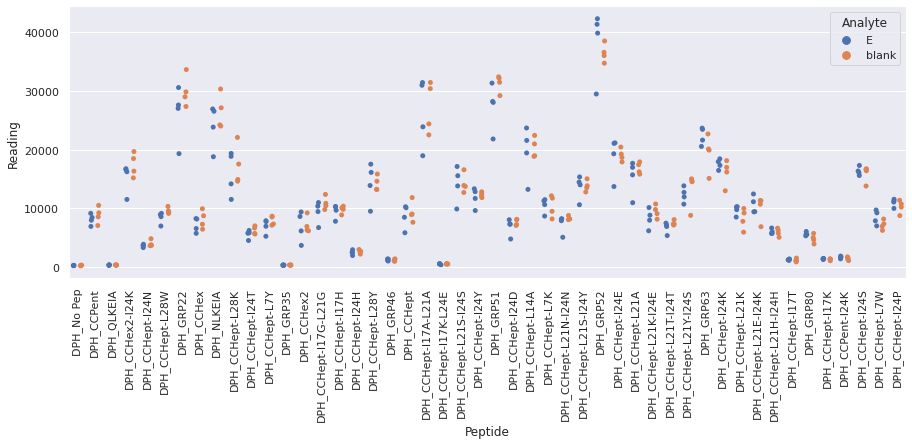

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_8.xlsx
Drawing scatter plot of data spread for R_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

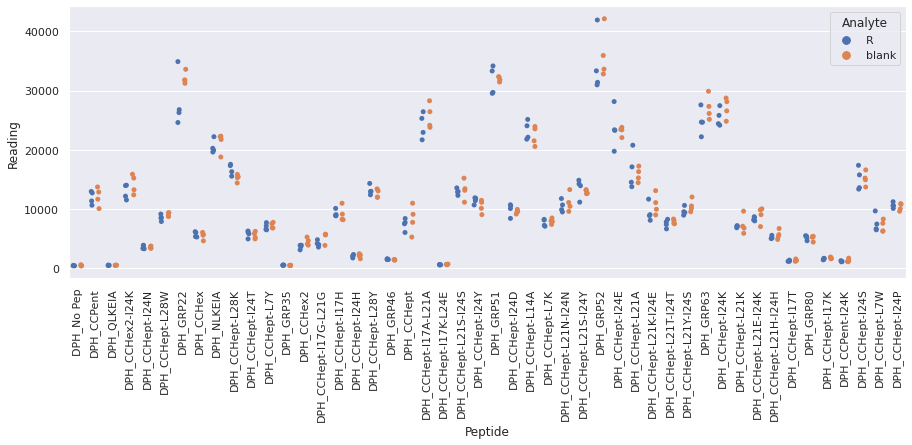

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_8.xlsx
Drawing scatter plot of data spread for S_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

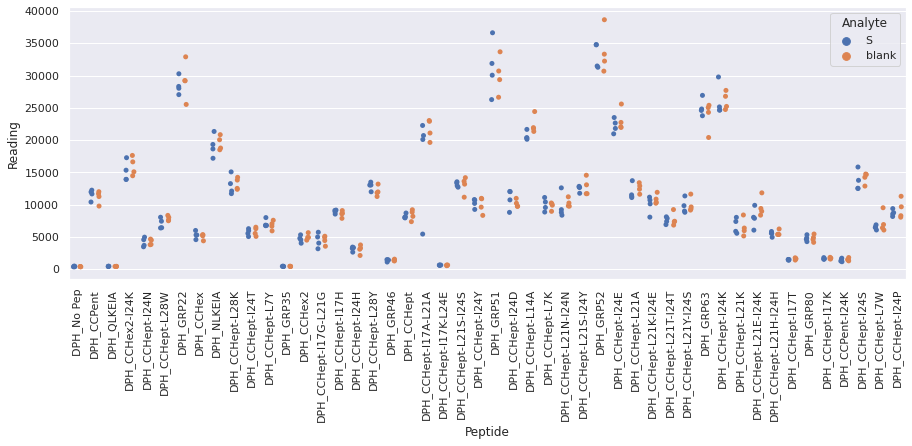

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_8.xlsx
Drawing scatter plot of data spread for V_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

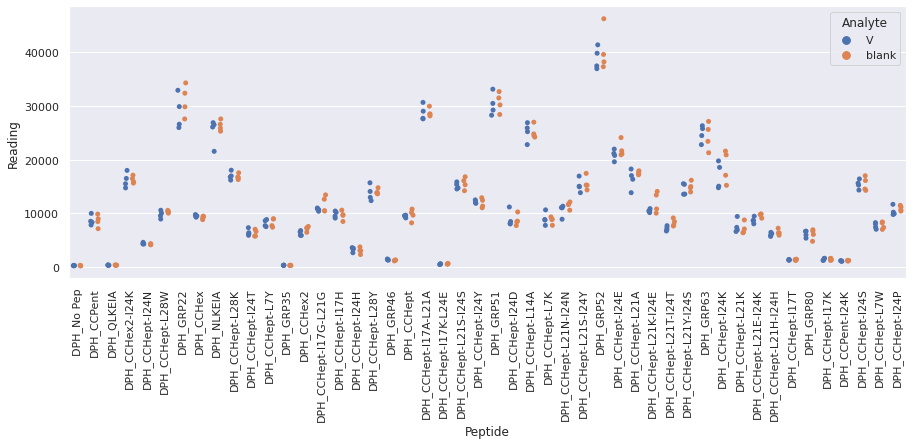

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_8.xlsx
Drawing scatter plot of data spread for W_repeat_8 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

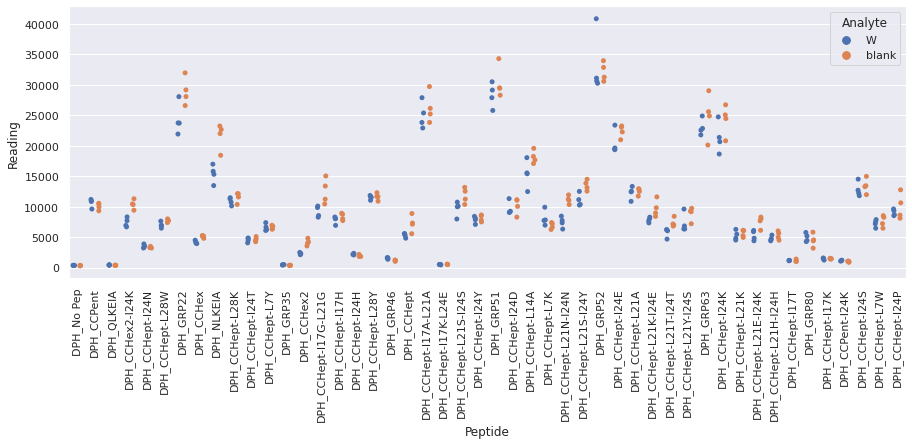

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_9.xlsx
Drawing scatter plot of data spread for E_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

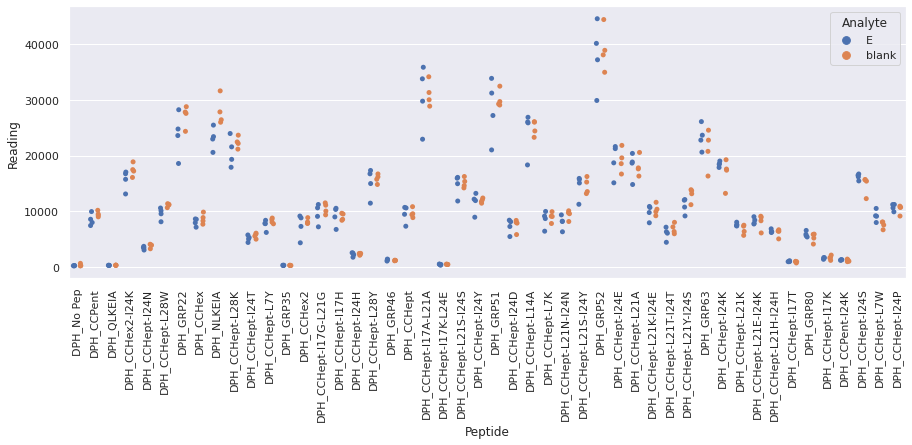

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx
Drawing scatter plot of data spread for R_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

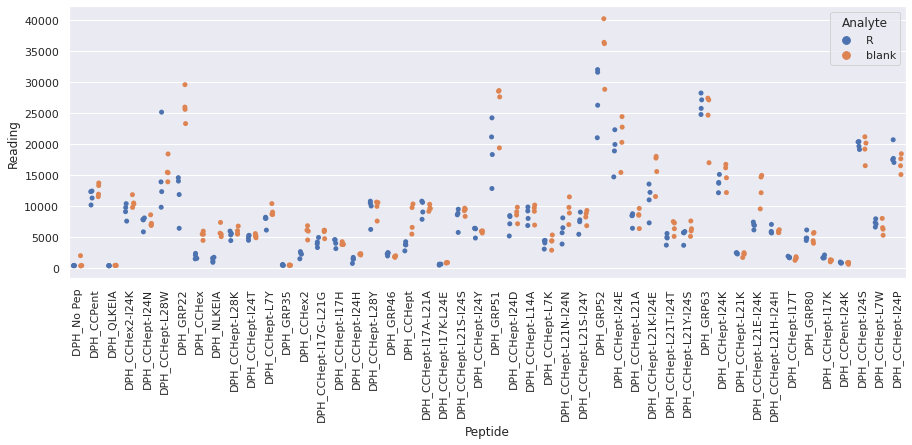

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_9.xlsx
Drawing scatter plot of data spread for S_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

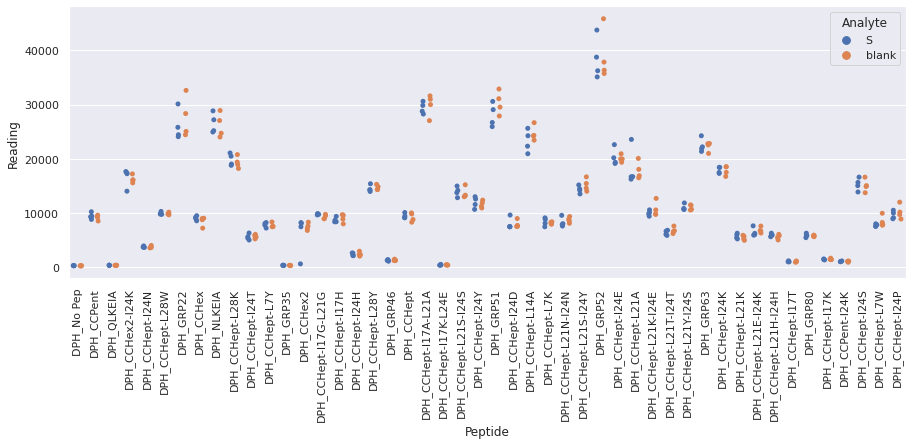

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_9.xlsx
Drawing scatter plot of data spread for V_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

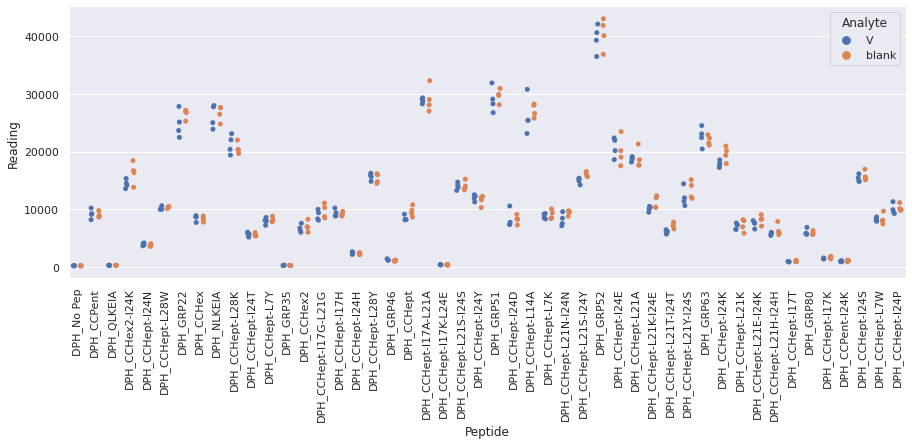

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_9.xlsx
Drawing scatter plot of data spread for W_repeat_9 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

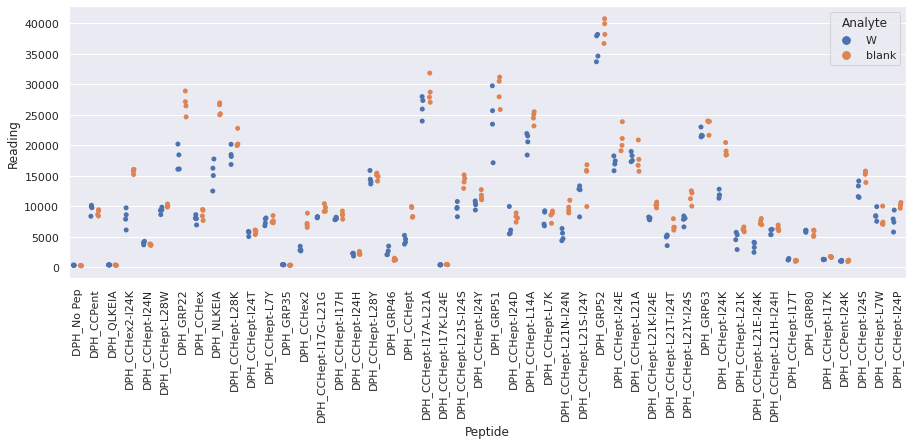

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/E_repeat_10.xlsx
Drawing scatter plot of data spread for E_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

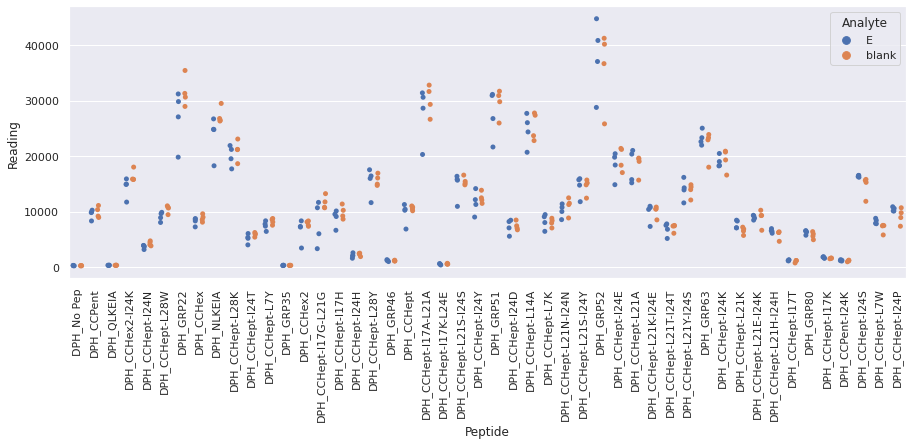

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_10.xlsx
Drawing scatter plot of data spread for R_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

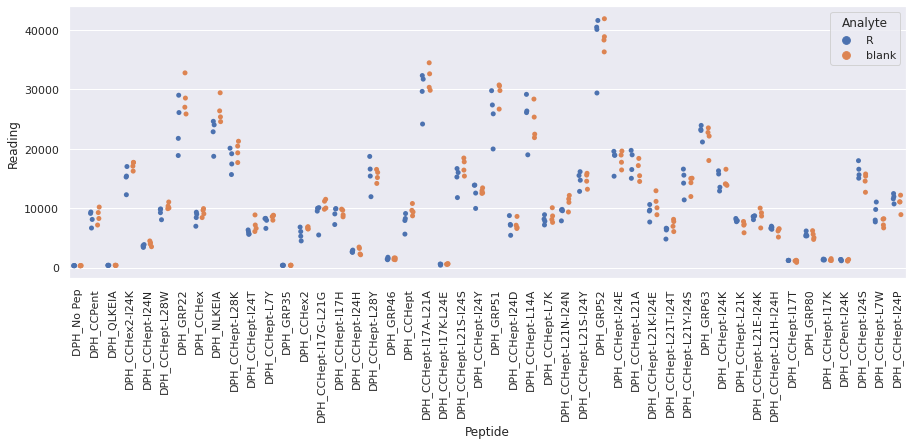

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/S_repeat_10.xlsx
Drawing scatter plot of data spread for S_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

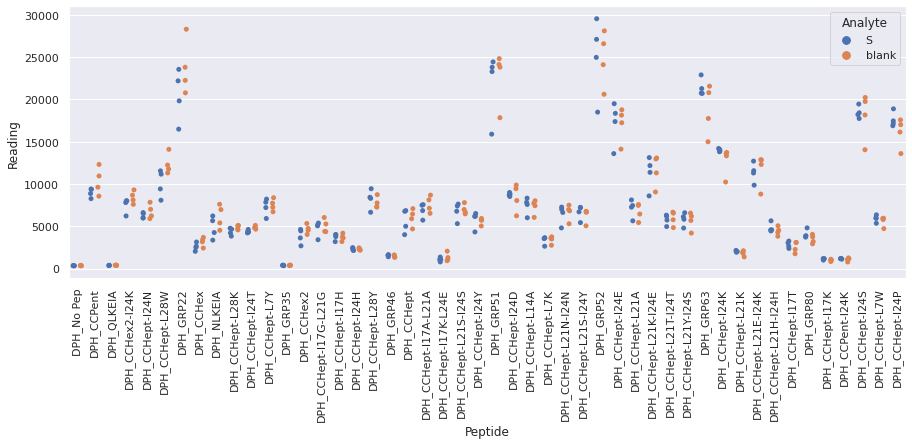

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/V_repeat_10.xlsx
Drawing scatter plot of data spread for V_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

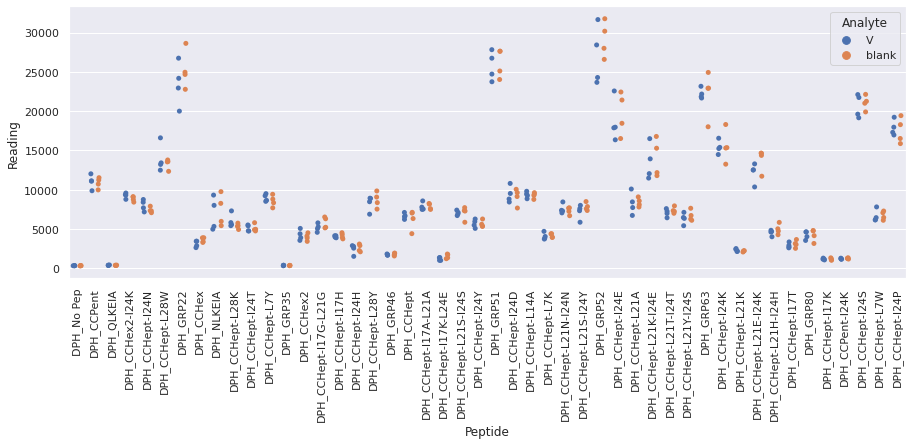

Parsing plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/W_repeat_10.xlsx
Drawing scatter plot of data spread for W_repeat_10 in AA_unscaled_data


<Figure size 720x720 with 0 Axes>

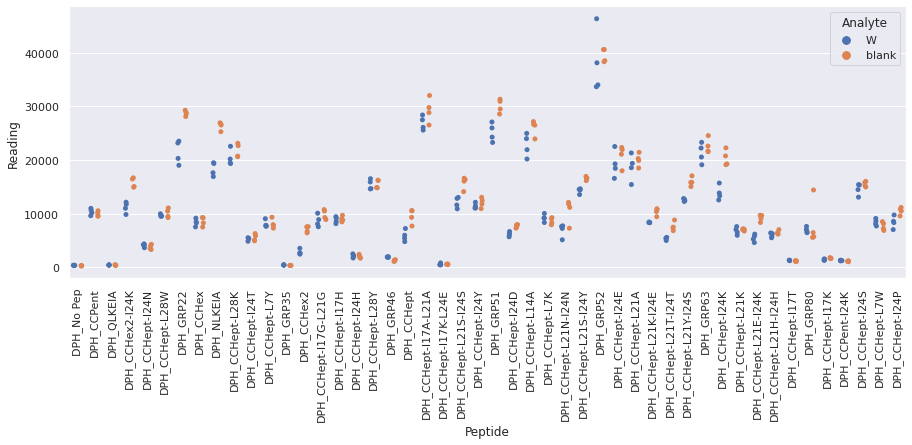

Drawing scatter plot of data spread for E_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

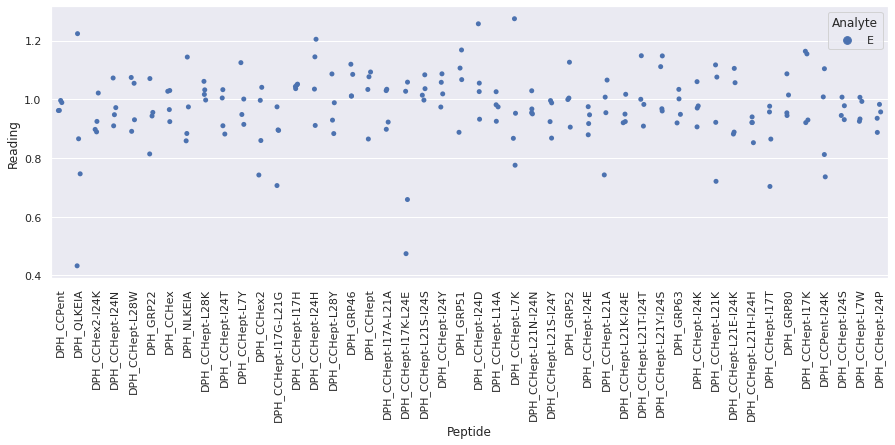

Drawing scatter plot of data spread for R_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

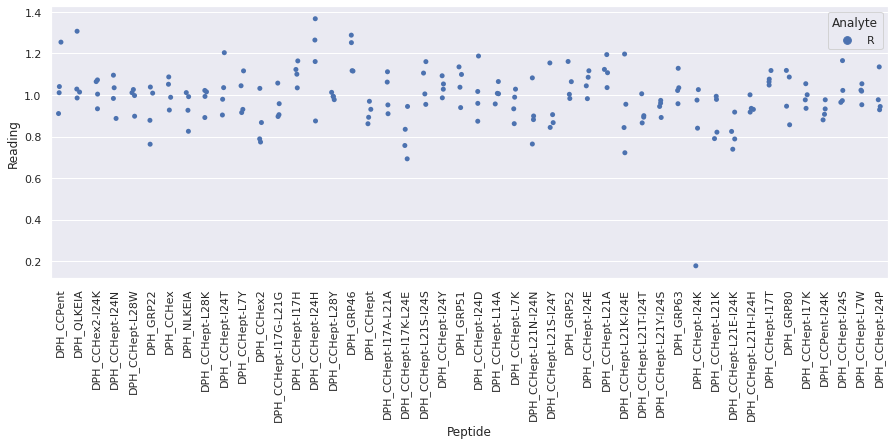

Drawing scatter plot of data spread for S_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

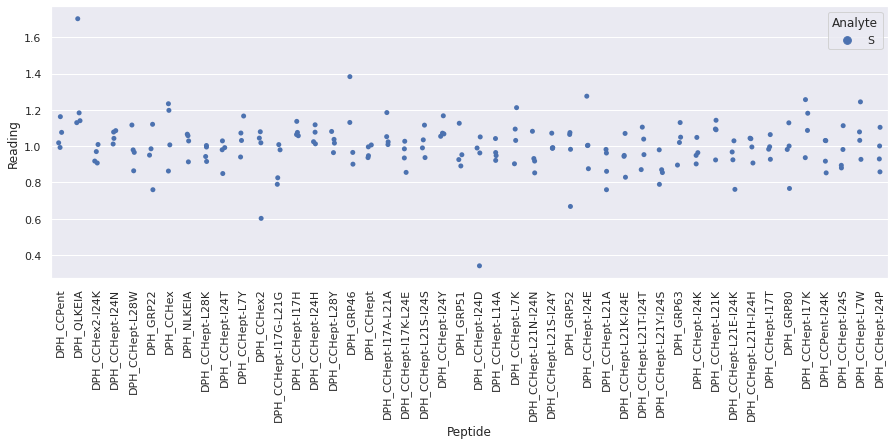

Drawing scatter plot of data spread for V_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

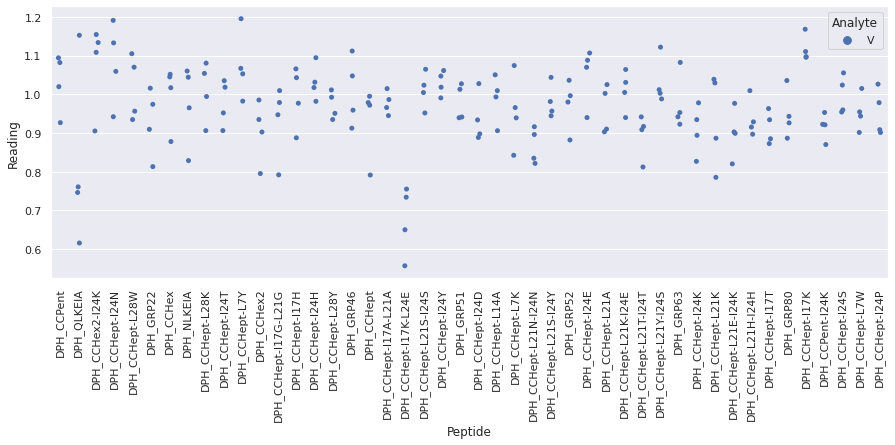

Drawing scatter plot of data spread for W_repeat_1 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

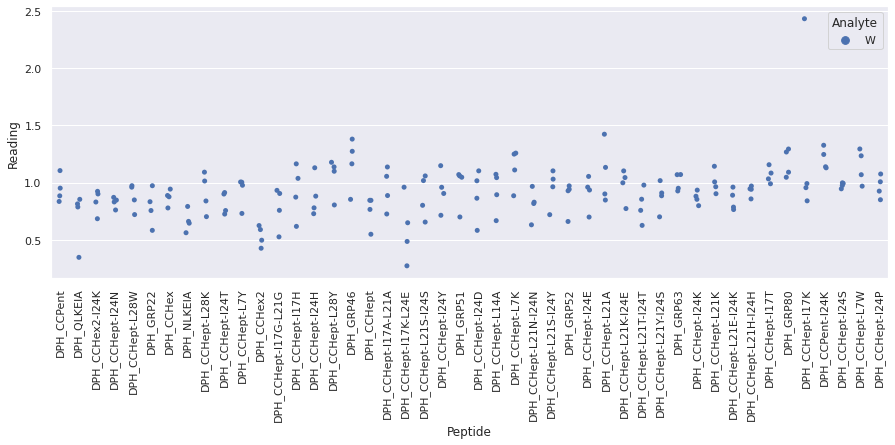

Drawing scatter plot of data spread for E_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

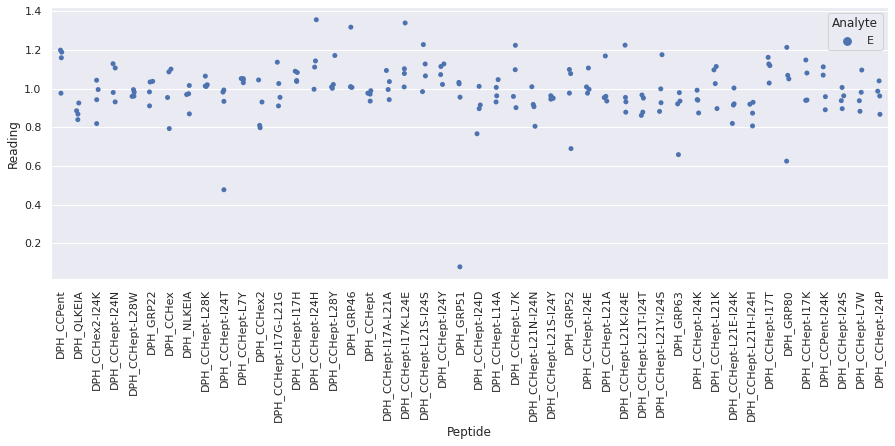

Drawing scatter plot of data spread for R_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

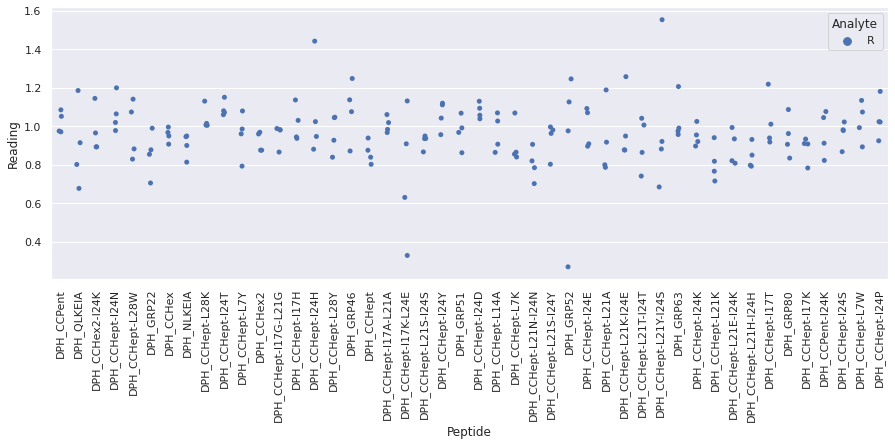

Drawing scatter plot of data spread for S_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

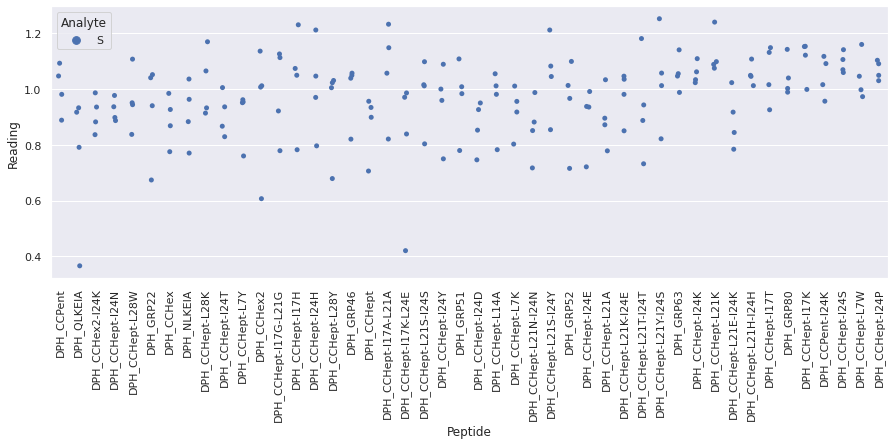

Drawing scatter plot of data spread for V_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

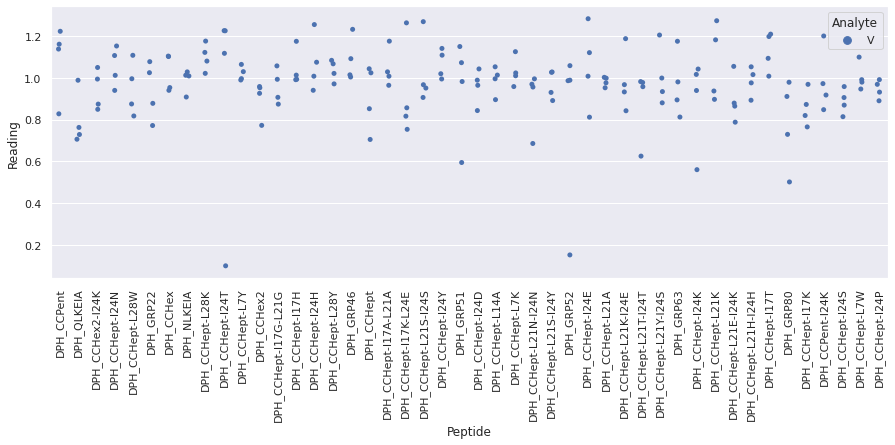

Drawing scatter plot of data spread for W_repeat_2 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

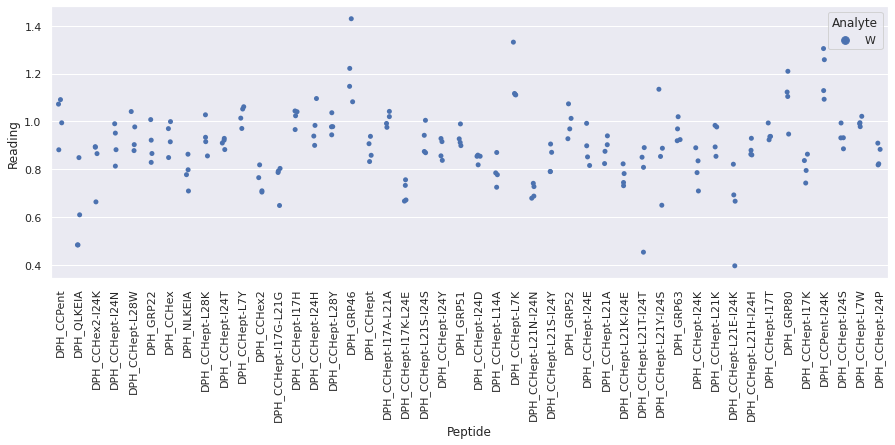

Drawing scatter plot of data spread for E_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

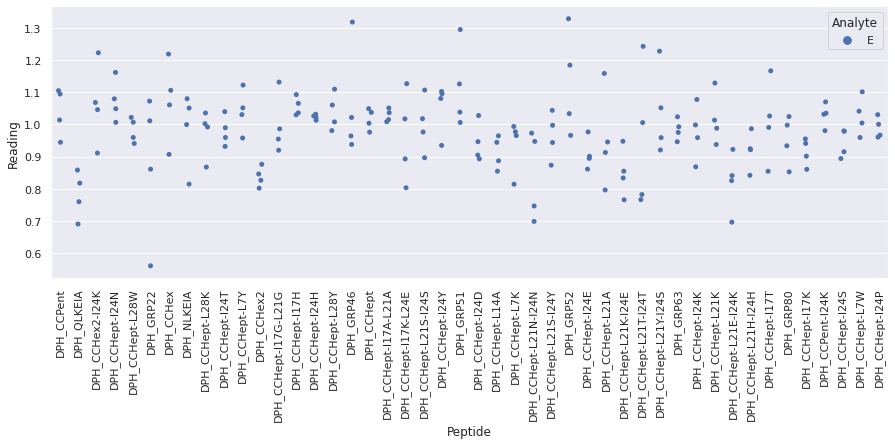

Drawing scatter plot of data spread for R_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

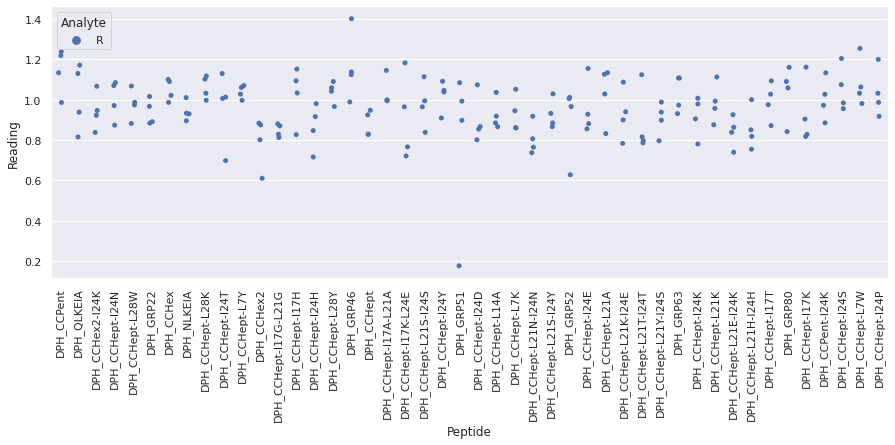

Drawing scatter plot of data spread for S_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

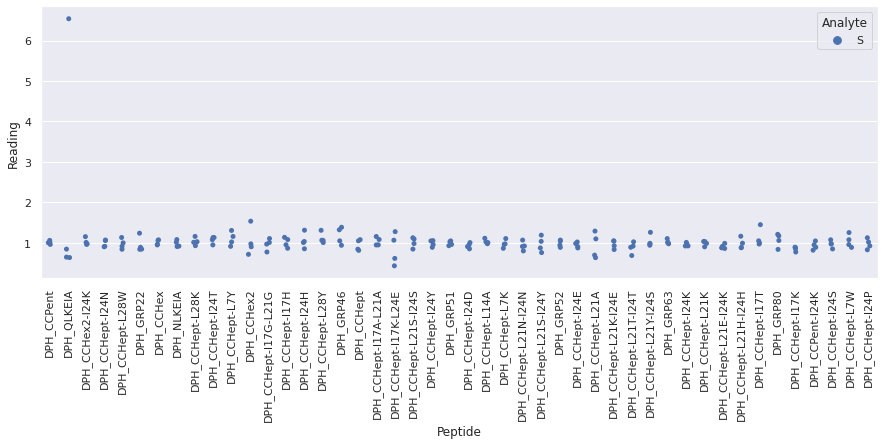

Drawing scatter plot of data spread for V_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

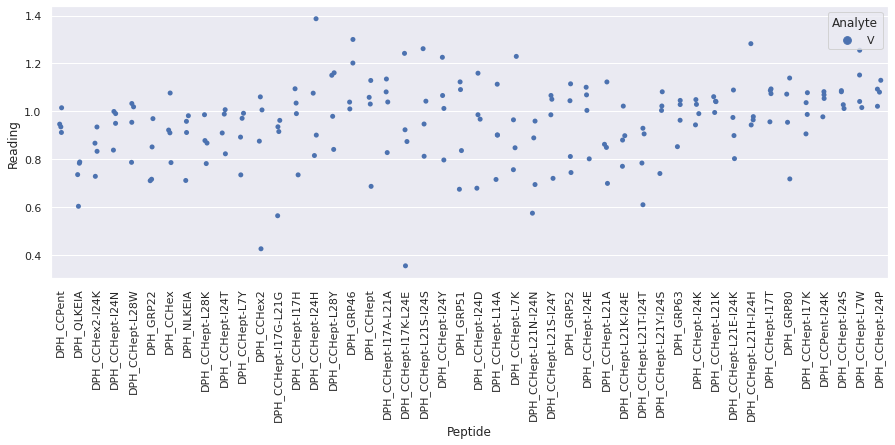

Drawing scatter plot of data spread for W_repeat_3 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

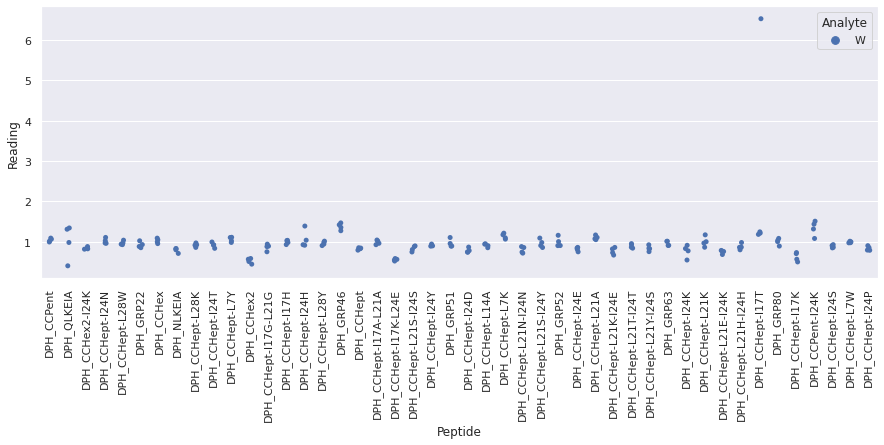

Drawing scatter plot of data spread for E_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

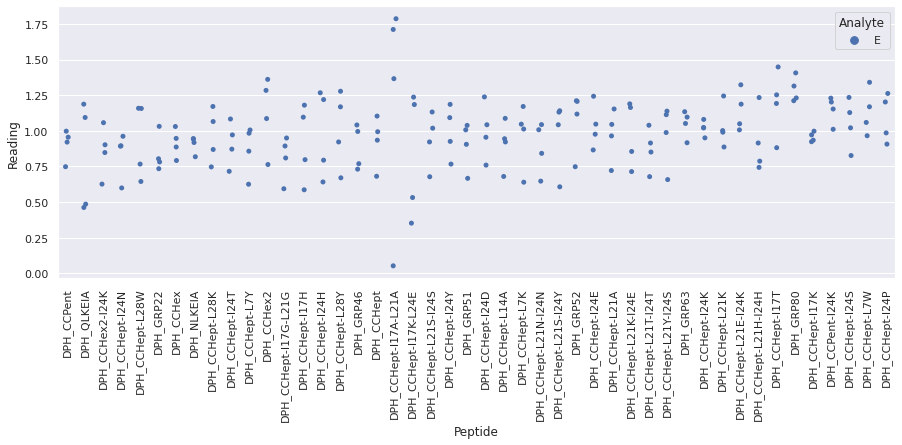

Drawing scatter plot of data spread for R_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

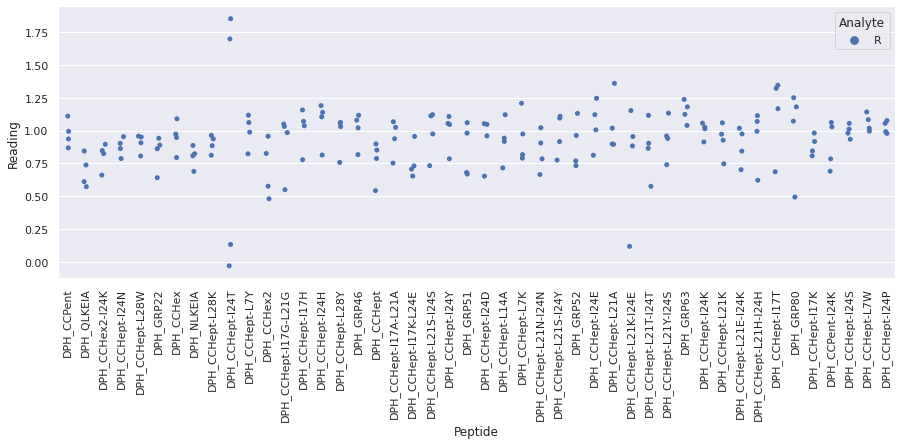

Drawing scatter plot of data spread for S_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

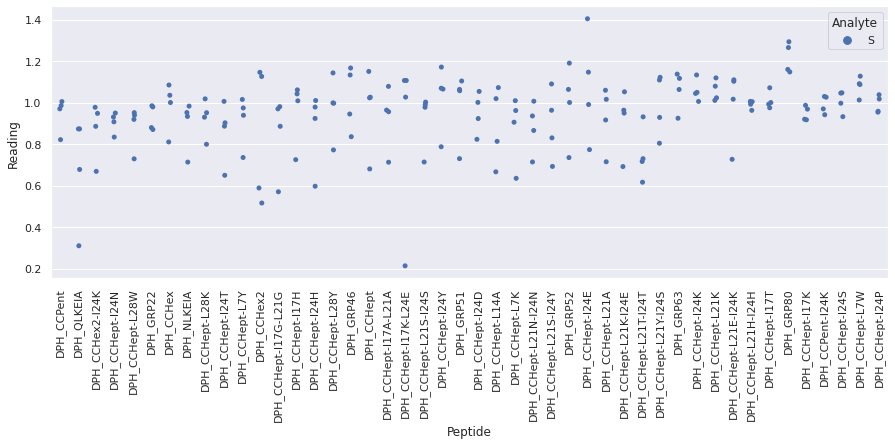

Drawing scatter plot of data spread for V_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

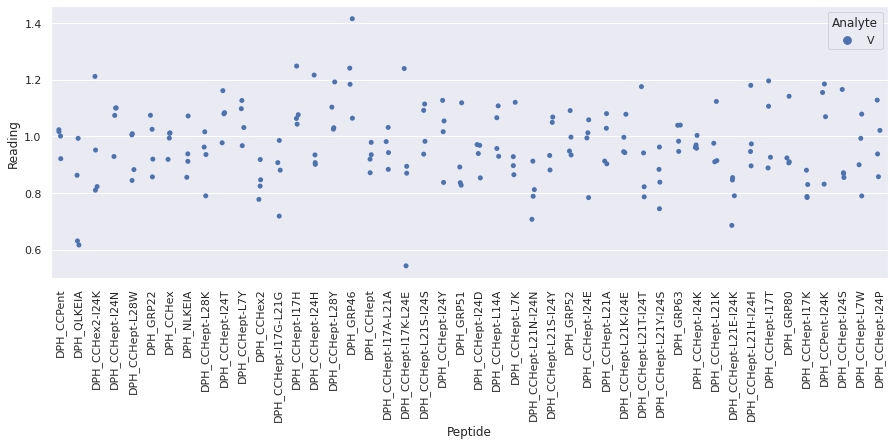

Drawing scatter plot of data spread for W_repeat_4 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

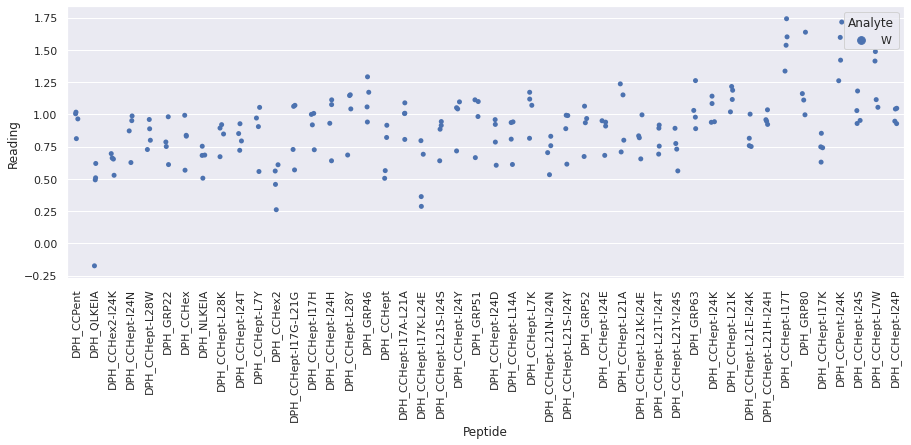

Drawing scatter plot of data spread for E_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

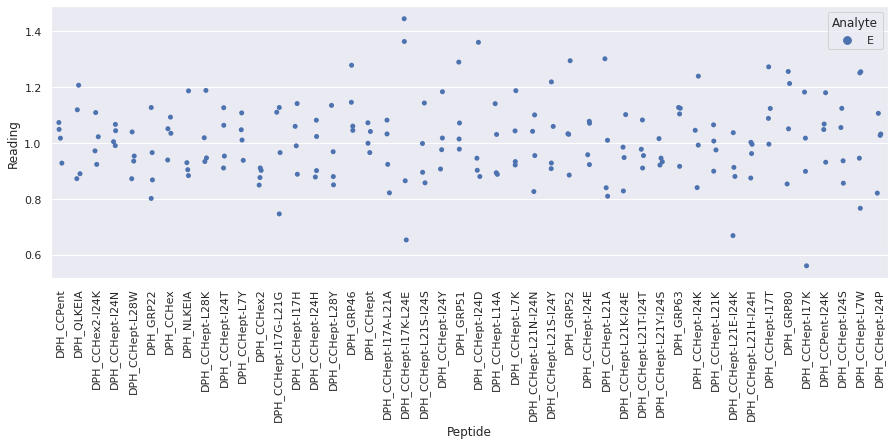

Drawing scatter plot of data spread for R_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

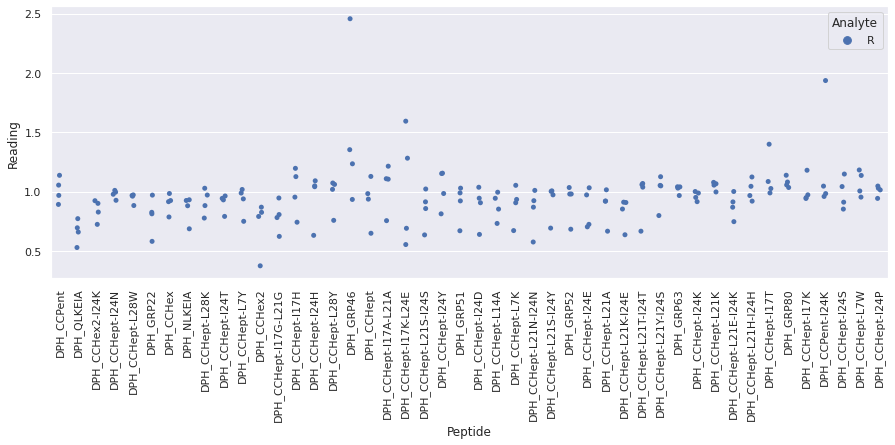

Drawing scatter plot of data spread for S_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

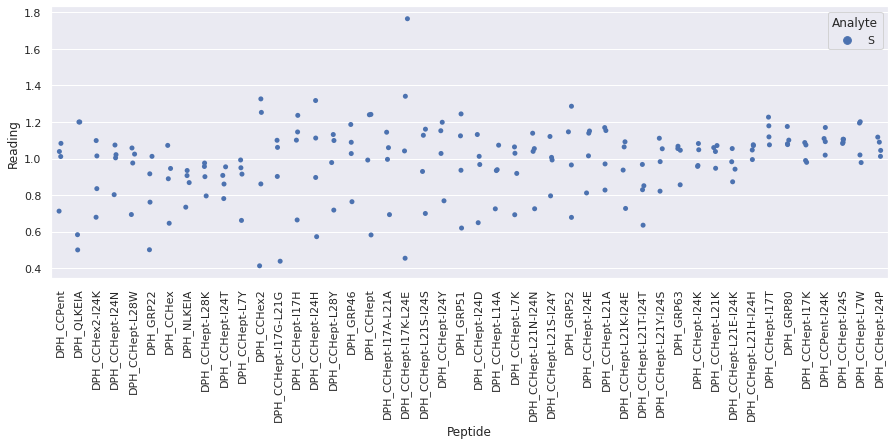

Drawing scatter plot of data spread for V_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

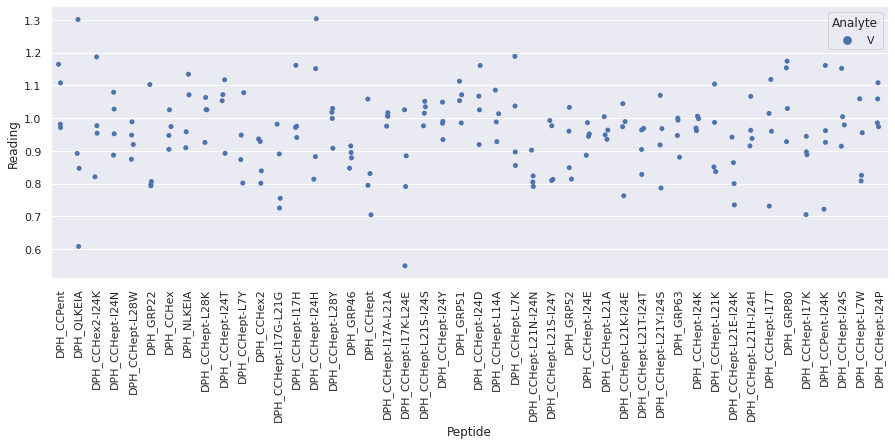

Drawing scatter plot of data spread for W_repeat_5 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

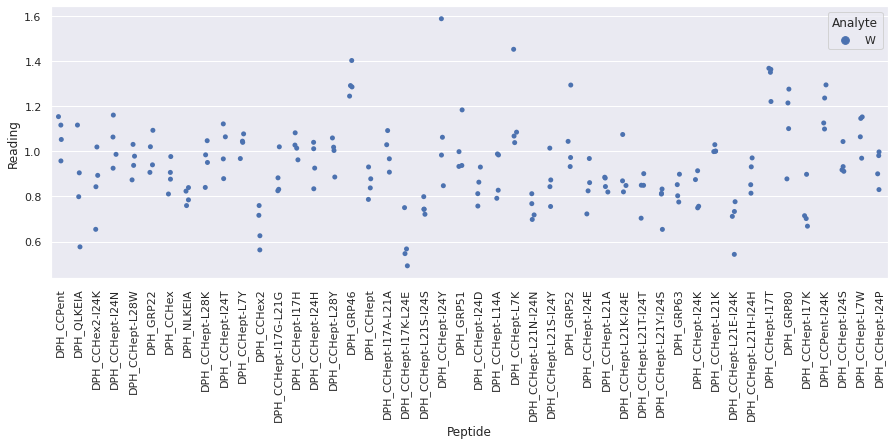

Drawing scatter plot of data spread for E_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

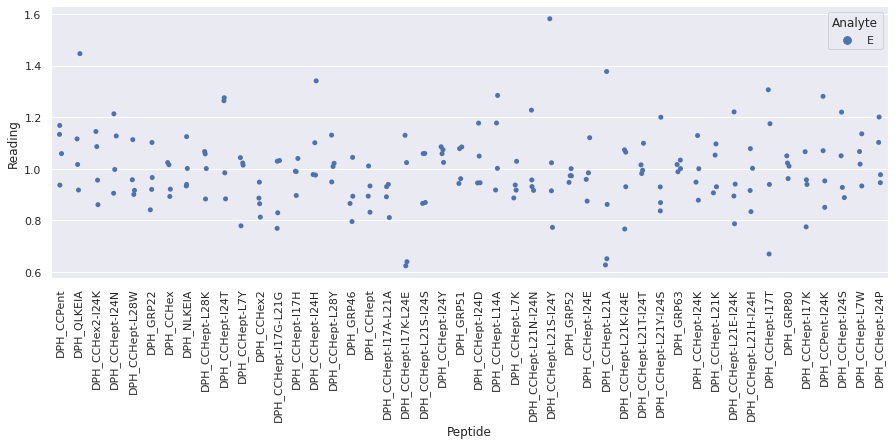

Drawing scatter plot of data spread for R_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

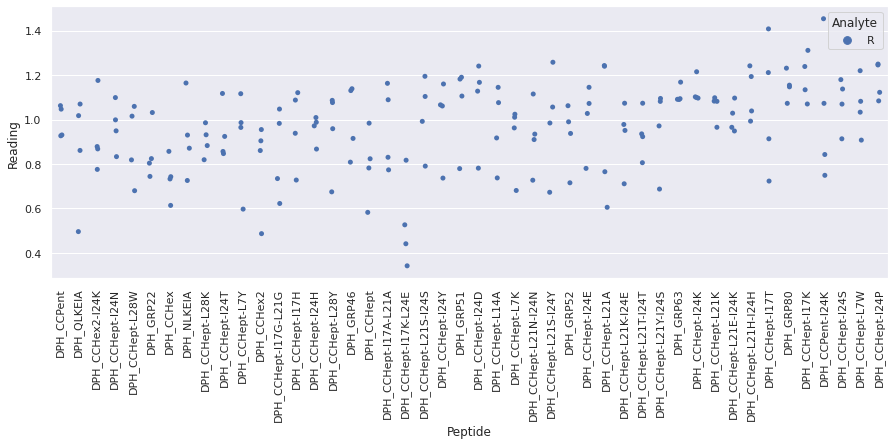

Drawing scatter plot of data spread for S_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

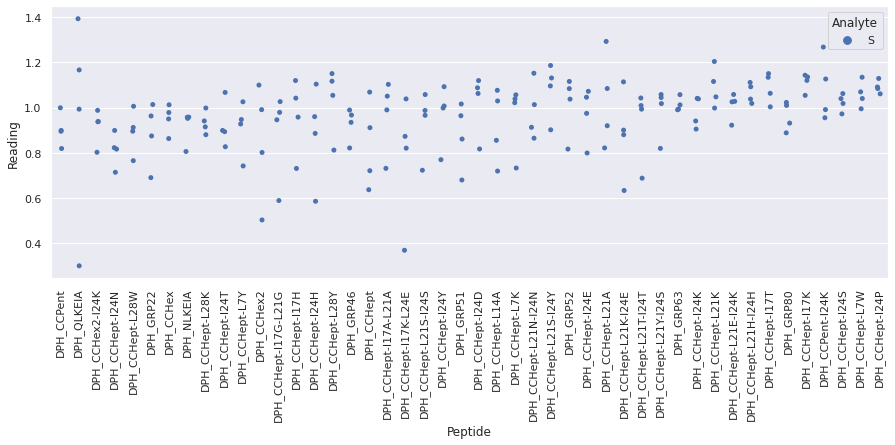

Drawing scatter plot of data spread for V_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

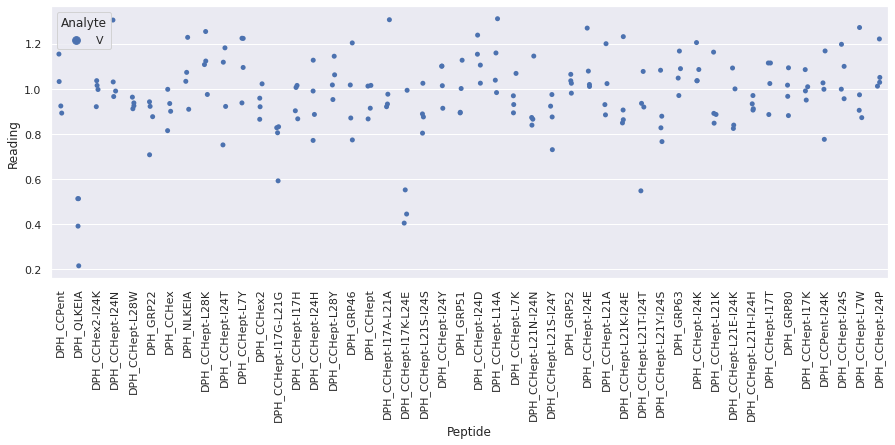

Drawing scatter plot of data spread for W_repeat_6 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

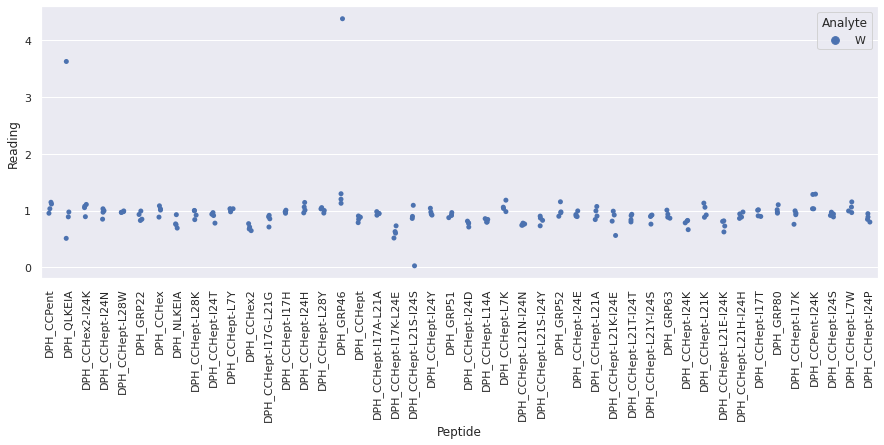

Drawing scatter plot of data spread for E_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

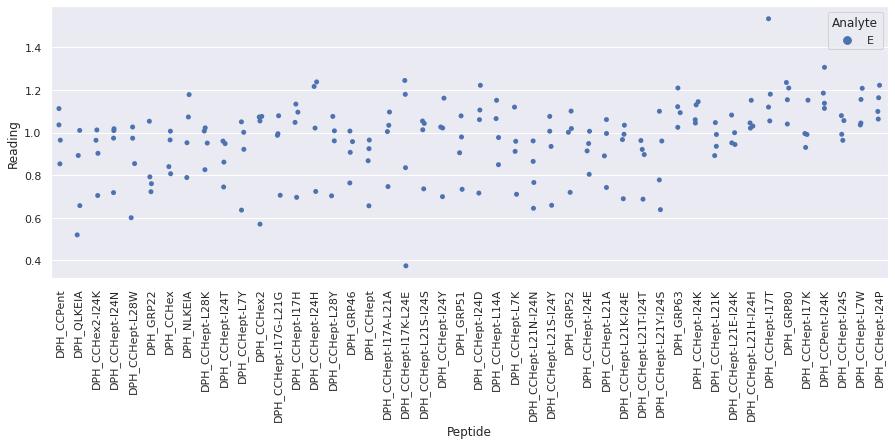

Drawing scatter plot of data spread for R_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

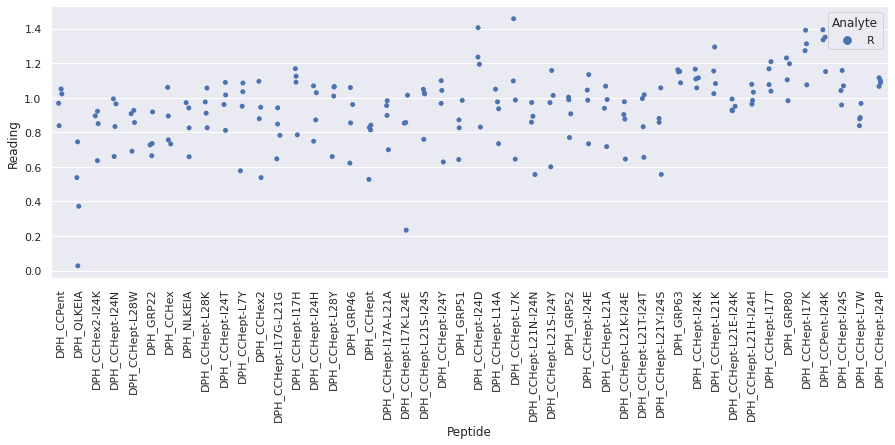

Drawing scatter plot of data spread for S_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

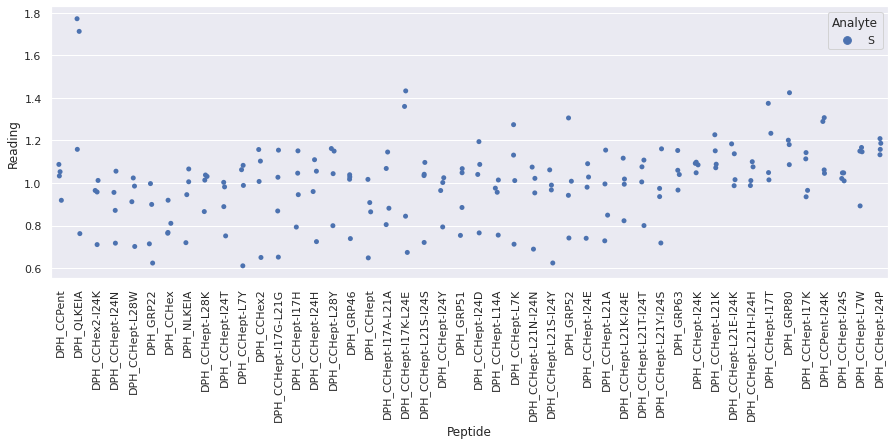

Drawing scatter plot of data spread for V_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

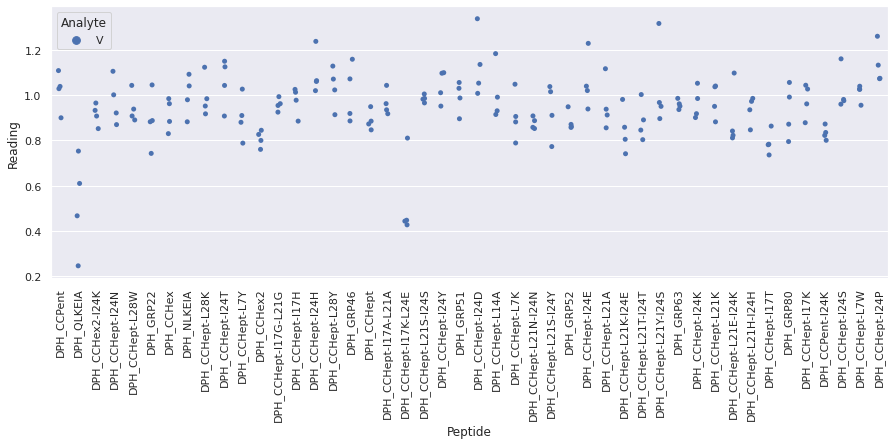

Drawing scatter plot of data spread for W_repeat_7 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

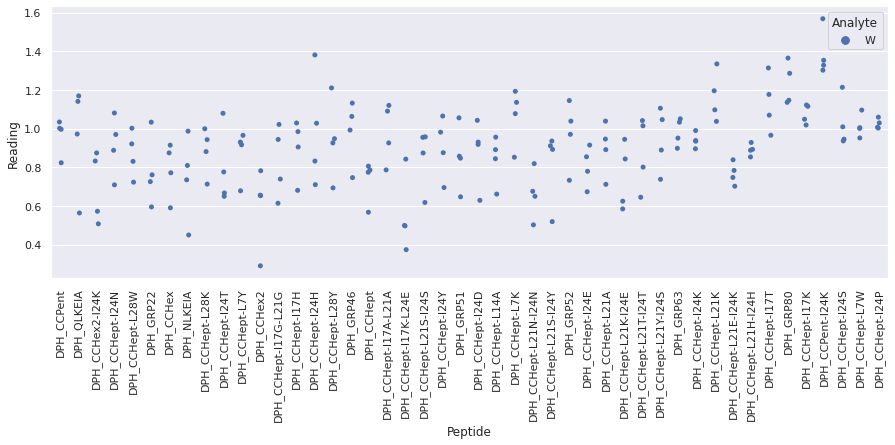

Drawing scatter plot of data spread for E_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

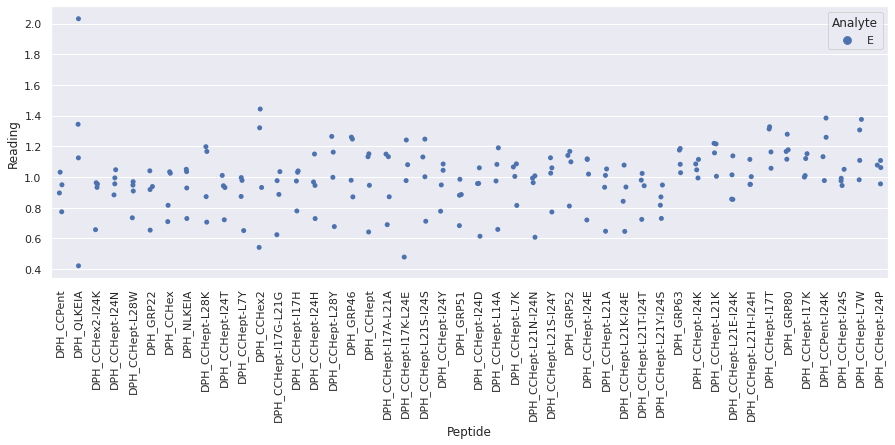

Drawing scatter plot of data spread for R_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

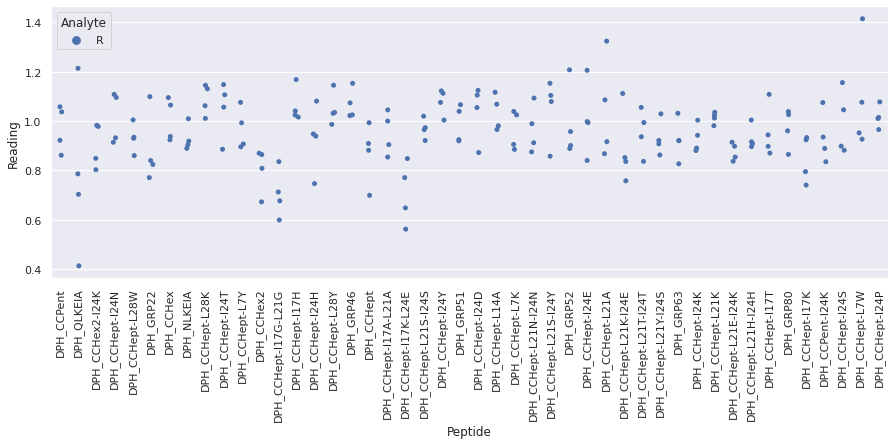

Drawing scatter plot of data spread for S_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

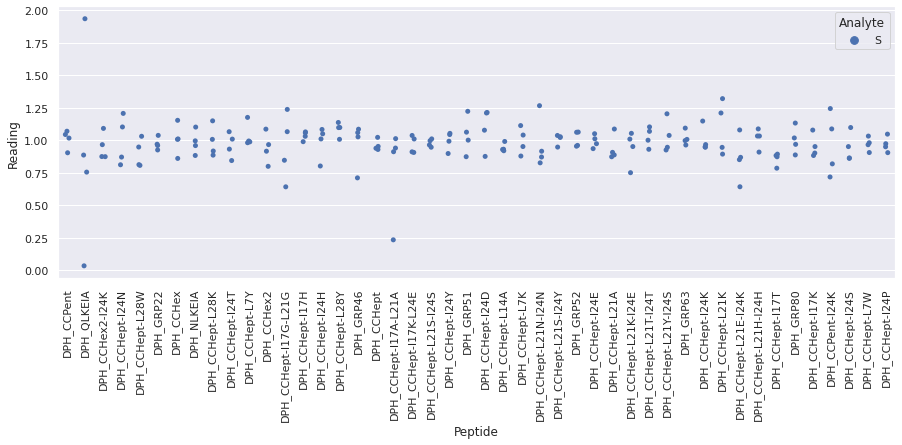

Drawing scatter plot of data spread for V_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

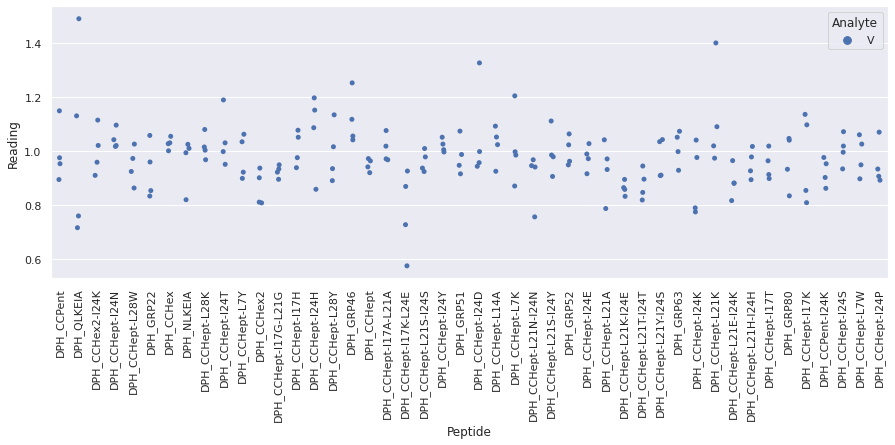

Drawing scatter plot of data spread for W_repeat_8 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

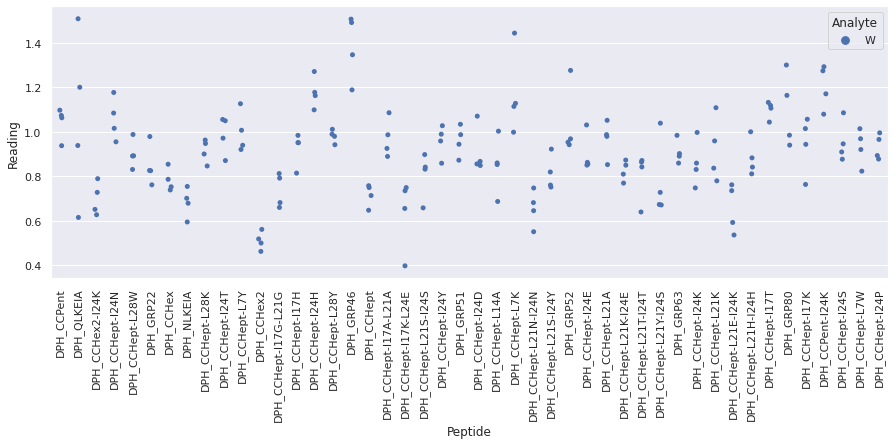

Drawing scatter plot of data spread for E_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

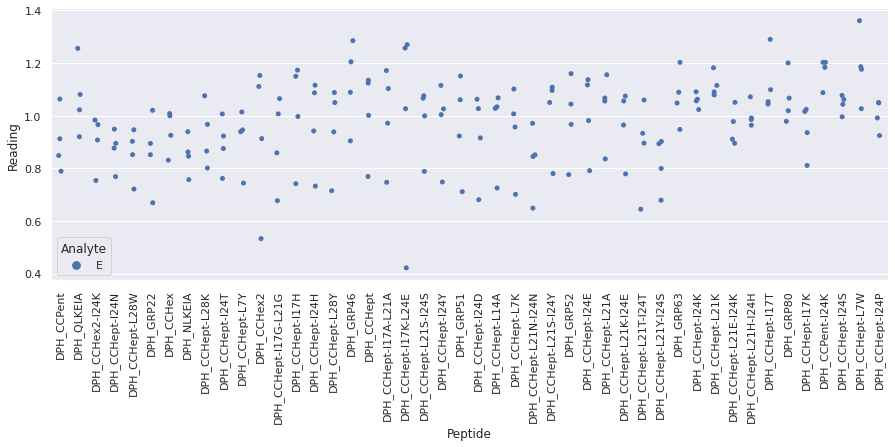

 WARNING - median fluorescence of (R + DPH_QLKEIA + fluorophore) is less than fluorescence of (R + fluorophore) alone on plate /home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_9.xlsx. Analysis will continue but please CHECK YOUR DATA. 
Drawing scatter plot of data spread for R_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

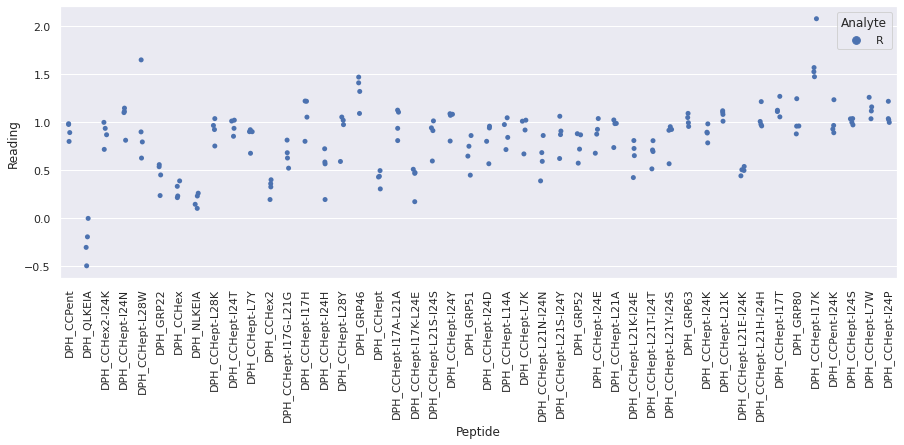

Drawing scatter plot of data spread for S_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

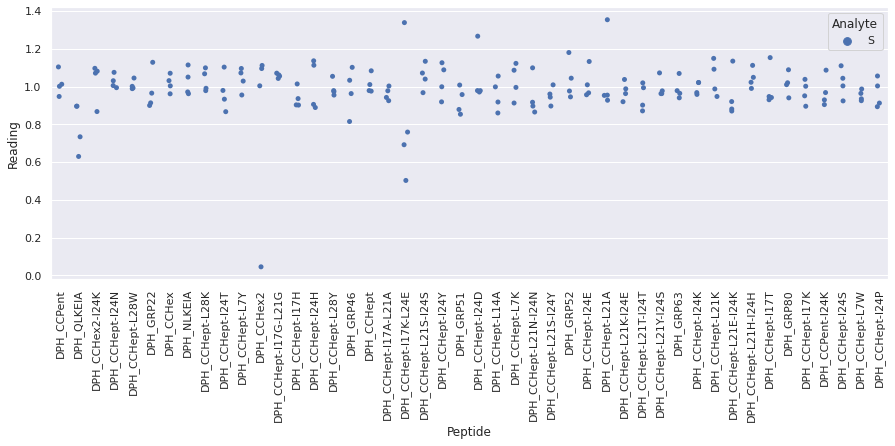

Drawing scatter plot of data spread for V_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

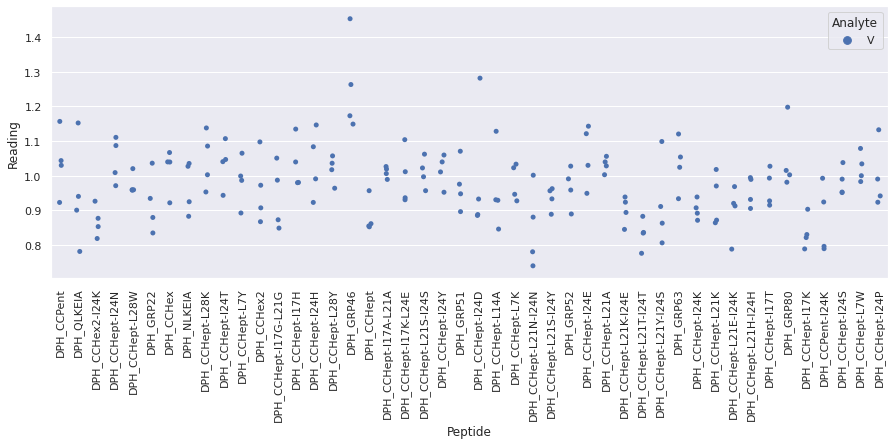

Drawing scatter plot of data spread for W_repeat_9 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

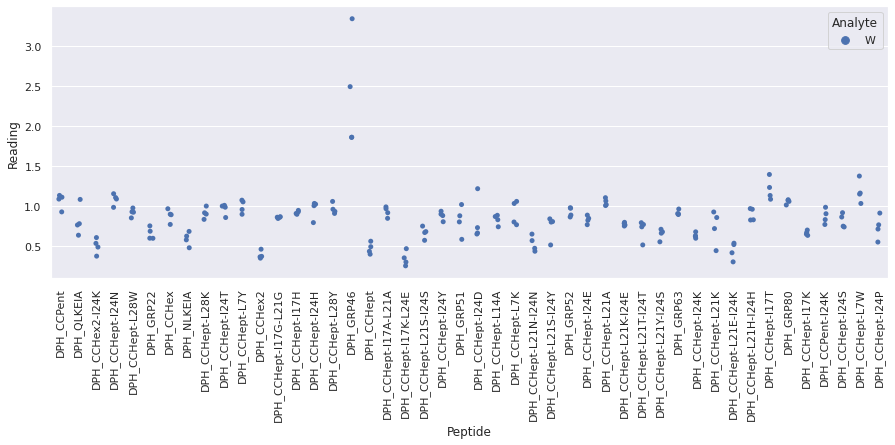

Drawing scatter plot of data spread for E_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

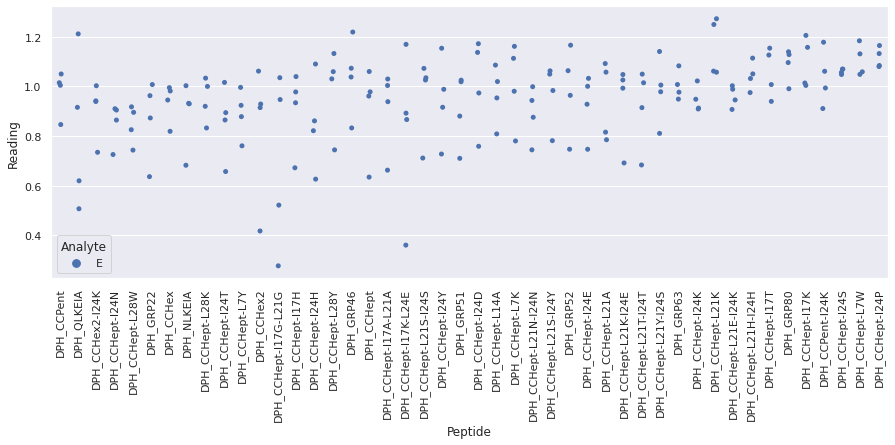

Drawing scatter plot of data spread for R_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

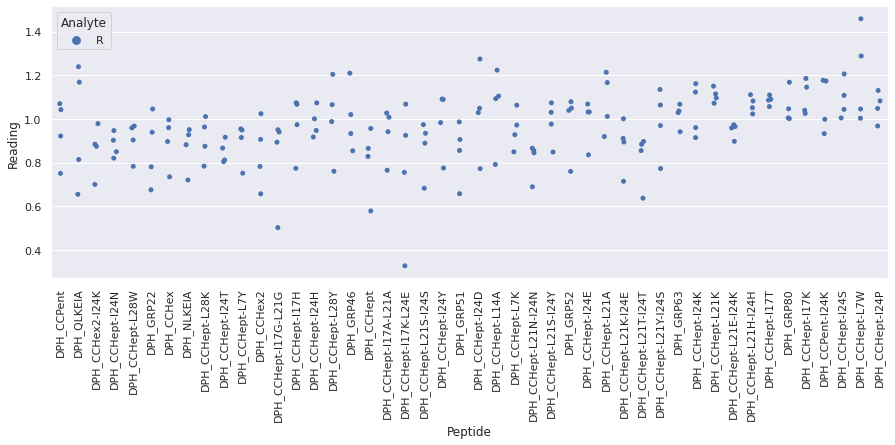

Drawing scatter plot of data spread for S_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

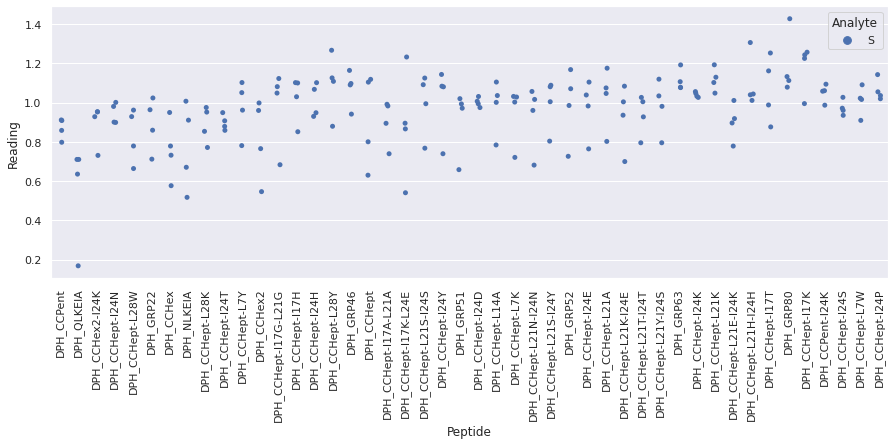

Drawing scatter plot of data spread for V_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

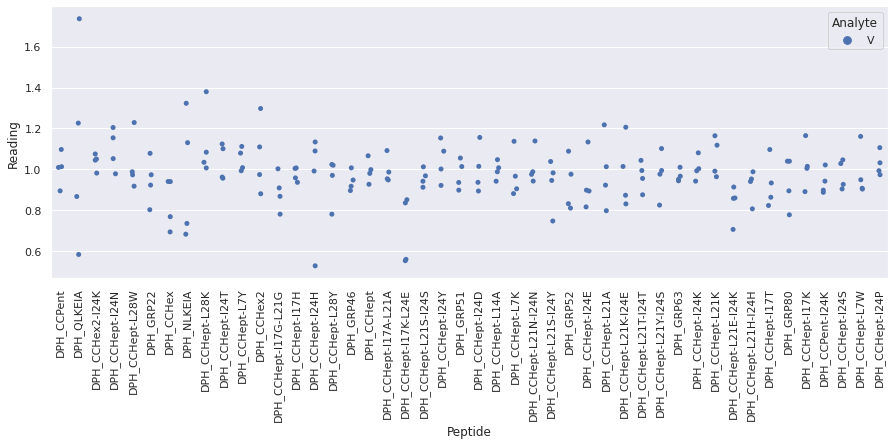

Drawing scatter plot of data spread for W_repeat_10 in AA_scaled_data


<Figure size 720x720 with 0 Axes>

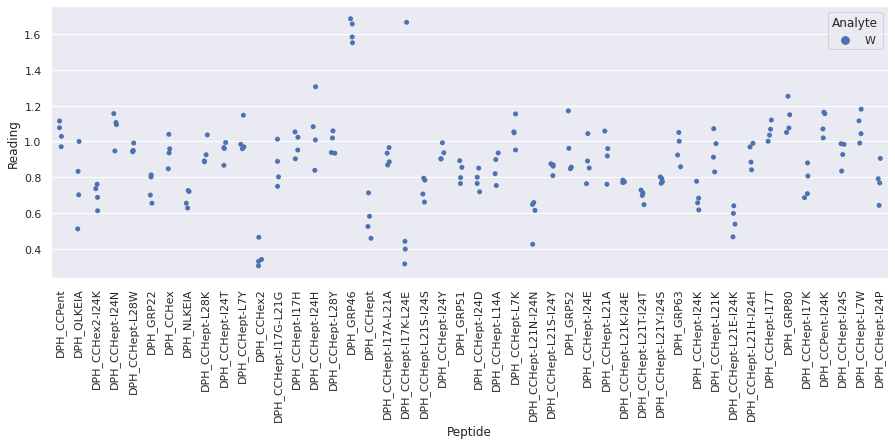



Outliers on the same plate:

/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_No Pep, 284.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24N, 6263.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I24T, 5537.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept, 7562.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-I17T, 1685.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: blank, DPH_CCHept-L7W, 11393.0
/home/ks17361/ML_environment/BADASS/Small_molecule_data_large_array/AAs/Reformatted_AA_csvs/R_repeat_1.xlsx: R, DPH_QLKEIA, 494.0
/home/ks17

In [6]:
aa_fluor_data.xlsx_to_scaled_df(
    no_pep={'DPH': 'No Pep'}, scale_method='analyte_fluorophore', draw_plot=True, plot_dir_name='AA'
)

At a glance:
- There are no plates in the dataset that by eye are obviously anomalous
- The fluorescence of peptides GRP35, QLKEIA and CCHept-I17K-L24E in the presence of DPH is very similar to that of DPH on its own. Consequently, the min-max scaled readings of these peptides are likely to contain large amounts of noise => may need to discard these peptides from the analysis if the variation in readings obtained for the same analyte with these peptides is high.
- There is not much difference in the fluorescence signal in the presence and absence of analyte => the analytes are not causing much displacement/change of interaction of DPH with the peptide. Tryptophan has a greater effect than the other analytes.

Combines readings of the same analyte solution across different plates, then calculates the median reading of non-independent repeats of the same analyte. Runs generalised ESD test, discards samples with more than two outlier readings (p=0.05 threshold).

In [7]:
aa_fluor_data.combine_plate_readings(outlier_excl_thresh=0.05, drop_thresh=2)



Outliers across plates:

repeat_1_R: R, DPH_QLKEIA, 1.3071428571428572
repeat_1_S: S, DPH_QLKEIA, 1.7027027027027026
repeat_1_S: S, DPH_CCHex2, 0.6022068965517241
repeat_1_S: S, DPH_CCHept-I24Y, 1.1675653499003633
repeat_1_S: S, DPH_CCHept-I24D, 0.3405367049412979
repeat_1_S: S, DPH_CCHept-L21S-I24Y, 1.0717790863668808
repeat_1_V: V, DPH_CCHept, 0.7914523851746763
repeat_1_W: W, DPH_QLKEIA, 0.3466666666666667
repeat_1_W: W, DPH_CCHept-L7Y, 0.7301670602641477
repeat_1_W: W, DPH_GRP51, 0.6993677535193781
repeat_1_W: W, DPH_GRP52, 0.6598825944052933
repeat_1_W: W, DPH_CCHept-I17K, 2.4305694305694305
repeat_2_E: E, DPH_CCHept-L28K, 1.0639455782312925
repeat_2_E: E, DPH_CCHept-I24T, 0.47694547807798093
repeat_2_E: E, DPH_CCHept-L28Y, 1.1706338939197931
repeat_2_E: E, DPH_GRP46, 1.3170498084291187
repeat_2_E: E, DPH_GRP51, 0.07872613984769064
repeat_2_E: E, DPH_CCHept-L21A, 1.1681006668100666
repeat_2_R: R, DPH_CCHept-L28K, 1.131226831421006
repeat_2_R: R, DPH_CCHept-I17G-L21G, 0.866722630

 Outlier excluded from final output dataset: 8, W
DPH_CCPent                                  1.09599
DPH_QLKEIA                                    0.768
DPH_CCHex2-I24K                            0.506773
DPH_CCHept-I24N                             1.09389
DPH_CCHept-L28W                             0.92255
DPH_GRP22                                  0.638238
DPH_CCHex                                   0.89149
DPH_NLKEIA                                  0.59716
DPH_CCHept-L28K                            0.904324
DPH_CCHept-I24T                            0.989459
DPH_CCHept-L7Y                              1.00152
DPH_CCHex2                                  0.36393
DPH_CCHept-I17G-L21G                       0.856949
DPH_CCHept-I17H                            0.914785
DPH_CCHept-I24H                             1.01074
DPH_CCHept-L28Y                             0.94343
DPH_GRP46               Outlier: 2.1752797016515717
DPH_CCHept                                 0.458812
DPH_CCHept-I17

Display range of data points across repeats for the different analytes




Original_data:


E


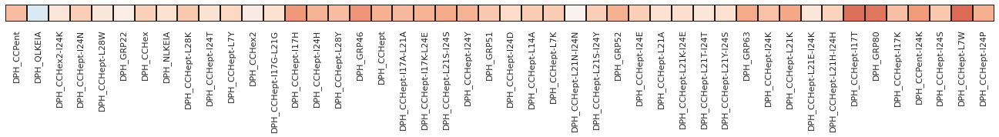


R


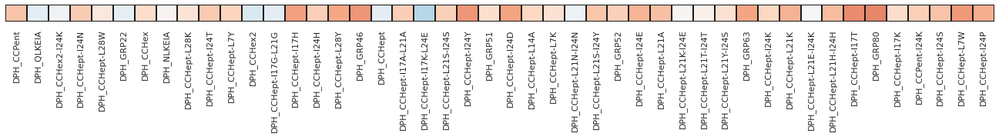


S


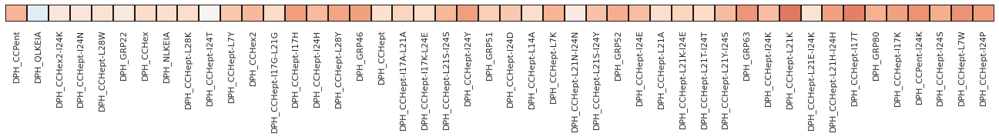


V


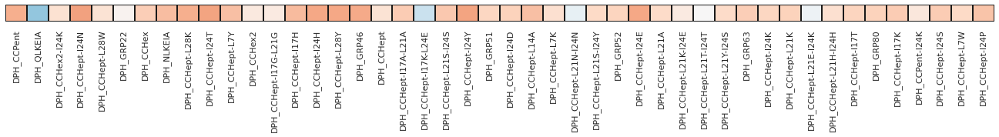


W


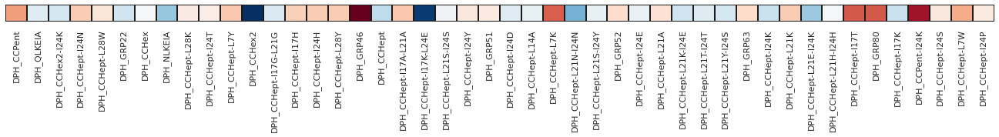




Scaled_data:


E


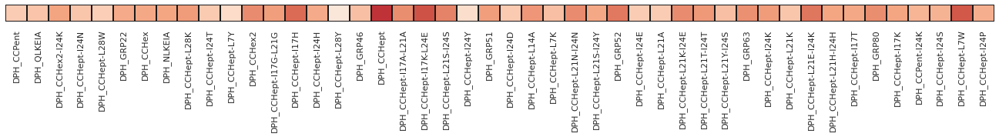


R


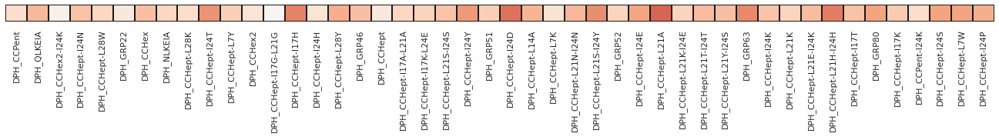


S


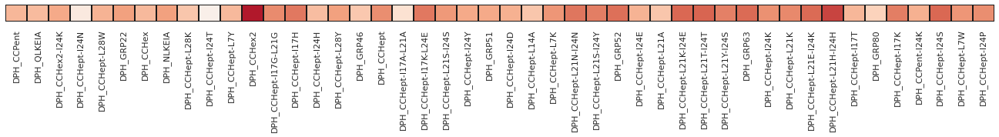


V


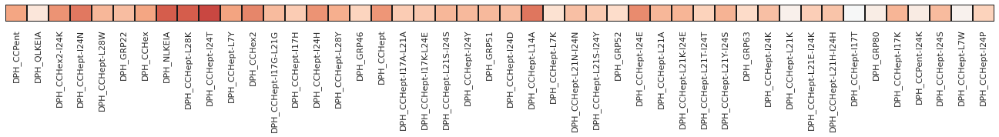


W


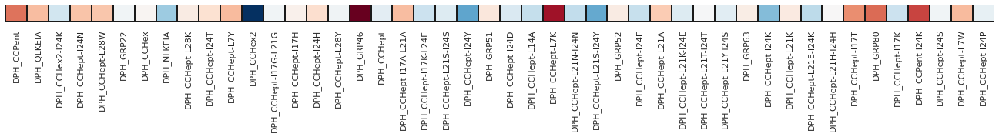




Original_data:



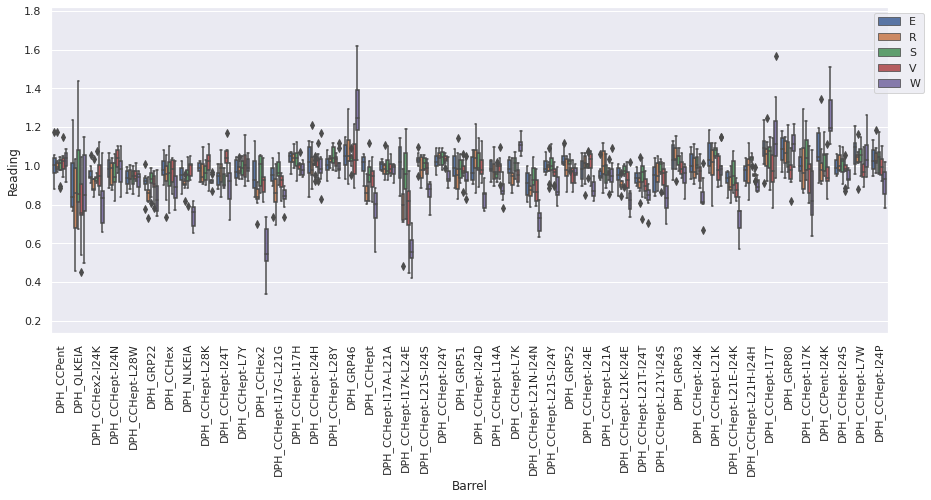

E


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


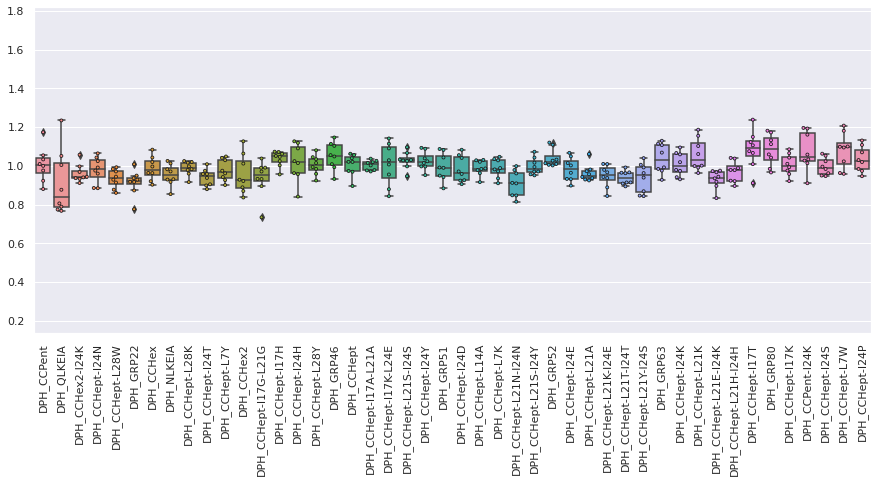

R


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


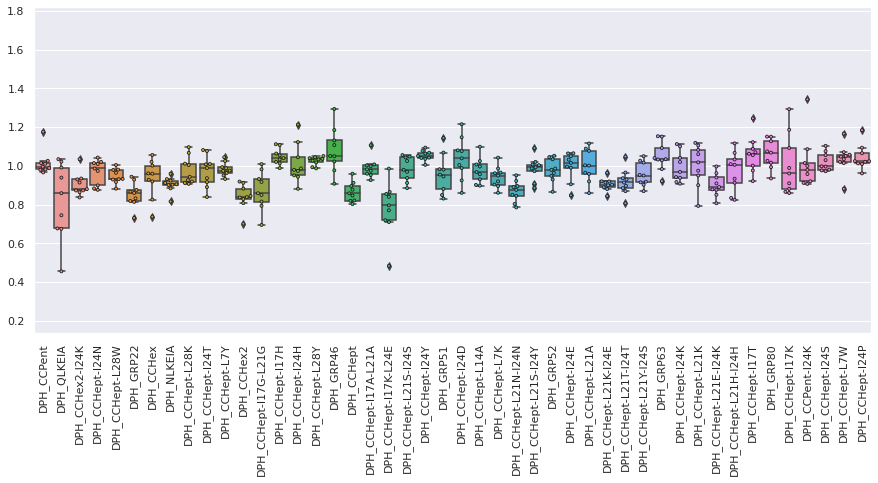

S


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


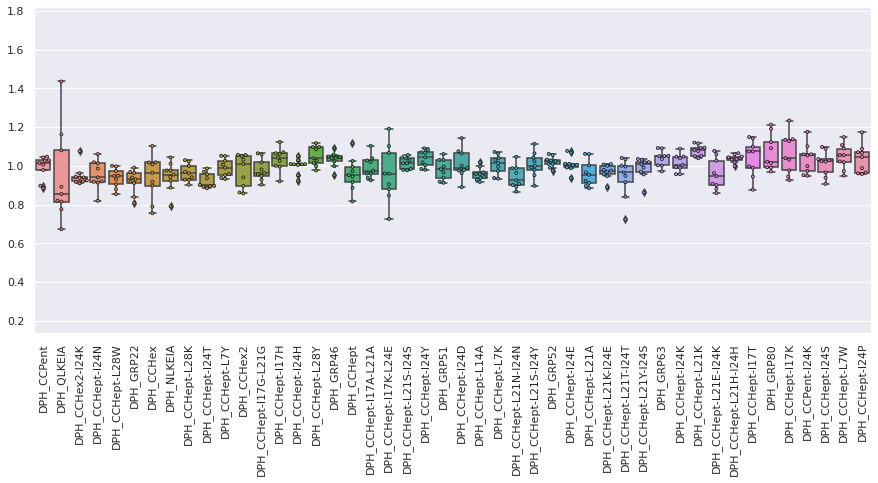

V


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


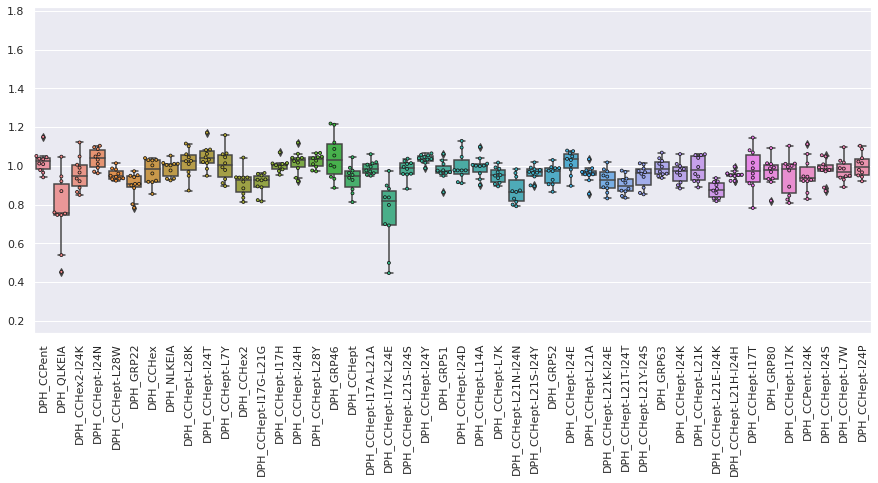

W


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


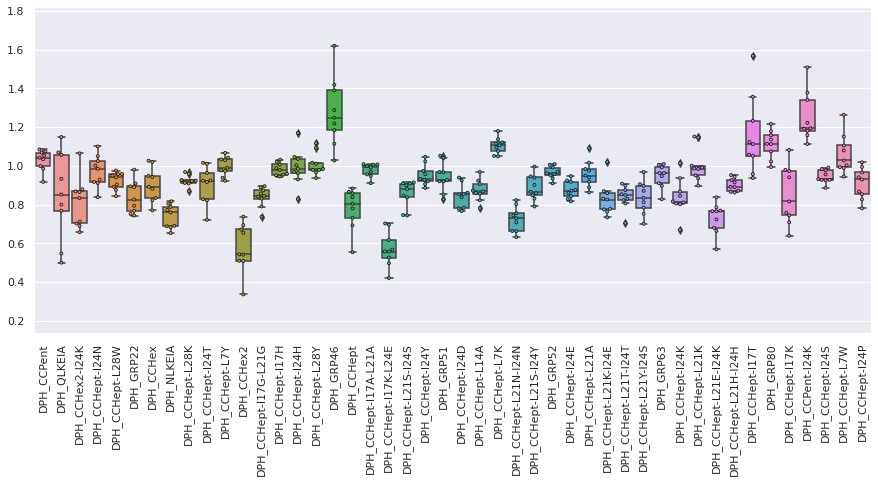




Scaled_data:



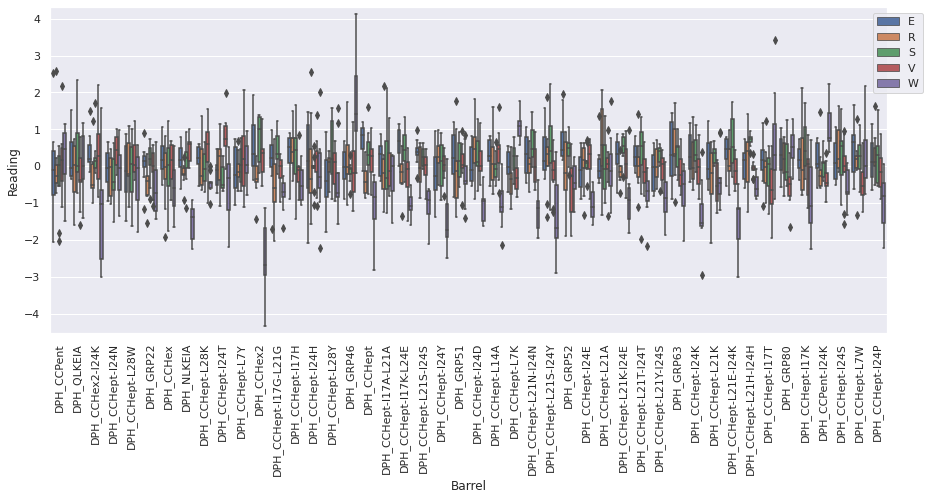

E


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


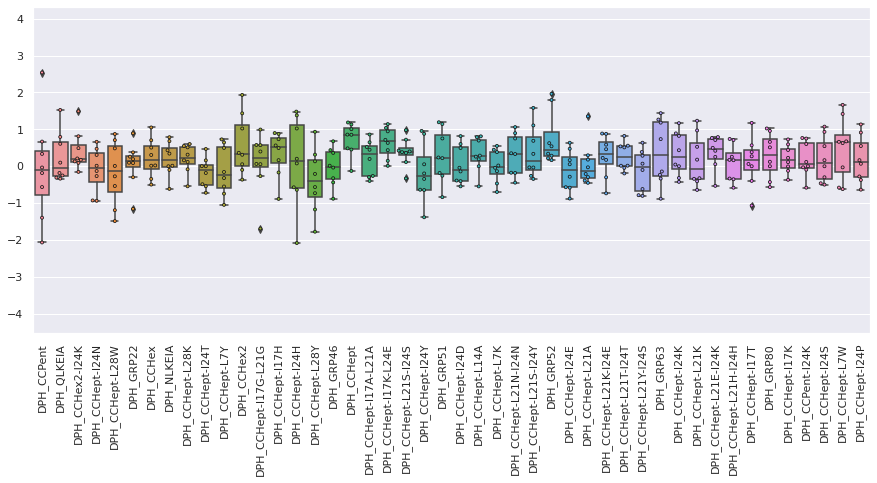

R


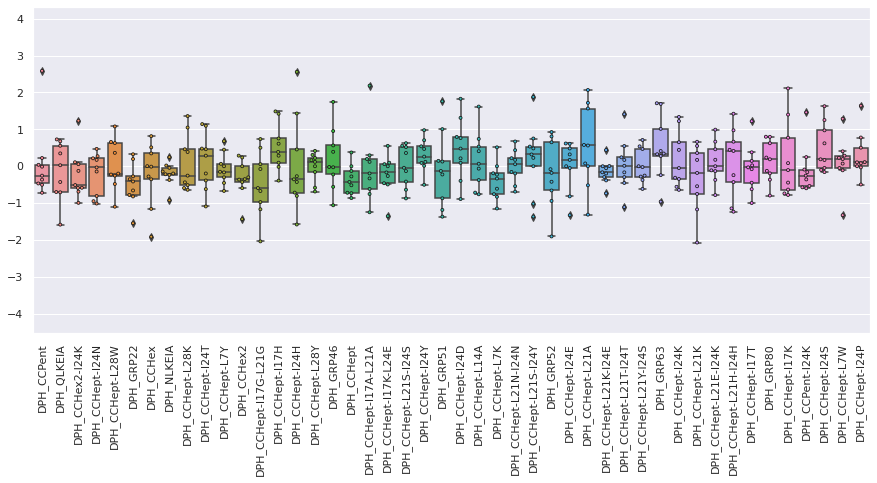

S


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 22.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


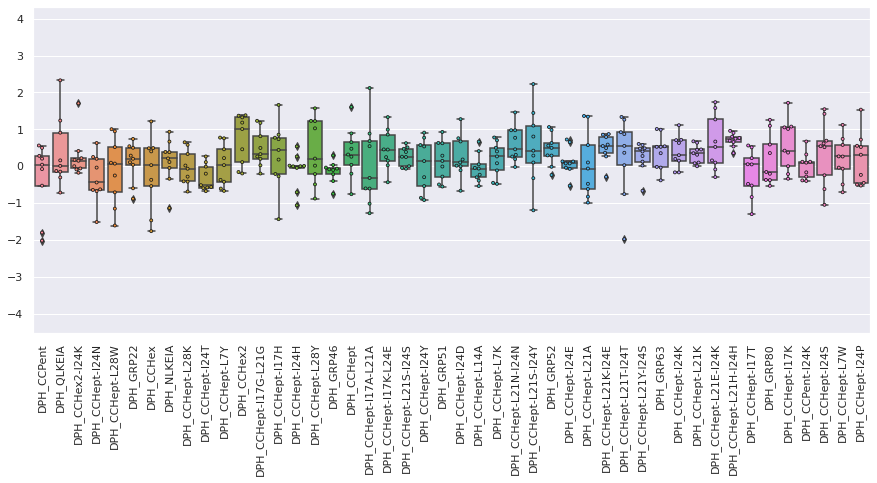

V


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


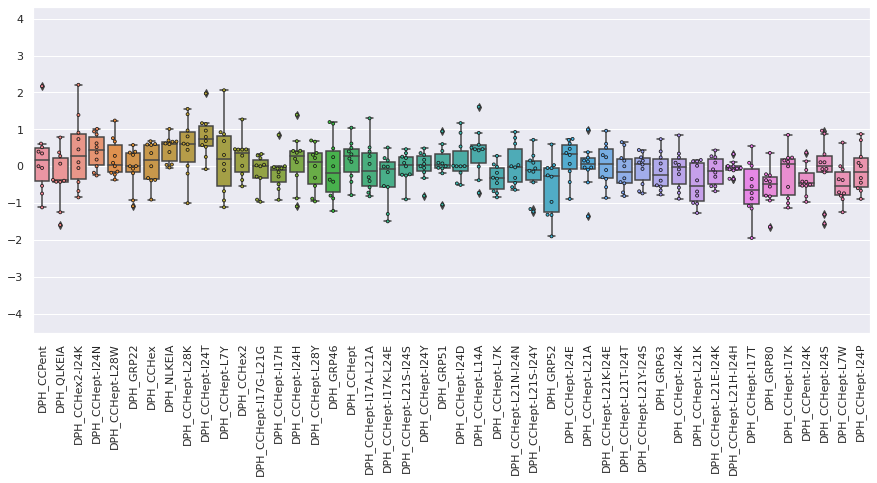

W


/home/ks17361/.local/share/virtualenvs/ML_environment-eYyPySDz/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


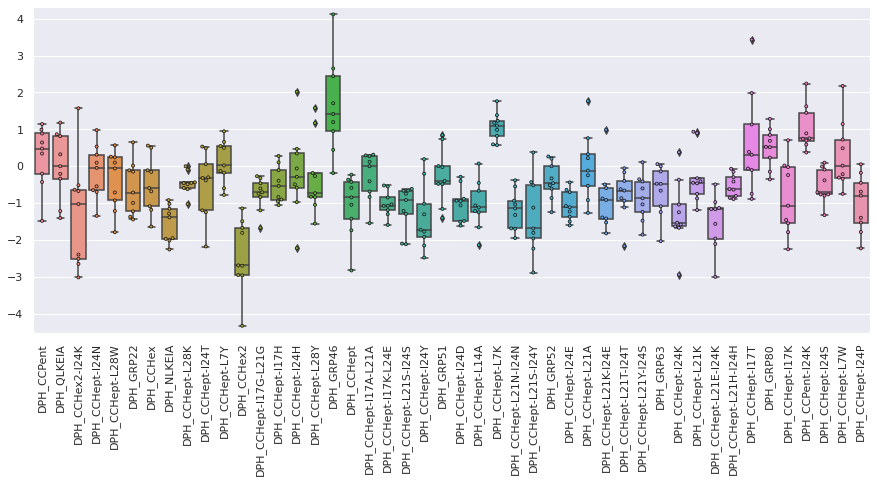

In [8]:
aa_fluor_data.display_data_distribution()

- As suggested by the scatter plots of the raw data above, the fingerprint of W is the most easily distinguishable, whereas the other four amino acids are similar to one another.
- When looking at the unscaled data, the ranges of readings obtained for QLKEIA (identified above as having a minimal effect upon the fluorescence of DPH) are large and show a high degree of overlap. However when looking at the scaled data, the overlap of different classes is not noticeably (by eye) poorer than many of the other peptides (e.g. compare to CCPent).

Consequently, I will not discard any of the peptides from the initial dataset used for ML training.

In [9]:
aa_fluor_data.ml_fluor_data

,DPH_CCPent,DPH_QLKEIA,DPH_CCHex2-I24K,DPH_CCHept-I24N,DPH_CCHept-L28W,DPH_GRP22,DPH_CCHex,DPH_NLKEIA,DPH_CCHept-L28K,DPH_CCHept-I24T,...,DPH_CCHept-L21E-I24K,DPH_CCHept-L21H-I24H,DPH_CCHept-I17T,DPH_GRP80,DPH_CCHept-I17K,DPH_CCPent-I24K,DPH_CCHept-I24S,DPH_CCHept-L7W,DPH_CCHept-I24P,Analyte
0,0.975754,0.805970,0.911260,0.959824,0.992671,0.949460,0.996339,0.929025,1.024605,0.957439,...,0.972638,0.921093,0.910909,0.984478,1.042352,0.910192,0.961709,0.963116,0.946389,E
1,1.173333,0.876437,0.968451,1.042891,0.970839,1.008017,1.019729,0.970988,1.016143,0.957612,...,0.917594,0.895863,1.122525,1.058936,1.010333,1.013535,0.949764,0.958733,0.973714,E
2,1.054200,0.789017,1.057116,1.064320,0.983391,0.936198,1.083456,1.025333,0.997308,0.974687,...,0.833333,0.923131,1.008582,0.965823,0.921273,1.033352,0.947079,1.022945,0.983653,E
3,1.032963,1.004405,0.997020,1.024302,0.944165,0.916627,1.042882,0.916823,0.982637,1.008268,...,0.896363,0.978689,1.105980,1.131978,0.957890,1.058071,0.995787,1.098436,1.029730,E
4,0.999950,0.774510,0.932947,0.991259,0.913675,0.775800,0.902547,1.012388,0.978639,0.904505,...,0.975191,1.037625,1.149506,1.181197,0.992958,1.160988,1.023756,1.099746,1.130901,E
5,0.922894,1.234375,0.943548,0.975264,0.928380,0.928596,0.920456,0.982110,1.019693,0.937569,...,0.935408,0.977644,1.238383,1.172258,1.065114,1.195792,0.983709,1.207681,1.069779,E
6,0.880173,1.051095,0.936436,0.885496,0.876904,0.872823,0.962317,0.853927,0.916010,0.898641,...,0.943916,0.987938,1.075606,1.042473,0.975499,1.192737,1.052147,1.180891,1.019655,E
7,1.009470,0.767606,0.940277,0.884394,0.860375,0.917590,0.963124,0.930681,0.959728,0.879332,...,0.966801,1.040873,1.066630,1.111805,1.085274,1.027042,1.062601,1.094662,1.107924,E
8,1.025855,1.021429,1.034466,1.009236,1.004214,0.943589,1.020425,0.959219,1.004224,1.007548,...,0.806447,0.933195,1.070046,1.016349,0.988957,0.920160,0.997541,1.020918,0.960921,R
9,1.014104,0.858757,0.929889,1.042682,0.978965,0.866702,0.959320,0.923752,1.011156,1.076569,...,0.878458,0.824546,0.975738,0.934832,0.909808,0.979306,0.980335,1.034094,1.023615,R


#### ML analysis

In [10]:
plt.rcParams['figure.figsize'] = (10, 10)  # Sets default figure size
ml = RunML(
    results_dir='/home/ks17361/ML_environment/BADASS/Small_molecule_analysis_large_array/'
                'AAs/AA_ML_plots',
    fluor_data=aa_fluor_data.ml_fluor_data.drop(['Analyte'], axis=1),
    classes=aa_fluor_data.ml_fluor_data['Analyte'].tolist(),
    subclasses=None, shuffle=False
)

- Calculate feature correlations

In [11]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size

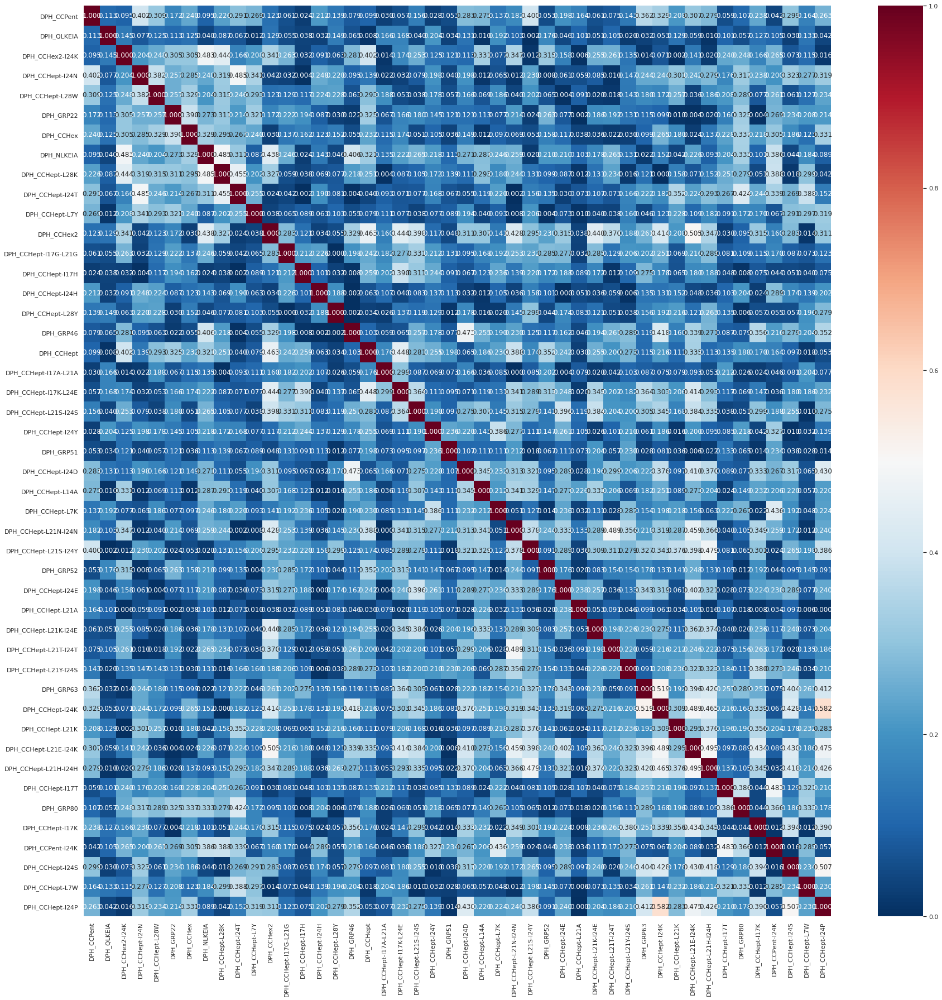

In [12]:
kendall_tau_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='kendall', plt_name='', abs_vals=True
)

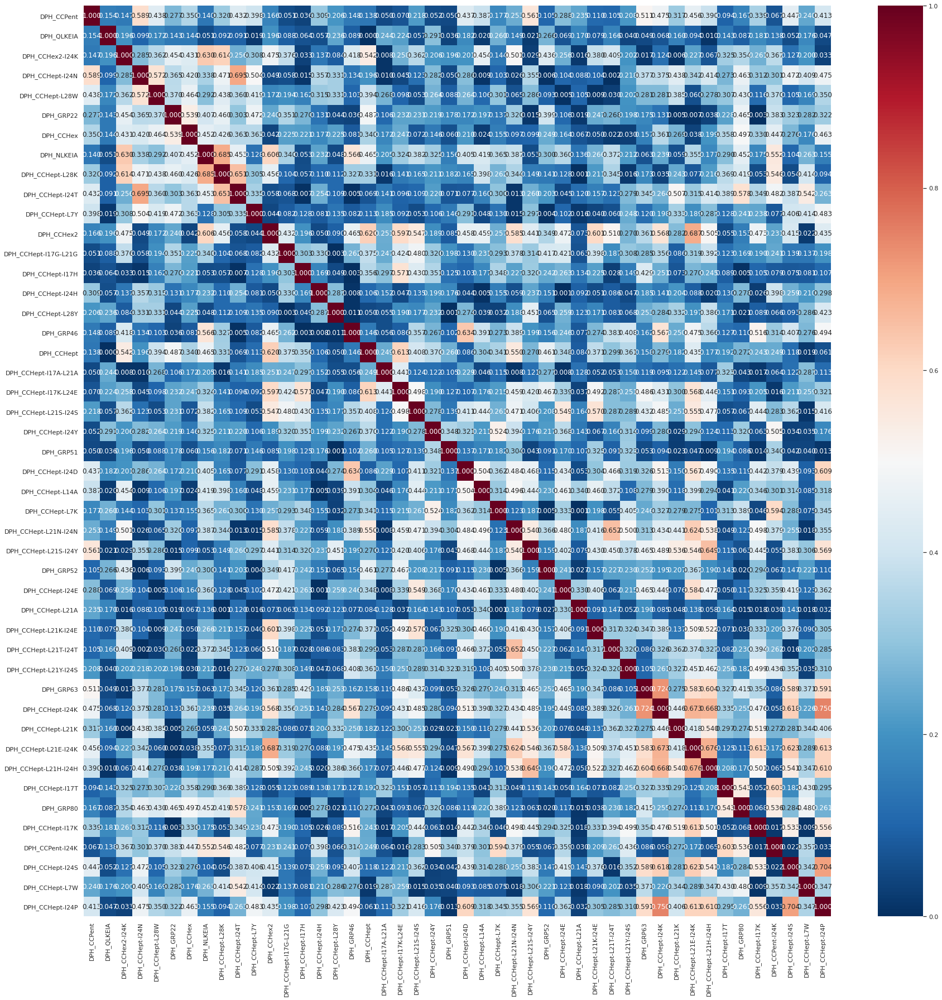

In [13]:
spearman_correlation_matrix = ml.calc_feature_correlations(
    fluor_data=ml.fluor_data, correlation_coeff='spearman', plt_name='', abs_vals=True
)

The correlation coefficients between the readings from most of the barrels are pretty low. Would expect that if the readings are providing useful information (i.e. not just noise) about amino acid class that a larger number would show higher correlation coefficients (as it is highly unlikely that all 46 peptides will provide unique, unrelated information about amino acid class). Consequently model training might be tricky, and feature reduction might lead to an improvement in performance - we will see whether this is the case in the following analysis!

In [14]:
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

- Measure the relative importances of the peptides with KBest using one-way ANOVA

<Figure size 720x720 with 0 Axes>

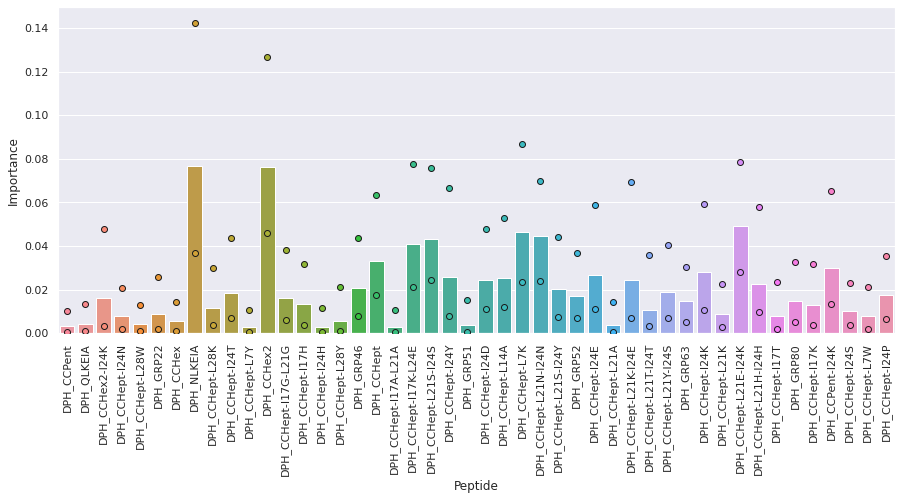

<Figure size 720x720 with 0 Axes>

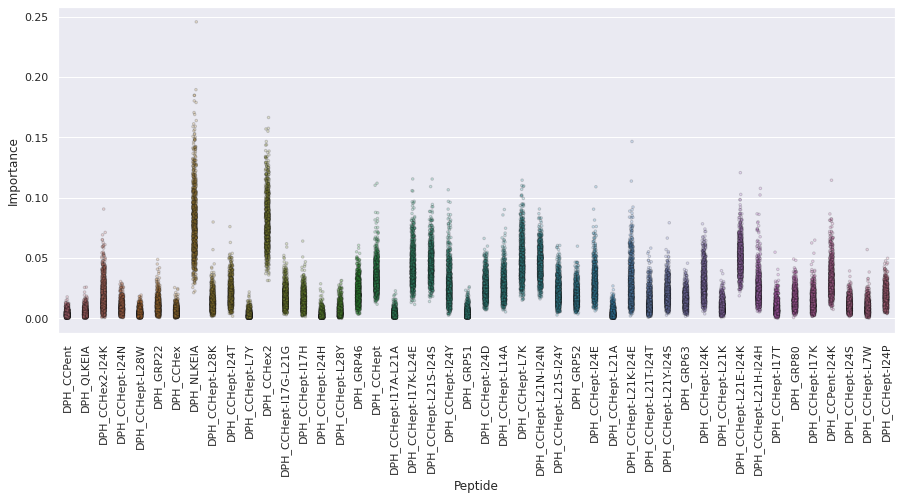

In [15]:
kbest_feat_importances_df, kbest_feat_importances_dict = ml.calc_feature_importances_kbest(
    x=ml.x, y=ml.y, features=None, method_classif='f_classif', num_repeats=1000, scale=True, plt_name=''
)

In [16]:
print('Peptides ordered by F-score:')
kbest_feat_importances_df

Peptides ordered by F-score:


,Feature,Score
0,DPH_NLKEIA,0.076708
1,DPH_CCHex2,0.076088
2,DPH_CCHept-L21E-I24K,0.049366
3,DPH_CCHept-L7K,0.046520
4,DPH_CCHept-L21N-I24N,0.044799
5,DPH_CCHept-L21S-I24S,0.043260
6,DPH_CCHept-I17K-L24E,0.041005
7,DPH_CCHept,0.033126
8,DPH_CCPent-I24K,0.029737
9,DPH_CCHept-I24K,0.027851


KBest analysis is a univariate feature selection method, and hence assumes that the features are independent of one another (the importance scores calculated here are the F-scores from running one-way ANOVA). Consequently, the output importance scores do not reflect correlations between features - the scores represent the information provided by a feature about the output class, rather than the unique information provided by that feature alone. Therefore the most important features highlighted by this method could be providing the same information as one another, etc..

From this analysis, NLKEIA and CCHex2 are identified as the two most important peptides. Looking back at the box plots above, it is noticeable that both of these peptides have distinctly different ranges of readings for tryptophan as compared to the other four amino acids.

- Measure the relative importances of the peptides with decision tree analysis

<Figure size 720x720 with 0 Axes>

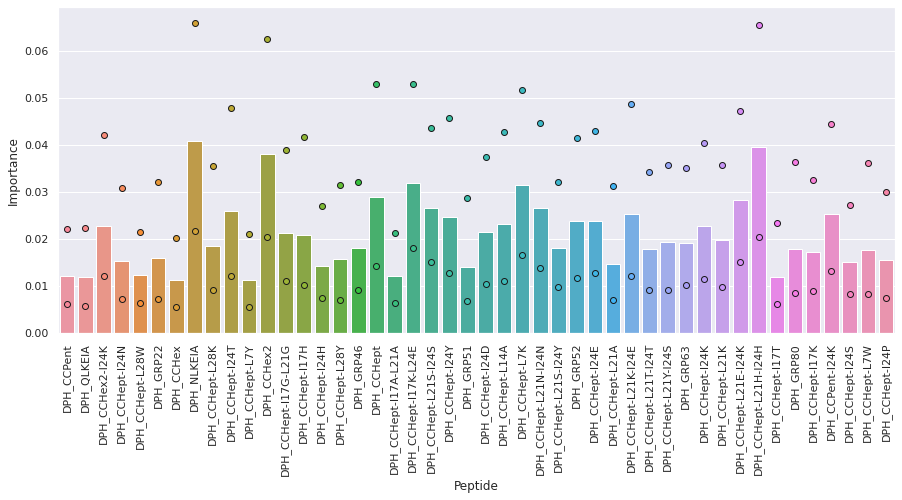

<Figure size 720x720 with 0 Axes>

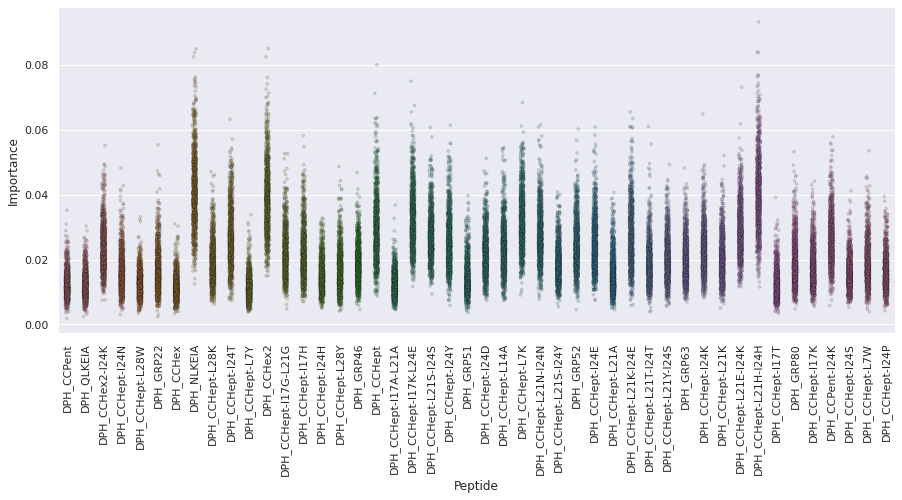

In [17]:
tree_feat_importances_df, tree_feat_importances_dict = ml.calc_feature_importances_tree(
    x=ml.x, y=ml.y, features=None, num_repeats=1000, scale=True, plt_name=''
)

In [18]:
print('Peptides ordered by importance:')
tree_feat_importances_df

Peptides ordered by importance:


,Feature,Score
0,DPH_NLKEIA,0.040842
1,DPH_CCHept-L21H-I24H,0.039631
2,DPH_CCHex2,0.038187
3,DPH_CCHept-I17K-L24E,0.031936
4,DPH_CCHept-L7K,0.031514
5,DPH_CCHept,0.028896
6,DPH_CCHept-L21E-I24K,0.028358
7,DPH_CCHept-L21N-I24N,0.026738
8,DPH_CCHept-L21S-I24S,0.026735
9,DPH_CCHept-I24T,0.025949


In this method, an ExtraTrees classifier is used to calculate importance scores. The ExtraTrees classifier trains multiple decision trees on the data. Each tree is trained with a random subset of features on a random subset of dataset, the results of these trees are then averaged to make a prediction. Importance scores are calculated as the 
average increase in purity achieved when using a particular feature to split the data across all trees in which that feature is included (i.e. the Gini importance score of the feature). When looking at the Gini importance scores of features in individual trees, correlations between the included features are reflected in the scores. However, as more and more trees, incorporating different subsets of features, are included in the average, feature correlations have less of an effect upon the importance scores. The  number of trees (plus bootstrap repeats) included here means that the correlation between features will have little effect upon the importance scores.

There is some overlap in the most important peptides identified by the ExtraTrees classifier - again, NLKEIA and CCHex2 have high scores. However, the second highest scoring peptide here, CCHept-L21H-I24H, returns a fairly low importance score in the KBest analysis => the results obtained using the two methods are similar, but not identical.

- Measure the relative importances of the peptides with permutation analysis

<Figure size 720x720 with 0 Axes>

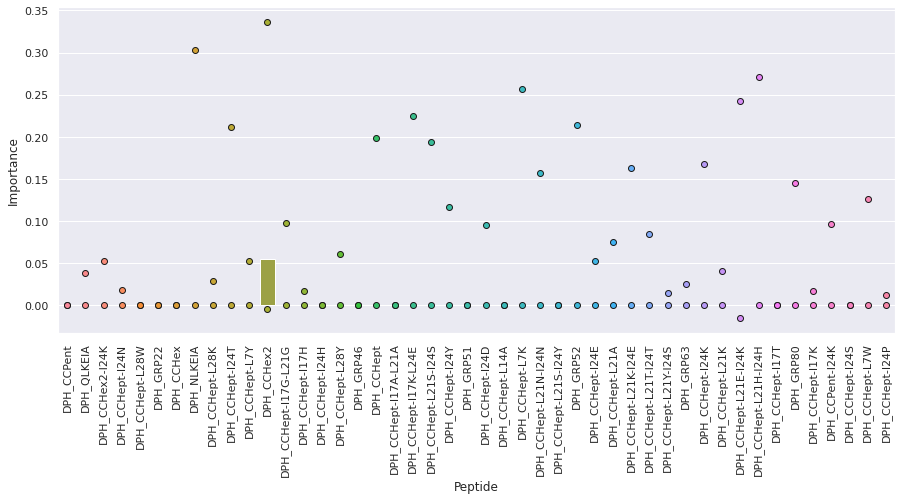

<Figure size 720x720 with 0 Axes>

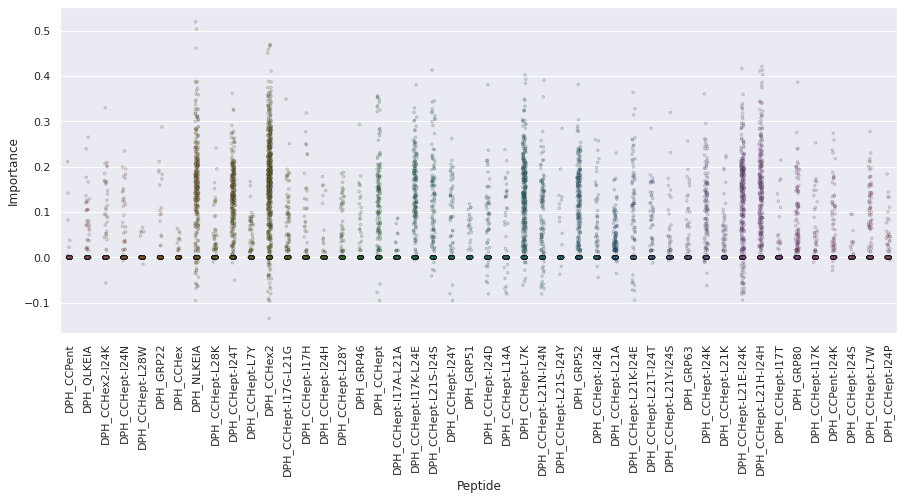

In [19]:
f1 = make_scorer(f1_score, average='weighted')
permut_feat_importances_df, permut_feat_importances_dict = ml.calc_feature_importances_permutation(
    x=ml.x, y=ml.y, features=None, classifier=AdaBoostClassifier,
    parameters={'n_estimators': np.array([10, 30, 100, 300, 1000])}, model_metric=f1,
    num_repeats=1000, scale=True, plt_name=''
)

In [20]:
print('Peptides ordered by median importance:')
permut_feat_importances_df

Peptides ordered by median importance:


,Feature,Score
0,DPH_CCHex2,0.055123
1,DPH_CCHept-I24K,0.000000
2,DPH_CCHept-L21N-I24N,0.000000
3,DPH_CCHept-L21S-I24Y,0.000000
4,DPH_GRP52,0.000000
5,DPH_CCHept-I24E,0.000000
6,DPH_CCHept-L21A,0.000000
7,DPH_CCHept-L21K-I24E,0.000000
8,DPH_CCHept-L21T-I24T,0.000000
9,DPH_CCHept-L21Y-I24S,0.000000


In [21]:
mean_permut_feat_importances_df = OrderedDict({})
for feat, score_list in permut_feat_importances_dict.items():
    mean_permut_feat_importances_df[feat] = np.mean(score_list)
mean_permut_feat_importances_df = pd.DataFrame({'Feature': list(mean_permut_feat_importances_df.keys()),
                                                'Score': list(mean_permut_feat_importances_df.values())})
mean_permut_feat_importances_df = mean_permut_feat_importances_df.sort_values(
    by=['Score'], axis=0, ascending=False
).reset_index(drop=True)

In [22]:
print('Peptides ordered by mean importance:')
mean_permut_feat_importances_df

Peptides ordered by mean importance:


,Feature,Score
0,DPH_CCHex2,0.097994
1,DPH_NLKEIA,0.048274
2,DPH_CCHept-L7K,0.042916
3,DPH_CCHept-I24T,0.038656
4,DPH_CCHept-L21H-I24H,0.037119
5,DPH_CCHept-L21E-I24K,0.036566
6,DPH_GRP52,0.026296
7,DPH_CCHept-I17K-L24E,0.024403
8,DPH_CCHept,0.018435
9,DPH_CCHept-L21S-I24S,0.014118


In permutation analysis, importance scores are calculated by training two ML models (in this case I have selected AdaBoost classifiers). The first model is trained using all features, the second is trained with one of the features randomly scrambled: the importance score of the feature is then calculated as the difference in performance (in this case measured via model F1 score) between the two models. Hence this method does take into account correlations between features, and the output importance scores represent the unique information that a feature provides about the output class label.

As can be seen from the plots, most of the features provide little unique information about the output class. Again, peptides CCHex2 and (to a lesser extent) NLKEIA are found to be the most important, CCHept-L21H-I24H is also close to the top of the rankings. CCHept-L7K is the third most important peptide identified by permutation analysis; it is also found to be one of the most important peptides by both of the other two methods. CCHex2 is found to be much the most important peptide by permutation analysis, whereas in contrast it is found to be one of several similarly important peptides by the KBest and ExtraTrees analysis.

So, whilst there is some variation in the relative order of the less important peptides, overall there is good agreement between the results obtained with all three methods. CCHex2, NLKEIA and CCHept-L7K are found to be three of the most important peptides in the dataset, whilst peptide CCHept-L21H-I24H is also identified as important by the latter two methods. 

- What percentage of the signal in the data can be measured by N principal components?

If there are more features than samples, can't run PCA. Have 45 samples, 46 peptides => need to discard one peptide if want to run PCA. Will discard peptide QLKEIA, given that as described above the fluorescence of QLKEIA and DPH is (by eye) barely distinguishable from that of DPH alone, plus it is not calculated as having a high importance score by any of the three methods above.

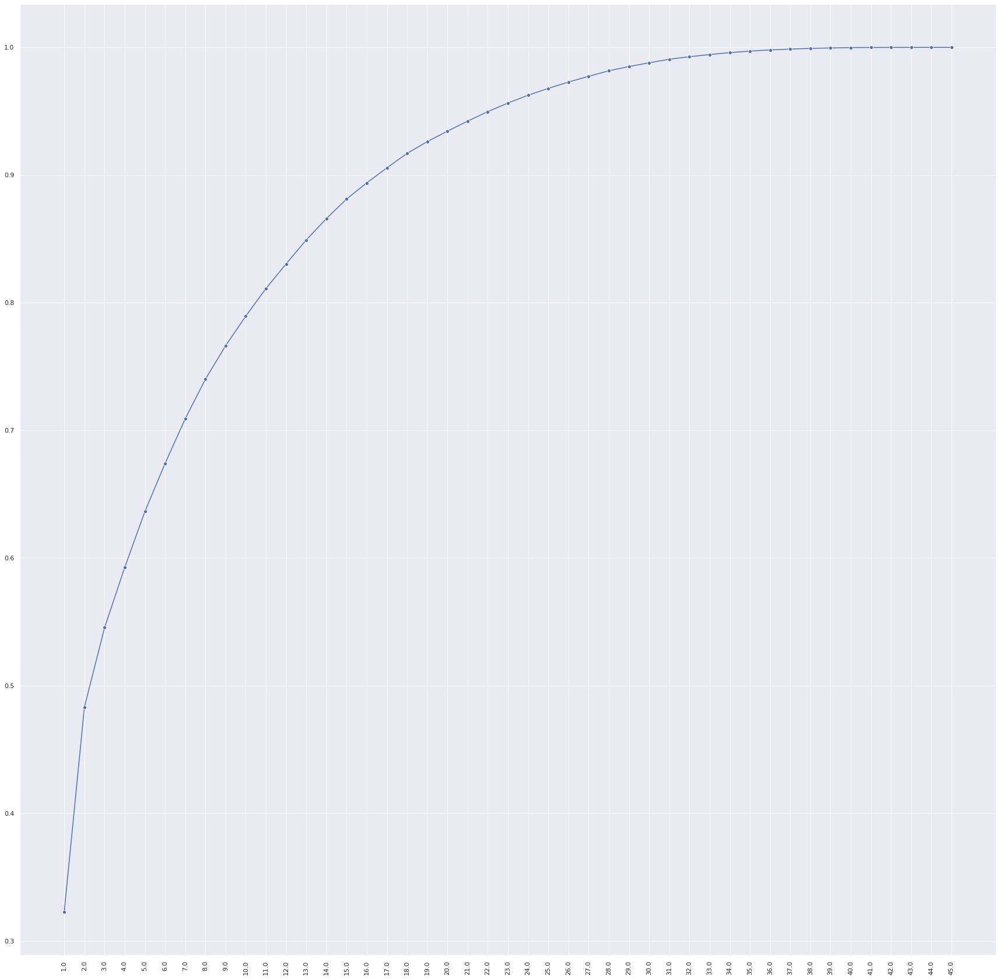

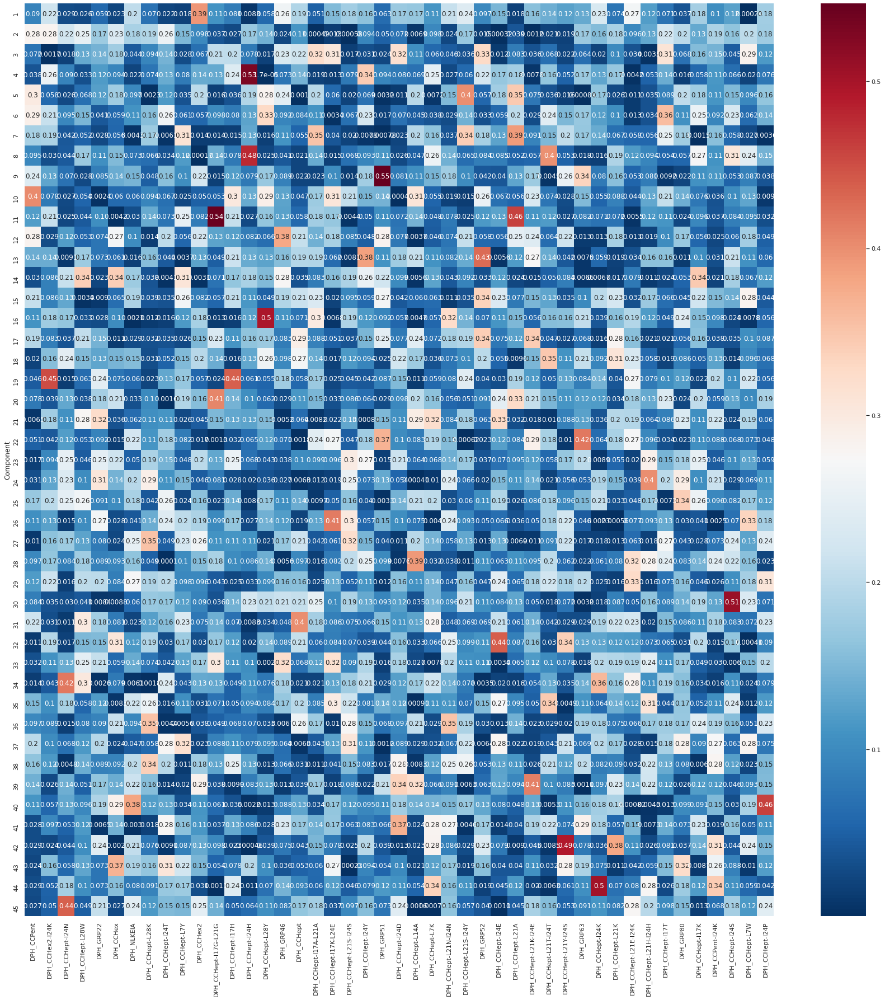

In [23]:
plt.rcParams['figure.figsize'] = (30, 30)  # Sets figure size
pca_model, pca_components = ml.run_pca(
    fluor_data=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1), scale=True, plt_name=''
)
plt.rcParams['figure.figsize'] = (10, 10)  # Resets default figure size

17 components are required to represent >90% of the variance in the data. CCHex2 makes the largest contribution to the first principal component, but several other peptides also make sizeable contributions.

Scatter plots of data transformed to PCA dimensions

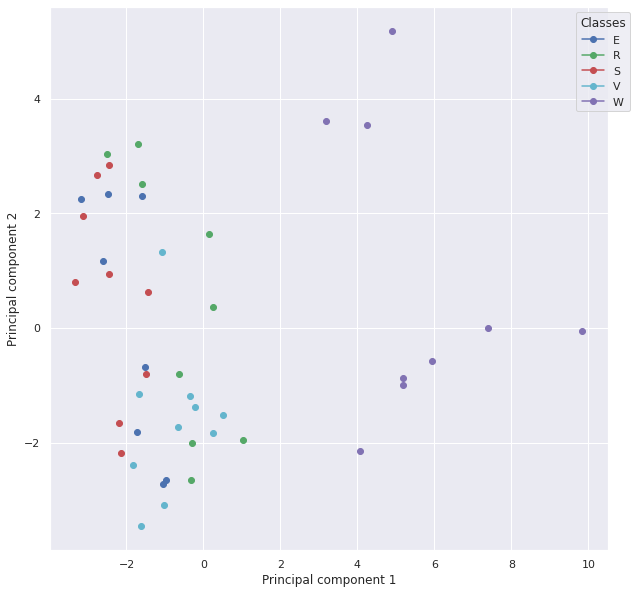

In [24]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=2, scale=True, plt_name=''
)

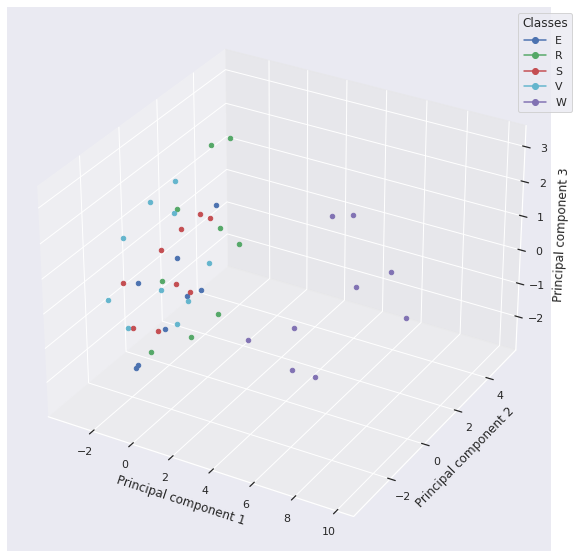

In [25]:
ml.plot_scatter_on_pca_axes(
    x=copy.deepcopy(ml.fluor_data).drop(['DPH_QLKEIA'], axis=1).to_numpy(), y=ml.y, subclasses=None,
    num_dimensions=3, scale=True, plt_name=''
)

As expected based from the scatter plots of fluorescence readings, tryptophan clusters separately from the other amino acids, whereas the other four are more difficult to distinguish from one another.

#### How well does a model trained with all features perform?

Runs grid search with nested cross-validation to spot check 5 different ML algorithms. Inner loop identifies the optimal parameter values to use with the ML algorithm; outer loop measures the performance of a model trained using these parameter values.

In [26]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

all_feat_searches = OrderedDict({})
all_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        fixed_params = ml.define_fixed_model_params(classifier=algorithm())
        if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
            fixed_params['random_state'] = 1
        tuned_params = ml.define_tuned_model_params(
            classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
        )
        nested_cv_search = ml.run_nested_CV(
            clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=list(ml.features),
            inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
            resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
            fixed_params=fixed_params, tuned_params=tuned_params, train_scoring_metric=train_scoring_metric,
            test_scoring_funcs=test_scoring_funcs, n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
            cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
        )

        all_feat_searches[
            '{}__{}'.format(algorithm.__name__, resampling_method)
        ] = copy.deepcopy(nested_cv_search)

        all_feat_score_dict['Algorithm'].append(algorithm.__name__)
        all_feat_score_dict['Resampling_method'].append(resampling_method)
        all_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
        all_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
        all_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
        all_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
        all_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
        all_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
        all_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
        all_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

        for index, params in enumerate(nested_cv_search['outer_loop_params']):
            print('\n\n\n')
            print('{}: {}'.format(algorithm.__name__, resampling_method))
            print('Parameters: {}'.format(params))
            print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
            print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))





KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 13), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 14), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.2469135802469136




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 1), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.5333333333333333




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.48148148148148145




KNeighborsClassifier: no_balancing
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 1), ('weights',

In [27]:
all_feat_score_df = pd.DataFrame(all_feat_score_dict)

In [28]:
all_feat_score_df

,Algorithm,Resampling_method,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,0.533333,0.129577,0.533333,0.129577,0.567513,0.161075,0.507372,0.144760
1,GaussianNB,no_balancing,0.622222,0.150718,0.622222,0.150718,0.614074,0.176172,0.595767,0.155922
2,LinearSVC,no_balancing,0.488889,0.113312,0.488889,0.113312,0.431111,0.144958,0.443069,0.121328
3,SVC,no_balancing,0.555556,0.099381,0.555556,0.099381,0.510370,0.154997,0.509101,0.107419
4,AdaBoostClassifier,no_balancing,0.400000,0.054433,0.400000,0.054433,0.304074,0.129695,0.308571,0.072795


In [29]:
with open('{}/All_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((all_feat_searches, all_feat_score_df), f)

There is quite a lot of variation in model performance - some of the algorithms perform well, especially given the small size of the dataset, the high number of categories, and how similar the fingerprints of four of the amino acids look by eye. One would predict therefore that with a larger dataset a substantial improvement in model performance could be obtained. Algorithm selection has a big effect upon performance, as can be seen across all of the scoring metrics calculated. Moreover, because of the small dataset size the standard deviation values associated with these scores are in all cases large. All models however perform better than random guessing (which would yield an accuracy score of ~0.2).

GaussianNB performs best => take this model forwards.

In [30]:
all_feat_searches['GaussianNB__no_balancing']['outer_loop_params']

[OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict(), OrderedDict()]

In [31]:
all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']

OrderedDict([('accuracy', OrderedDict()),
             ('recall', OrderedDict()),
             ('precision', OrderedDict()),
             ('f1', OrderedDict())])

In [32]:
all_feat_searches['GaussianNB__no_balancing']['test_scores']['accuracy']

[0.5555555555555556,
 0.6666666666666666,
 0.5555555555555556,
 0.8888888888888888,
 0.4444444444444444]

In [33]:
all_feat_nested_pred = all_feat_searches['GaussianNB__no_balancing']['predictions']
all_feat_nested_y_true = all_feat_searches['GaussianNB__no_balancing']['y_true']
all_feat_nested_x_true = all_feat_searches['GaussianNB__no_balancing']['x_true']

all_feat_flat_pred = np.array([pred for pred_array in all_feat_nested_pred for pred in pred_array])
all_feat_flat_y_true = np.array([y for y_array in all_feat_nested_y_true for y in y_array])
all_feat_flat_x_true = np.array([x for x_array in all_feat_nested_x_true for x in x_array])

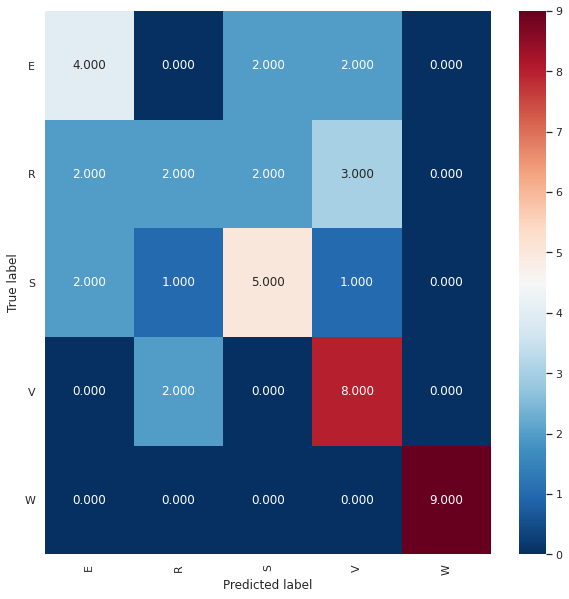

Normalised over true label (rows)


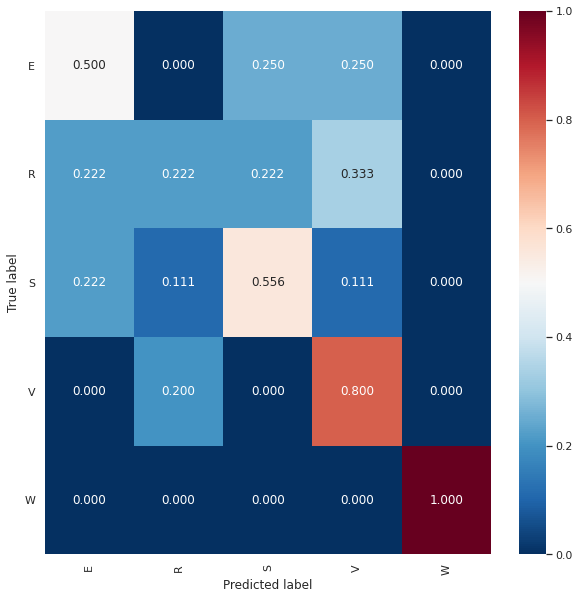

Normalised over pred label (columns)


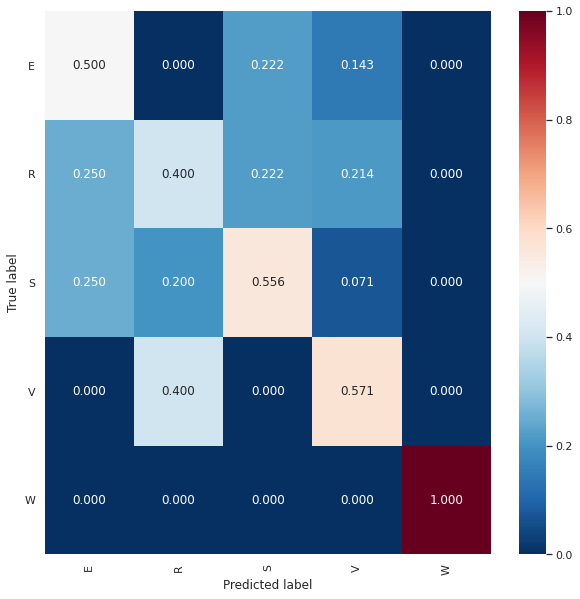

In [34]:
draw_conf_matrices(all_feat_flat_y_true, all_feat_flat_pred, ml.results_dir, 'All_features')

In [35]:
all_feat_true_hue = []
for index, y in enumerate(all_feat_flat_y_true):
    if all_feat_flat_pred[index] == y:
        all_feat_true_hue.append('{}_correct'.format(y))
    else:
        all_feat_true_hue.append('{}_incorrect'.format(y))

sub_all_feat_true_hue = []
sub_all_feat_flat_x_true = []
sub_all_feat_flat_y_true = []
for i, true_hue in enumerate(all_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_all_feat_true_hue.append(true_hue)
        sub_all_feat_flat_x_true.append(all_feat_flat_x_true[i])
        sub_all_feat_flat_y_true.append(all_feat_flat_y_true[i])

all_feat_true_hue = np.array(all_feat_true_hue)
sub_all_feat_true_hue = np.array(sub_all_feat_true_hue)
sub_all_feat_flat_x_true = np.array(sub_all_feat_flat_x_true)
sub_all_feat_flat_y_true = np.array(sub_all_feat_flat_y_true)

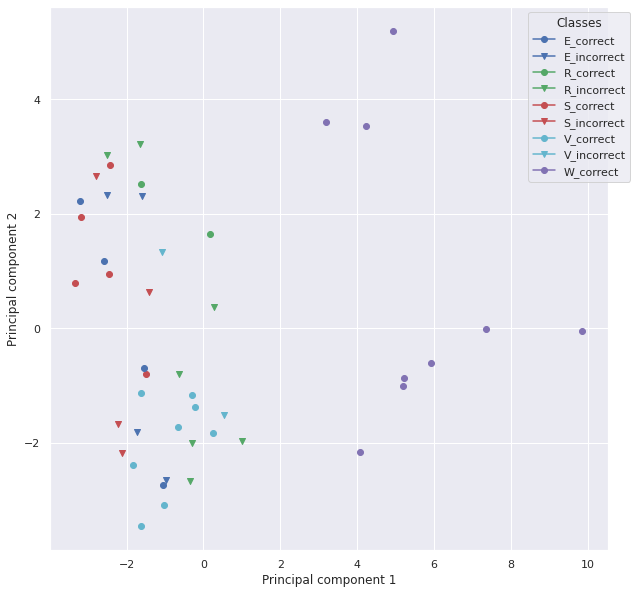

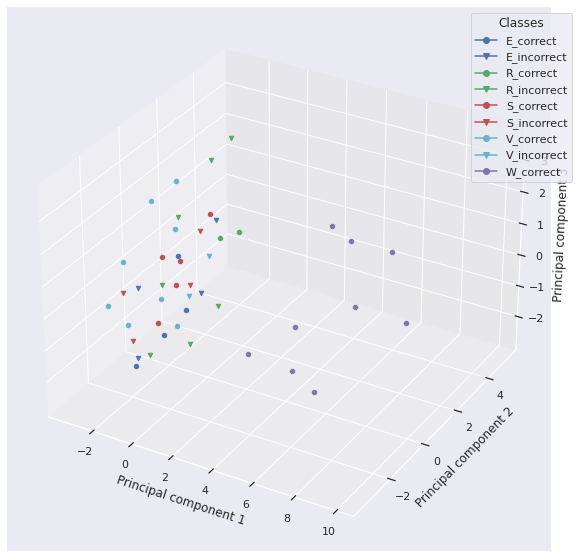

In [36]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=all_feat_flat_x_true, y=all_feat_flat_y_true, subclasses=all_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='All_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

As expected from the earlier analysis in this notebook, the trained model can readily distinguish Trp (there are no false positives or false negatives for Trp). It also is fairly good at identifying Val, whereas it struggles more with Ser, Arg and Glu. There is consequently a rough correlation between an amino acid's hydrophobicity and the ability of the model to identify it. This makes sense - more hydrophobic molecules tend to be more effective at interacting with the barrels (=> greater effect upon DPH fluorescence).

#### Is it possible to maintain/improve model performance when reducing the number of peptides?

Sequentially include features via their feature importance (as measured via KBest/permutation analysis), measure if there is any difference in trained classifier performance.

In [37]:
algorithms = [KNeighborsClassifier, GaussianNB, LinearSVC, SVC, AdaBoostClassifier]
resampling_methods = ['no_balancing']  # Classes are ~ balanced, plus the dataset is quite small => decided
# not to test any data resampling methods such as oversampling and SMOTE, etc.
num_features_list = [1, 2, 3, 4, 5, 10, 15, 20, 30, 46]

ordered_features = {'KBest_Fscore': kbest_feat_importances_df['Feature'].tolist(),
                    'Permutation_score': mean_permut_feat_importances_df['Feature'].tolist()}

n_components_pca = None
inner_splits = None
outer_splits = None
run = 'gridsearch'
n_iter = None
cv_folds_inner_loop = 3
cv_folds_outer_loop = 5
train_scoring_metric = make_scorer(f1_score, average='weighted', zero_division=0)
test_scoring_funcs={accuracy_score: {},
                    recall_score: {'average': 'weighted',
                                   'zero_division': 0},
                    precision_score: {'average': 'weighted',
                                      'zero_division': 0},
                    f1_score: {'average': 'weighted',
                               'zero_division': 0}}

red_feat_searches = OrderedDict({})
red_feat_score_dict = OrderedDict({'Algorithm': [],
                                   'Resampling_method': [],
                                   'Feature_selection_method': [],
                                   'Num_features': [],
                                   'Average_accuracy': [],
                                   'Std_dev_accuracy': [],
                                   'Average_recall': [],
                                   'Std_dev_recall': [],
                                   'Average_precision': [],
                                   'Std_dev_precision': [],
                                   'Average_f1': [],
                                   'Std_dev_f1': []})
for algorithm in algorithms:
    for resampling_method in resampling_methods:
        for feat_method, all_features in ordered_features.items():
            for num_features in num_features_list:
                fixed_params = ml.define_fixed_model_params(classifier=algorithm())
                if algorithm.__name__ in ['LinearSVC', 'SVC', 'AdaBoostClassifier']:
                    fixed_params['random_state'] = 1
                tuned_params = ml.define_tuned_model_params(
                    classifier=algorithm(), x_train=ml.x, n_folds=cv_folds_inner_loop
                )
                selected_features = all_features[:num_features]

                nested_cv_search = ml.run_nested_CV(
                    clf=algorithm, x=ml.x, y=ml.y, groups=None, selected_features=selected_features,
                    inner_splits=inner_splits, outer_splits=outer_splits, const_split=True,
                    resampling_method=resampling_method, n_components_pca=n_components_pca, run=run,
                    fixed_params=fixed_params, tuned_params=tuned_params,
                    train_scoring_metric=train_scoring_metric, test_scoring_funcs=test_scoring_funcs,
                    n_iter=n_iter, cv_folds_inner_loop=cv_folds_inner_loop,
                    cv_folds_outer_loop=cv_folds_outer_loop, draw_conf_mat=False, plt_name=''
                )

                red_feat_searches[
                    '{}__{}__{}__{}'.format(algorithm.__name__, resampling_method, feat_method, num_features)
                ] = copy.deepcopy(nested_cv_search)

                red_feat_score_dict['Algorithm'].append(algorithm.__name__)
                red_feat_score_dict['Resampling_method'].append(resampling_method)
                red_feat_score_dict['Average_accuracy'].append(nested_cv_search['average_test_scores']['accuracy'])
                red_feat_score_dict['Feature_selection_method'].append(feat_method)
                red_feat_score_dict['Num_features'].append(num_features)
                red_feat_score_dict['Std_dev_accuracy'].append(nested_cv_search['stddev_test_scores']['accuracy'])
                red_feat_score_dict['Average_recall'].append(nested_cv_search['average_test_scores']['recall'])
                red_feat_score_dict['Std_dev_recall'].append(nested_cv_search['stddev_test_scores']['recall'])
                red_feat_score_dict['Average_precision'].append(nested_cv_search['average_test_scores']['precision'])
                red_feat_score_dict['Std_dev_precision'].append(nested_cv_search['stddev_test_scores']['precision'])
                red_feat_score_dict['Average_f1'].append(nested_cv_search['average_test_scores']['f1'])
                red_feat_score_dict['Std_dev_f1'].append(nested_cv_search['stddev_test_scores']['f1'])

                for index, params in enumerate(nested_cv_search['outer_loop_params']):
                    print('\n\n\n')
                    print('{}: {},  {},  {}'.format(
                        algorithm.__name__, resampling_method, feat_method, num_features
                    ))
                    print('Parameters: {}'.format(params))
                    print('Accuracy: {}'.format(nested_cv_search['test_scores']['accuracy'][index]))
                    print('F1: {}'.format(nested_cv_search['test_scores']['f1'][index]))






KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 7), ('p', 1), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.4158730158730159




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.3333333333333333




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.3333333333333333
F1: 0.3333333333333333




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 4), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5037037037037037




KNeighborsClassifier: no_balancing,  KBest_Fscore,  1
Parameters: Order





KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 1), ('weights', 'distance')])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 9), ('p', 2), ('weights', 'distance')])
Accuracy: 0.5555555555555556
F1: 0.4232804232804233




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.6666666666666666
F1: 0.6814814814814815




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 10), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




KNeighborsClassifier: no_balancing,  KBest_Fscore,  30
Parameters





KNeighborsClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 8), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




KNeighborsClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 6), ('p', 2), ('weights', 'distance')])
Accuracy: 0.6666666666666666
F1: 0.5925925925925926




KNeighborsClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 5), ('p', 2), ('weights', 'uniform')])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




KNeighborsClassifier: no_balancing,  Permutation_score,  10
Parameters: OrderedDict([('metric', 'minkowski'), ('n_jobs', -1), ('n_neighbors', 3), ('p', 1), ('weights', 'uniform')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




KNeighborsClassifier: no_balancing,  Permutatio





GaussianNB: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




GaussianNB: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict()
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




GaussianNB: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.3851851851851852




GaussianNB: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6037037037037037




GaussianNB: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5925925925925926




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




GaussianNB: no_balancing,  KBest_Fscore,  10
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.533333





GaussianNB: no_balancing,  Permutation_score,  20
Parameters: OrderedDict()
Accuracy: 0.5555555555555556
F1: 0.5259259259259259




GaussianNB: no_balancing,  Permutation_score,  20
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7703703703703704




GaussianNB: no_balancing,  Permutation_score,  20
Parameters: OrderedDict()
Accuracy: 0.4444444444444444
F1: 0.37037037037037035




GaussianNB: no_balancing,  Permutation_score,  20
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6296296296296295




GaussianNB: no_balancing,  Permutation_score,  20
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.5777777777777778




GaussianNB: no_balancing,  Permutation_score,  30
Parameters: OrderedDict()
Accuracy: 0.6666666666666666
F1: 0.6666666666666666




GaussianNB: no_balancing,  Permutation_score,  30
Parameters: OrderedDict()
Accuracy: 0.7777777777777778
F1: 0.7703703703703704




GaussianNB: no_balancing,  Permutation_score,  30
Parameters: OrderedDi

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125






LinearSVC: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.1111111111111111
F1: 0.1111111111111111




LinearSVC: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LinearSVC: no_balancing,  KBest_Fscore,  15
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.3333333333333333
F1: 0.2962962962962963




LinearSVC: no_balancing, 





LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.5555555555555556
F1: 0.5185185185185185




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 4.0)])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 32.0)])
Accuracy: 0.5555555555555556
F1: 0.5148148148148147




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.125)])
Accuracy: 0.7777777777777778
F1: 0.6962962962962962




LinearSVC: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.0625)])
Accuracy: 0.5555555555555556
F1: 0.518518

LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 1.0)])
Accuracy: 0.5555555555555556
F1: 0.5555555555555556




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.5)])
Accuracy: 0.6666666666666666
F1: 0.6222222222222222




LinearSVC: no_balancing,  Permutation_score,  20
Parameters: OrderedDict([('dual', False), ('max_iter', 10000), ('random_state', 1), ('C', 0.03125)])
Accuracy: 0.6666666666666666
F1: 0.6666666666666666
Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 0.03125


Range tested: [0.03125, 





SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.3111111111111111




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 4.0), ('gamma', 0.015625), ('kernel', 'rbf')])
Accuracy: 0.3333333333333333
F1: 0.28571428571428575




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 16384.0), ('gamma', 0.0009765625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.3851851851851852




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 1.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.34920634920634924




SVC: no_balancing,  KBest_Fscore,  5
Parameters: OrderedDict([('random_state', 1), ('C', 256.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.7777777777777778
F1: 0.7703703703703703




SVC: no_balancing,  KBest_

Range tested: [0.03125, 0.0625, 0.125, 0.25, 0.5, 1.0, 2.0, 4.0, 8.0, 16.0, 32.0, 64.0, 128.0, 256.0, 512.0, 1024.0, 2048.0, 4096.0, 8192.0, 16384.0, 32768.0]
Value selected: 32768.0






SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 32768.0), ('gamma', 0.00048828125), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 1.0), ('gamma', 0.125), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.4444444444444444




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 2048.0), ('gamma', 0.0078125), ('kernel', 'rbf')])
Accuracy: 0.5555555555555556
F1: 0.5333333333333333




SVC: no_balancing,  Permutation_score,  4
Parameters: OrderedDict([('random_state', 1), ('C', 16.0), ('gamma', 0.0625), ('kernel', 'rbf')])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




SVC: no_balanc





AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.5555555555555556
F1: 0.5481481481481482




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.2222222222222222
F1: 0.21164021164021163




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.3333333333333333
F1: 0.2469135802469136




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 31)])
Accuracy: 0.4444444444444444
F1: 0.4444444444444444




AdaBoostClassifier: no_balancing,  KBest_Fscore,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 1000)])
Accuracy: 0.4444444444444444
F1: 0.4




AdaBoostClassifier: no_balancing,  KBest_Fscore,  4
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Ac





AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.3862433862433863




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.3333333333333333




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 100)])
Accuracy: 0.2222222222222222
F1: 0.09876543209876544




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 10)])
Accuracy: 0.4444444444444444
F1: 0.40740740740740733




AdaBoostClassifier: no_balancing,  Permutation_score,  3
Parameters: OrderedDict([('random_state', 1), ('n_estimators', 3162)])
Accuracy: 0.5555555555555556
F1: 0.49259259259259264




AdaBoostClassifier: no_balancing,  Permutation_score,  4
Parameters: OrderedDict

In [38]:
red_feat_score_df = pd.DataFrame(red_feat_score_dict)

In [39]:
red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,KBest_Fscore,1,0.466667,0.108866,0.466667,0.108866,0.428889,0.090915,0.422434,0.081531
1,KNeighborsClassifier,no_balancing,KBest_Fscore,2,0.577778,0.108866,0.577778,0.108866,0.638889,0.091475,0.573333,0.092352
2,KNeighborsClassifier,no_balancing,KBest_Fscore,3,0.444444,0.070273,0.444444,0.070273,0.433333,0.142773,0.423704,0.099975
3,KNeighborsClassifier,no_balancing,KBest_Fscore,4,0.466667,0.129577,0.466667,0.129577,0.436296,0.176281,0.431323,0.143380
4,KNeighborsClassifier,no_balancing,KBest_Fscore,5,0.488889,0.150718,0.488889,0.150718,0.437037,0.135881,0.448148,0.130252
...,...,...,...,...,...,...,...,...,...,...,...,...
95,AdaBoostClassifier,no_balancing,Permutation_score,10,0.333333,0.140546,0.333333,0.140546,0.323333,0.174984,0.292063,0.123606
96,AdaBoostClassifier,no_balancing,Permutation_score,15,0.355556,0.108866,0.355556,0.108866,0.297407,0.140074,0.290582,0.094971
97,AdaBoostClassifier,no_balancing,Permutation_score,20,0.333333,0.157135,0.333333,0.157135,0.323333,0.214116,0.292063,0.153326
98,AdaBoostClassifier,no_balancing,Permutation_score,30,0.355556,0.108866,0.355556,0.108866,0.297407,0.140074,0.290582,0.094971


In [40]:
with open('{}/Red_features_CV_search_models.pkl'.format(ml.results_dir), 'wb') as f:
    pickle.dump((red_feat_searches, red_feat_score_df), f)

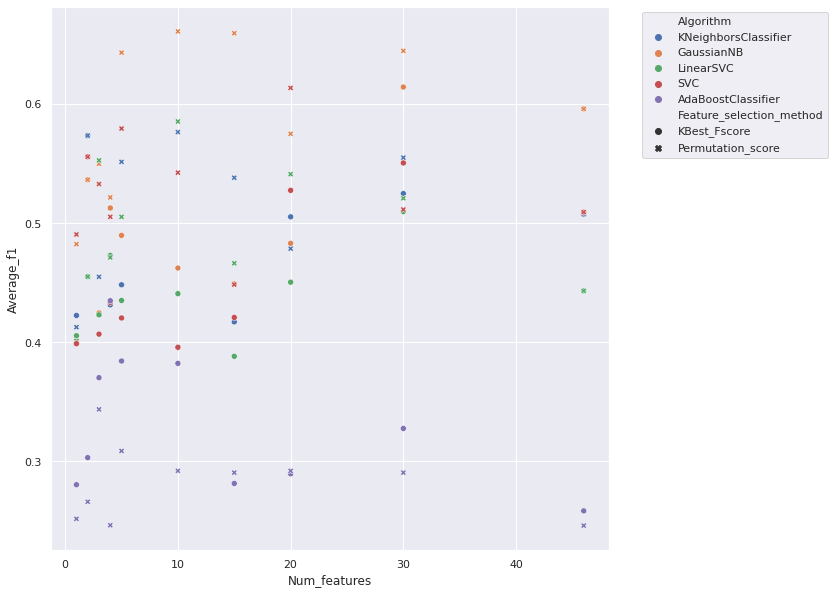

In [41]:
plt.clf()
sns.scatterplot(
    x=red_feat_score_df['Num_features'], y=red_feat_score_df['Average_f1'],
    hue=red_feat_score_df['Algorithm'], style=red_feat_score_df['Feature_selection_method']
)
plt.legend(bbox_to_anchor=(1.05,1))
plt.savefig('{}/Number_of_features_vs_performance_scatter_plot.svg'.format(ml.results_dir))
plt.show()

So, from the plot above, appears that model performance plateaus after ~2-5 features have been included (depending upon the algorithm). Model perfprmance is also affected by the feature selection method, with permutation scoring in general more effective at achieving a better performance with a smaller number of peptides.

In [42]:
sub_red_feat_score_df = red_feat_score_df[
      (red_feat_score_df['Num_features'] == 2)
    & (red_feat_score_df['Feature_selection_method'] == 'Permutation_score')
].reset_index(drop=True)

In [43]:
sub_red_feat_score_df

,Algorithm,Resampling_method,Feature_selection_method,Num_features,Average_accuracy,Std_dev_accuracy,Average_recall,Std_dev_recall,Average_precision,Std_dev_precision,Average_f1,Std_dev_f1
0,KNeighborsClassifier,no_balancing,Permutation_score,2,0.577778,0.108866,0.577778,0.108866,0.638889,0.091475,0.573333,0.092352
1,GaussianNB,no_balancing,Permutation_score,2,0.577778,0.163299,0.577778,0.163299,0.533333,0.209971,0.536296,0.176887
2,LinearSVC,no_balancing,Permutation_score,2,0.511111,0.133333,0.511111,0.133333,0.460370,0.207869,0.455026,0.158059
3,SVC,no_balancing,Permutation_score,2,0.577778,0.129577,0.577778,0.129577,0.596296,0.184220,0.555556,0.138024
4,AdaBoostClassifier,no_balancing,Permutation_score,2,0.355556,0.108866,0.355556,0.108866,0.270476,0.182198,0.266102,0.134262


KNeighbors model with 2 features selected by permutation analysis (or by KBest analysis, since they select the same two most important features) achieves the best performance of this subset.

In [44]:
red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['outer_loop_params']

[OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 3),
              ('p', 1),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 4),
              ('p', 1),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 7),
              ('p', 2),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 8),
              ('p', 2),
              ('weights', 'uniform')]),
 OrderedDict([('metric', 'minkowski'),
              ('n_jobs', -1),
              ('n_neighbors', 3),
              ('p', 2),
              ('weights', 'uniform')])]

In [45]:
red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['best_outer_loop_params']

OrderedDict([('accuracy',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 3),
                           ('p', 1),
                           ('weights', 'uniform')])),
             ('recall',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 3),
                           ('p', 1),
                           ('weights', 'uniform')])),
             ('precision',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 3),
                           ('p', 2),
                           ('weights', 'uniform')])),
             ('f1',
              OrderedDict([('metric', 'minkowski'),
                           ('n_jobs', -1),
                           ('n_neighbors', 3),
                           ('p', 1),
                         

In [46]:
red_feat_nested_pred = red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['predictions']
red_feat_nested_y_true = red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['y_true']
red_feat_nested_x_true = red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['x_true']

red_feat_flat_pred = np.array([pred for pred_array in red_feat_nested_pred for pred in pred_array])
red_feat_flat_y_true = np.array([y for y_array in red_feat_nested_y_true for y in y_array])
red_feat_flat_x_true = np.array([x for x_array in red_feat_nested_x_true for x in x_array])

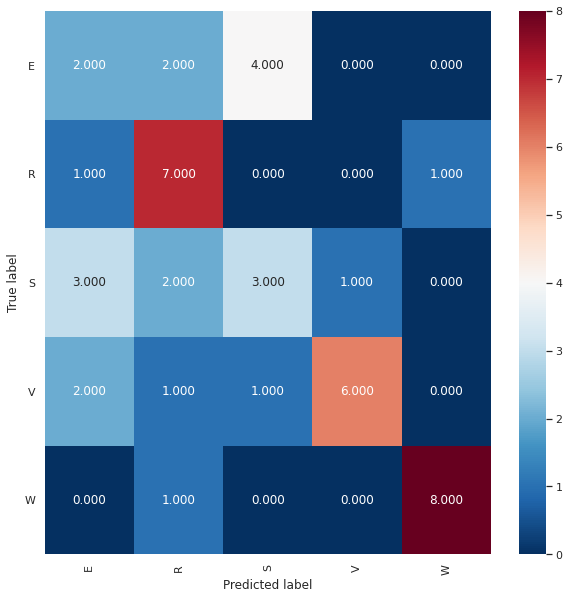

Normalised over true label (rows)


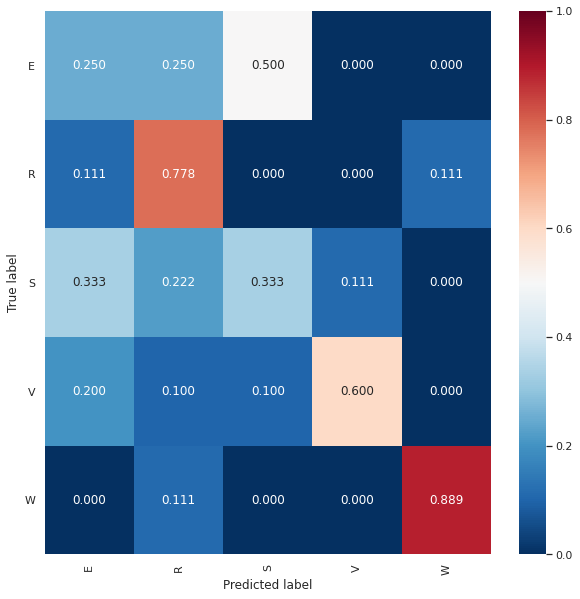

Normalised over pred label (columns)


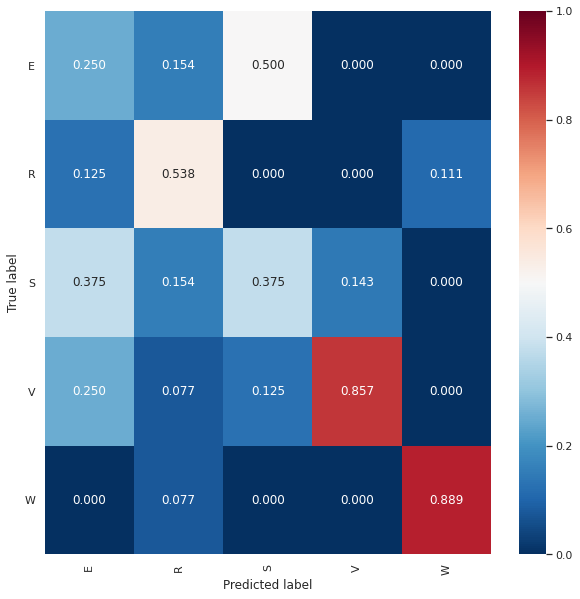

In [47]:
draw_conf_matrices(red_feat_flat_y_true, red_feat_flat_pred, ml.results_dir, 'Red_features')

In [48]:
red_feat_true_hue = []
for index, y in enumerate(red_feat_flat_y_true):
    if red_feat_flat_pred[index] == y:
        red_feat_true_hue.append('{}_correct'.format(y))
    else:
        red_feat_true_hue.append('{}_incorrect'.format(y))

sub_red_feat_true_hue = []
sub_red_feat_flat_x_true = []
sub_red_feat_flat_y_true = []
for i, true_hue in enumerate(red_feat_true_hue):
    if true_hue.endswith('_incorrect'):
        sub_red_feat_true_hue.append(true_hue)
        sub_red_feat_flat_x_true.append(red_feat_flat_x_true[i])
        sub_red_feat_flat_y_true.append(red_feat_flat_y_true[i])

red_feat_true_hue = np.array(red_feat_true_hue)
sub_red_feat_true_hue = np.array(sub_red_feat_true_hue)
sub_red_feat_flat_x_true = np.array(sub_red_feat_flat_x_true)
sub_red_feat_flat_y_true = np.array(sub_red_feat_flat_y_true)

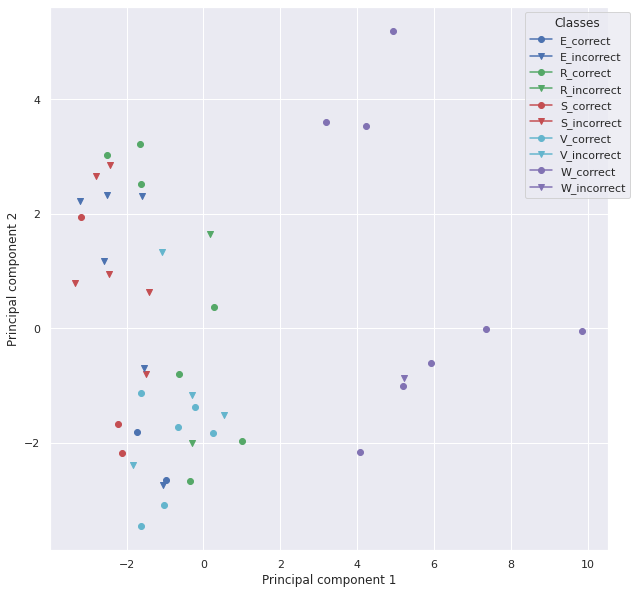

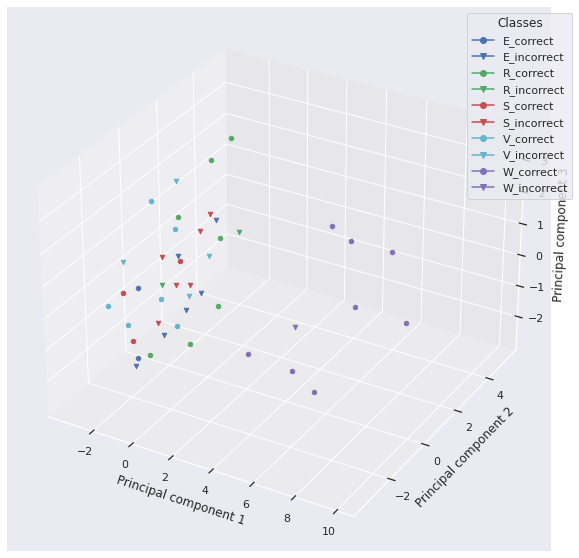

In [49]:
# Scatter plot (axes = top two principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=2,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# Scatter plot (axes = top three principal components)
ml.plot_scatter_on_pca_axes(
    x=red_feat_flat_x_true, y=red_feat_flat_y_true, subclasses=red_feat_true_hue, num_dimensions=3,
    scale=True, plt_name='Red_features_coloured_by_pred'
)

# E_incorrect = Value that is actually E is predicted to be something else

Predictions obtained from this second model are largely similar to those obtained from the first model - again, Trp is identified easily, whilst Val is also identified fairly well. In comparison with the first model (trained with all features), this second model does a better job at identifying Arg, but at slight detriment to its ability to distinguish Glu and Ser.

Is there a significant difference between the two models?

In [50]:
params_1 = all_feat_searches['GaussianNB__no_balancing']['best_outer_loop_params']['f1']
selected_features_1 = list(ml.features)
params_2 = red_feat_searches['KNeighborsClassifier__no_balancing__Permutation_score__2']['best_outer_loop_params']['f1']
selected_features_2 = mean_permut_feat_importances_df['Feature'].tolist()[:2]

print('Model 1:')
print('Algorithm: GaussianNB')
print('Parameters:\n-')
print('Features:\n{}'.format(selected_features_1))
print('\n\n\n')
print('Model 2:')
print('Algorithm: KNeighborsClassifier')
print('Parameters:\n-')
print('Features:\n{}'.format(selected_features_2))

F, p = ml.run_5x2_CV_combined_F_test(
    x=ml.x, y=ml.y, selected_features_1=selected_features_1, selected_features_2=selected_features_2,
    classifier_1=GaussianNB, classifier_2=KNeighborsClassifier, params_1=params_1, params_2=params_2,
    resampling_method_1='no_balancing', resampling_method_2='no_balancing',
    n_components_pca_1=None, n_components_pca_2=None
)

Model 1:
Algorithm: GaussianNB
Parameters:
-
Features:
['DPH_CCPent', 'DPH_QLKEIA', 'DPH_CCHex2-I24K', 'DPH_CCHept-I24N', 'DPH_CCHept-L28W', 'DPH_GRP22', 'DPH_CCHex', 'DPH_NLKEIA', 'DPH_CCHept-L28K', 'DPH_CCHept-I24T', 'DPH_CCHept-L7Y', 'DPH_CCHex2', 'DPH_CCHept-I17G-L21G', 'DPH_CCHept-I17H', 'DPH_CCHept-I24H', 'DPH_CCHept-L28Y', 'DPH_GRP46', 'DPH_CCHept', 'DPH_CCHept-I17A-L21A', 'DPH_CCHept-I17K-L24E', 'DPH_CCHept-L21S-I24S', 'DPH_CCHept-I24Y', 'DPH_GRP51', 'DPH_CCHept-I24D', 'DPH_CCHept-L14A', 'DPH_CCHept-L7K', 'DPH_CCHept-L21N-I24N', 'DPH_CCHept-L21S-I24Y', 'DPH_GRP52', 'DPH_CCHept-I24E', 'DPH_CCHept-L21A', 'DPH_CCHept-L21K-I24E', 'DPH_CCHept-L21T-I24T', 'DPH_CCHept-L21Y-I24S', 'DPH_GRP63', 'DPH_CCHept-I24K', 'DPH_CCHept-L21K', 'DPH_CCHept-L21E-I24K', 'DPH_CCHept-L21H-I24H', 'DPH_CCHept-I17T', 'DPH_GRP80', 'DPH_CCHept-I17K', 'DPH_CCPent-I24K', 'DPH_CCHept-I24S', 'DPH_CCHept-L7W', 'DPH_CCHept-I24P']




Model 2:
Algorithm: KNeighborsClassifier
Parameters:
-
Features:
['DPH_CCHex2', '

In [52]:
print('F score: {}'.format(F))
print('p value: {}'.format(p))

F score: 0.9061292276604155
p value: 0.5835891125715229


So, there is no significant difference in performance when the number of features is reduced from 46 to 2.